In [8]:
import pandas as pd
import numpy as np
import config
import os
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import numpy as np

In [9]:
pip install snowflake-connector-python[pandas]

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install xlsxwriter

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install snowflake-sqlalchemy

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [12]:
# The Snowflake Connector library.
import snowflake.connector as snow
from snowflake.connector.pandas_tools import write_pandas

In [13]:
from sqlalchemy import create_engine
from snowflake.sqlalchemy import URL

In [14]:
# Set up the Snowflake connection
user = config.credentials['USERNAME']
password = config.credentials['PASSWORD']
account = 'PCA67849'
warehouse = config.credentials['WAREHOUSE']

conn = snow.connect(
    user=user,
    password=password,
    account=account,
    warehouse=warehouse, 
    database='',       # The database you want to use
    schema='' 
)

In [15]:
# Get your list of skills including Category Name
skills_query = """
SELECT "Skill", "Category Name" 
FROM TEMPORARY_DATA.JNANIA."ADE_LC_skills_v5_2025_03_10"
"""
skills_df = pd.read_sql(skills_query, conn)
skills = skills_df["Skill"].tolist()

# Create a dictionary to map skills to their categories for later use
skill_to_category = dict(zip(skills_df["Skill"], skills_df["Category Name"]))

/tmp/ipykernel_38116/1092952322.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  skills_df = pd.read_sql(skills_query, conn)


In [16]:
# Query to get skill-occupation relationships with SOC2 filtering only
skill_occ_query = f"""
WITH base_postings AS (
    SELECT 
        ID,
        SOC_2021_2,
        SOC_2021_2_NAME,
        YEAR(POSTED) AS YEAR
    FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS
    WHERE YEAR(POSTED) BETWEEN 2022 AND 2024 -- Years has been updated to pool 3 years of data
        AND SOC_2021_2 IS NOT NULL
        AND SOC_2021_2 != '99-0000'
        AND ARRAY_SIZE(SKILLS) > 0
        AND (SALARY_TO > 0 OR SALARY > 0 OR SALARY_FROM > 0)
        AND ARRAY_CONTAINS('Company'::VARIANT, SOURCE_TYPES)
        AND IS_INTERNSHIP = FALSE
        AND COMPANY_IS_STAFFING = FALSE
        -- AND SOC_2021_2 IN ('11-0000', '13-0000', '15-0000', '17-0000', '19-0000') These filter for professional occupations
),
soc2_counts AS (
    SELECT 
        SOC_2021_2,
        COUNT(DISTINCT ID) AS soc2_post_count
    FROM base_postings
    GROUP BY SOC_2021_2
)
SELECT 
    bp.SOC_2021_2,
    bp.SOC_2021_2_NAME,
    sc2.soc2_post_count,
    ps.SKILL_NAME,
    COUNT(DISTINCT bp.ID) AS N
FROM base_postings bp
JOIN soc2_counts sc2 ON bp.SOC_2021_2 = sc2.SOC_2021_2
JOIN BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS_SKILLS ps ON bp.ID = ps.ID
WHERE ps.SKILL_NAME IN ({', '.join([f"'{skill}'" for skill in skills])})
GROUP BY bp.SOC_2021_2, bp.SOC_2021_2_NAME, sc2.soc2_post_count, ps.SKILL_NAME
"""

# Execute query and get data
# Occ Skills is by soc2, has posting count for each soc2 and the N for each skill 
occ_skills = pd.read_sql(skill_occ_query, conn)

/tmp/ipykernel_38116/1361410074.py:42: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  occ_skills = pd.read_sql(skill_occ_query, conn)


In [17]:
occ_skills

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N
0,49-0000,"Installation, Maintenance, and Repair Occupations",330540,Evidence Analysis,1
1,13-0000,Business and Financial Operations Occupations,456471,Heuristic Analysis,1
2,49-0000,"Installation, Maintenance, and Repair Occupations",330540,Risk Awareness,1
3,31-0000,Healthcare Support Occupations,269635,Questioning Skills,1
4,33-0000,Protective Service Occupations,164416,Decision Making Software,1
...,...,...,...,...,...
1819,37-0000,Building and Grounds Cleaning and Maintenance ...,143647,Recognizing Others,4
1820,55-0000,Military-only occupations,1665,Risk Analytics,2
1821,21-0000,Community and Social Service Occupations,156826,Hindsight,3
1822,47-0000,Construction and Extraction Occupations,72921,Decision Analysis,2


In [21]:
filtered_df = occ_skills[occ_skills['SOC_2021_2'] == '15-0000']

In [23]:
filtered_df

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N
11,15-0000,Computer and Mathematical Occupations,458539,Diagrammatic Reasoning,1
21,15-0000,Computer and Mathematical Occupations,458539,Self-Discipline,5457
26,15-0000,Computer and Mathematical Occupations,458539,Curiosity,11029
35,15-0000,Computer and Mathematical Occupations,458539,Attribution Analysis,59
81,15-0000,Computer and Mathematical Occupations,458539,Negotiation,10351
...,...,...,...,...,...
1783,15-0000,Computer and Mathematical Occupations,458539,Recognizing Others,11
1784,15-0000,Computer and Mathematical Occupations,458539,Measurement Uncertainty,7
1789,15-0000,Computer and Mathematical Occupations,458539,Cognitive Flexibility,7
1798,15-0000,Computer and Mathematical Occupations,458539,Rhetoric,9


In [24]:
# Query to calculate share of postings that mention any skill from your skill dataframe by SOC2
skill_occ_query = f"""
WITH base_postings AS (
    SELECT 
        ID,
        SOC_2021_2,
        SOC_2021_2_NAME,
        YEAR(POSTED) AS YEAR
    FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS
    WHERE YEAR(POSTED) BETWEEN 2022 AND 2024 -- years updated to pool 3 years of data
        AND SOC_2021_2 IS NOT NULL
        AND SOC_2021_2 != '99-0000'
        AND ARRAY_SIZE(SKILLS) > 0
        AND (SALARY_TO > 0 OR SALARY > 0 OR SALARY_FROM > 0)
        AND ARRAY_CONTAINS('Company'::VARIANT, SOURCE_TYPES)
        AND IS_INTERNSHIP = FALSE
        AND COMPANY_IS_STAFFING = FALSE
),
-- Count total postings by SOC2 to use as denominator
soc2_counts AS (
    SELECT 
        SOC_2021_2,
        SOC_2021_2_NAME,
        COUNT(DISTINCT ID) AS total_postings
    FROM base_postings
    GROUP BY SOC_2021_2, SOC_2021_2_NAME
),
-- Count postings with at least one skill from your skills dataframe
postings_with_skills AS (
    SELECT 
        bp.SOC_2021_2,
        COUNT(DISTINCT bp.ID) AS skill_postings
    FROM base_postings bp
    JOIN BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS_SKILLS ps ON bp.ID = ps.ID
    WHERE ps.SKILL_NAME IN (
        -- This will be replaced with your Python variable containing skills
        {', '.join([f"'{skill}'" for skill in skills])}
    )
    GROUP BY bp.SOC_2021_2
)
-- Final query to calculate shares
SELECT 
    sc.SOC_2021_2,
    sc.SOC_2021_2_NAME,
    sc.total_postings,
    COALESCE(ps.skill_postings, 0) AS skill_postings,
    COALESCE(ps.skill_postings / NULLIF(sc.total_postings, 0), 0) AS skill_share
FROM soc2_counts sc
LEFT JOIN postings_with_skills ps ON sc.SOC_2021_2 = ps.SOC_2021_2
ORDER BY skill_share DESC;
"""
# Execute query and get data
occ_skills_share = pd.read_sql(skill_occ_query, conn)

/tmp/ipykernel_38116/1375194659.py:53: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  occ_skills_share = pd.read_sql(skill_occ_query, conn)


In [25]:
occ_skills_share

,SOC_2021_2,SOC_2021_2_NAME,TOTAL_POSTINGS,SKILL_POSTINGS,SKILL_SHARE
0,15-0000,Computer and Mathematical Occupations,458539,313455,0.683595
1,13-0000,Business and Financial Operations Occupations,456471,305166,0.668533
2,17-0000,Architecture and Engineering Occupations,163315,99762,0.610856
3,23-0000,Legal Occupations,28353,16729,0.590026
4,11-0000,Management Occupations,764137,425423,0.556737
5,19-0000,"Life, Physical, and Social Science Occupations",76186,41965,0.550823
6,33-0000,Protective Service Occupations,164416,86957,0.528884
7,27-0000,"Arts, Design, Entertainment, Sports, and Media...",156737,70111,0.447316
8,43-0000,Office and Administrative Support Occupations,583203,257960,0.442316
9,49-0000,"Installation, Maintenance, and Repair Occupations",330540,144645,0.437602


In [26]:
# Query to calculate share of each skill across all postings that have at least one skill from your dataframe
skill_occ_query = f"""
-- Query to calculate overall share of postings with any skill from your dataframe
WITH base_postings AS (
    SELECT 
        COUNT(DISTINCT ID) AS total_postings
    FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS
    WHERE YEAR(POSTED) BETWEEN 2023 AND 2024 -- YEARS HERE WILL NEED TO BE CHANGED RO INCLUDE 2022 POOLED 3 YEARS DATA
        AND SOC_2021_2 IS NOT NULL
        AND SOC_2021_2 != '99-0000'
        AND ARRAY_SIZE(SKILLS) > 0
        AND (SALARY_TO > 0 OR SALARY > 0 OR SALARY_FROM > 0)
        AND ARRAY_CONTAINS('Company'::VARIANT, SOURCE_TYPES)
        AND IS_INTERNSHIP = FALSE
        AND COMPANY_IS_STAFFING = FALSE
),
postings_with_skills AS (
    SELECT 
        COUNT(DISTINCT bp.ID) AS skill_postings
    FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS bp
    JOIN BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS_SKILLS ps ON bp.ID = ps.ID
    WHERE YEAR(bp.POSTED) BETWEEN 2023 AND 2024
        AND bp.SOC_2021_2 IS NOT NULL
        AND bp.SOC_2021_2 != '99-0000'
        AND ARRAY_SIZE(bp.SKILLS) > 0
        AND (bp.SALARY_TO > 0 OR bp.SALARY > 0 OR bp.SALARY_FROM > 0)
        AND ARRAY_CONTAINS('Company'::VARIANT, bp.SOURCE_TYPES)
        AND bp.IS_INTERNSHIP = FALSE
        AND bp.COMPANY_IS_STAFFING = FALSE
        AND ps.SKILL_NAME IN (
            {', '.join([f"'{skill}'" for skill in skills])}
        )
)
-- Calculate the overall share as a single number
SELECT 
    (SELECT total_postings FROM base_postings) AS total_postings,
    (SELECT skill_postings FROM postings_with_skills) AS skill_postings,
    (SELECT skill_postings FROM postings_with_skills) / 
    (SELECT total_postings FROM base_postings) * 100 AS overall_skill_share
"""
# Execute query and get data
post_with_decision_skill = pd.read_sql(skill_occ_query, conn)

/tmp/ipykernel_38116/2084012305.py:42: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  post_with_decision_skill = pd.read_sql(skill_occ_query, conn)


In [27]:
post_with_decision_skill

,TOTAL_POSTINGS,SKILL_POSTINGS,OVERALL_SKILL_SHARE
0,5465790,2275959,41.6401


In [28]:
# Ensure all column names are uppercase from the beginning
occ_skills.columns = [col.upper() for col in occ_skills.columns]

In [29]:
# Count the total number of occupations for TF-IDF calculation
all_occ_cnt = occ_skills['SOC_2021_2'].nunique()


In [30]:
# Add category information
occ_skills['SKILL_CATEGORY'] = occ_skills['SKILL_NAME'].map(skill_to_category)

In [31]:
# Calculate metrics in Python as in the original code
# Calculate skill share within each occupation
occ_skills_by_onet = occ_skills.groupby('SOC_2021_2')
occ_skills['SKILL_SHARE'] = occ_skills.apply(
    lambda x: x['N'] / occ_skills_by_onet.get_group(x['SOC_2021_2'])['N'].sum(),
    axis=1
)
occ_skills['SKILL_RATE'] = occ_skills['N'] / occ_skills['SOC2_POST_COUNT']



In [32]:
# Filter low-frequency skills
occ_skills = occ_skills[(occ_skills['N'] > 50) | (occ_skills['SKILL_RATE'] > 0.02)]

In [33]:
# Calculate skill total and count of occupations with each skill
skill_totals = occ_skills.groupby('SKILL_NAME')['N'].sum().reset_index(name='SKILL_TOTAL')
skill_in_occs = occ_skills.groupby('SKILL_NAME').size().reset_index(name='SKILL_IN_OCCS_COUNT')

# Merge these back to the main dataframe - ensure we keep all our columns during merges
occ_skills = pd.merge(occ_skills, skill_totals, on='SKILL_NAME', how='left')
occ_skills = pd.merge(occ_skills, skill_in_occs, on='SKILL_NAME', how='left')

In [34]:
# Calculate TF-IDF
occ_skills['TF_IDF'] = occ_skills['SKILL_SHARE'] * np.log(all_occ_cnt / occ_skills['SKILL_IN_OCCS_COUNT'])

In [35]:
# Calculate RCA (Revealed Comparative Advantage)
total_N = occ_skills['N'].sum()
occ_skills['RCA'] = occ_skills['SKILL_SHARE'] * total_N / occ_skills['SKILL_TOTAL']

# Additional processing for skill importance
skill_importance = occ_skills.copy()

In [36]:
# Calculate symmetric RCA (SRCA) and other metrics
skill_importance['SRCA'] = (skill_importance['RCA'] - 1) / (skill_importance['RCA'] + 1) + 1
skill_importance['RCA_SKILL_SHARE'] = skill_importance['RCA'] * skill_importance['SKILL_SHARE']
skill_importance['RCA_SKILL_RATE'] = skill_importance['RCA'] * skill_importance['SKILL_RATE']
skill_importance['RCA_TF_IDF'] = skill_importance['RCA'] * skill_importance['TF_IDF']
skill_importance['SRCA_SKILL_SHARE'] = skill_importance['SRCA'] * skill_importance['SKILL_SHARE']
skill_importance['SRCA_SKILL_RATE'] = skill_importance['SRCA'] * skill_importance['SKILL_RATE']
skill_importance['SRCA_TF_IDF'] = skill_importance['SRCA'] * skill_importance['TF_IDF']

# Add small sample flag for Skill Posting Count
skill_importance['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] = skill_importance['SKILL_TOTAL'] < 500

# Sort by occupation and descending skill rate
skill_importance = skill_importance.sort_values(by=['SOC_2021_2', 'RCA_SKILL_RATE'], ascending=[True, False])


In [37]:
skill_importance

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,TF_IDF,RCA,SRCA,RCA_SKILL_SHARE,RCA_SKILL_RATE,RCA_TF_IDF,SRCA_SKILL_SHARE,SRCA_SKILL_RATE,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,0.000000,0.881373,0.936947,0.149469,0.163424,0.000000,0.158893,0.173728,0.000000,False
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,0.006409,1.991659,1.331475,0.140309,0.153408,0.012764,0.093800,0.102557,0.008533,False
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,0.000000,1.303244,1.131659,0.111807,0.122246,0.000000,0.097087,0.106151,0.000000,False
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,0.004956,1.559219,1.218512,0.084946,0.092877,0.007728,0.066385,0.072583,0.006039,False
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,0.000000,0.850283,0.919084,0.073244,0.080083,0.000000,0.079171,0.086562,0.000000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,0.002113,1.521804,1.206917,0.072326,0.044786,0.003215,0.057361,0.035519,0.002550,False
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,0.000000,0.987185,0.993551,0.064153,0.039725,0.000000,0.064566,0.039981,0.000000,False
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,0.002026,1.032912,1.016190,0.047087,0.029157,0.002093,0.046325,0.028685,0.002059,False
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,0.000000,1.011089,1.005514,0.044131,0.027327,0.000000,0.043888,0.027176,0.000000,False


In [38]:
# Create Z scores for each soc2 basket

#  Copy the original SOC2‐aggregated DataFrame
soc2_importance_transformed = skill_importance.copy()

# 2) Min–max “z‑score” in [0,1] within each SOC2 for SRCA_TF_IDF
soc2_importance_transformed['SRCA_TF_IDF_ZSCORE'] = (
    soc2_importance_transformed
      .groupby('SOC_2021_2')['SRCA_TF_IDF']
      .transform(lambda x: 
          (x - x.min()) / (x.max() - x.min()) 
          if (x.max() - x.min()) > 0 else 0
      )
)

#  Percentile rank within each SOC2 for SRCA_TF_IDF
soc2_importance_transformed['SRCA_TF_IDF_PERCENTILE'] = (
    soc2_importance_transformed
      .groupby('SOC_2021_2')['SRCA_TF_IDF']
      .transform(lambda x: x.rank(pct=True))
)

#  Min–max “z‑score” in [0,1] within each SOC2 for TF_IDF
soc2_importance_transformed['TF_IDF_ZSCORE'] = (
    soc2_importance_transformed
      .groupby('SOC_2021_2')['TF_IDF']
      .transform(lambda x: 
          (x - x.min()) / (x.max() - x.min()) 
          if (x.max() - x.min()) > 0 else 0
      )
)

#  Percentile rank within each SOC2 for TF_IDF
soc2_importance_transformed['TF_IDF_PERCENTILE'] = (
    soc2_importance_transformed
      .groupby('SOC_2021_2')['TF_IDF']
      .transform(lambda x: x.rank(pct=True))
)

#  repeat the pattern
if 'RCA_TF_IDF' in soc2_importance_transformed.columns:
    soc2_importance_transformed['RCA_TF_IDF_ZSCORE'] = (
        soc2_importance_transformed
          .groupby('SOC_2021_2')['RCA_TF_IDF']
          .transform(lambda x: 
              (x - x.min()) / (x.max() - x.min()) 
              if (x.max() - x.min()) > 0 else 0
          )
    )
    soc2_importance_transformed['RCA_TF_IDF_PERCENTILE'] = (
        soc2_importance_transformed
          .groupby('SOC_2021_2')['RCA_TF_IDF']
          .transform(lambda x: x.rank(pct=True))
    )



In [39]:
soc2_importance_transformed

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,...,SRCA_SKILL_SHARE,SRCA_SKILL_RATE,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL,SRCA_TF_IDF_ZSCORE,SRCA_TF_IDF_PERCENTILE,TF_IDF_ZSCORE,TF_IDF_PERCENTILE,RCA_TF_IDF_ZSCORE,RCA_TF_IDF_PERCENTILE
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,...,0.158893,0.173728,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,...,0.093800,0.102557,0.008533,False,0.861508,0.974026,0.854245,0.987013,0.789920,0.961039
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,...,0.097087,0.106151,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,...,0.066385,0.072583,0.006039,False,0.609711,0.935065,0.660618,0.961039,0.478237,0.922078
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,...,0.079171,0.086562,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,...,0.057361,0.035519,0.002550,False,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,...,0.064566,0.039981,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,...,0.046325,0.028685,0.002059,False,0.807605,0.875000,0.959184,0.875000,0.651038,0.875000
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,...,0.043888,0.027176,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500


Filtering out skills with insufficient sample size (SKILL_TOTAL < 500)
SKILL_TOTAL represents the number of job postings mentioning this skill in this occupation
After filtering: (978, 26) (removed 45 rows)
Found 23 SOC2 groups
Processing 1/23: Management Occupations


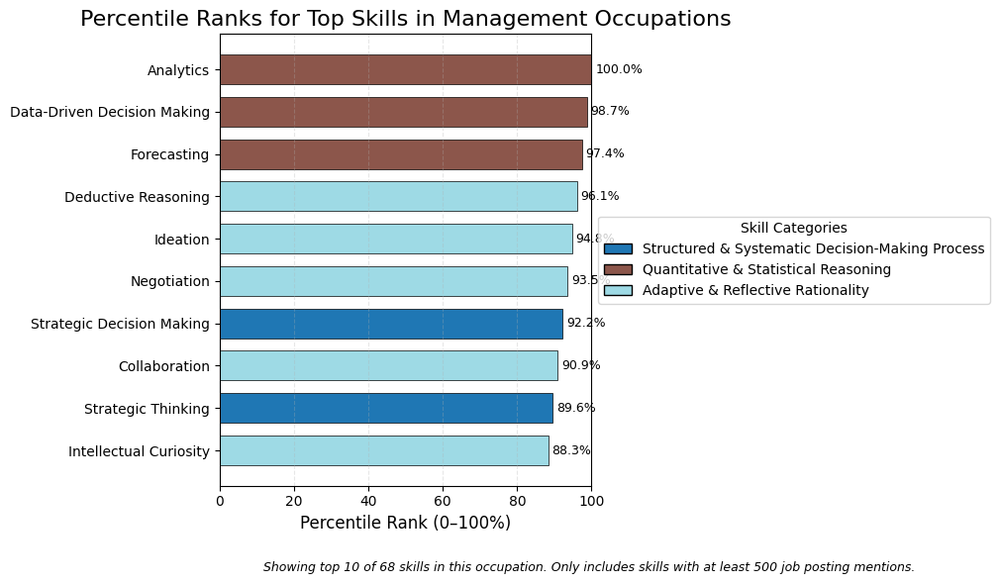

Processing 2/23: Business and Financial Operations Occupations


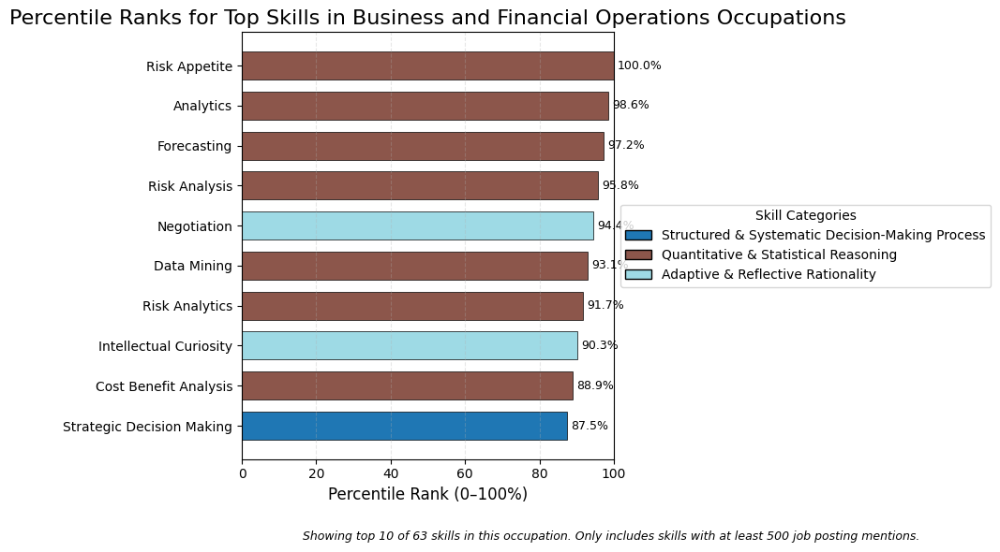

Processing 3/23: Computer and Mathematical Occupations


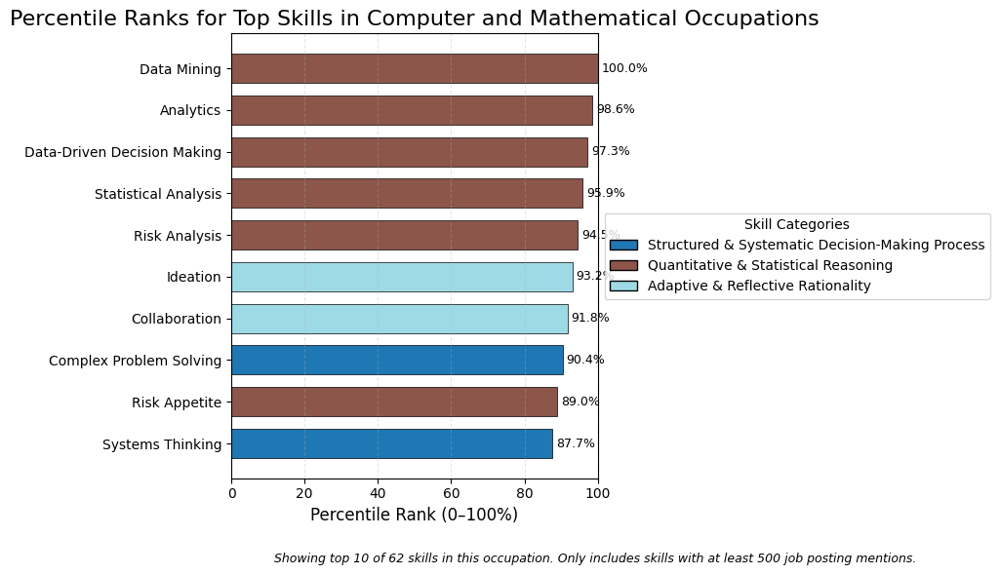

Processing 4/23: Architecture and Engineering Occupations


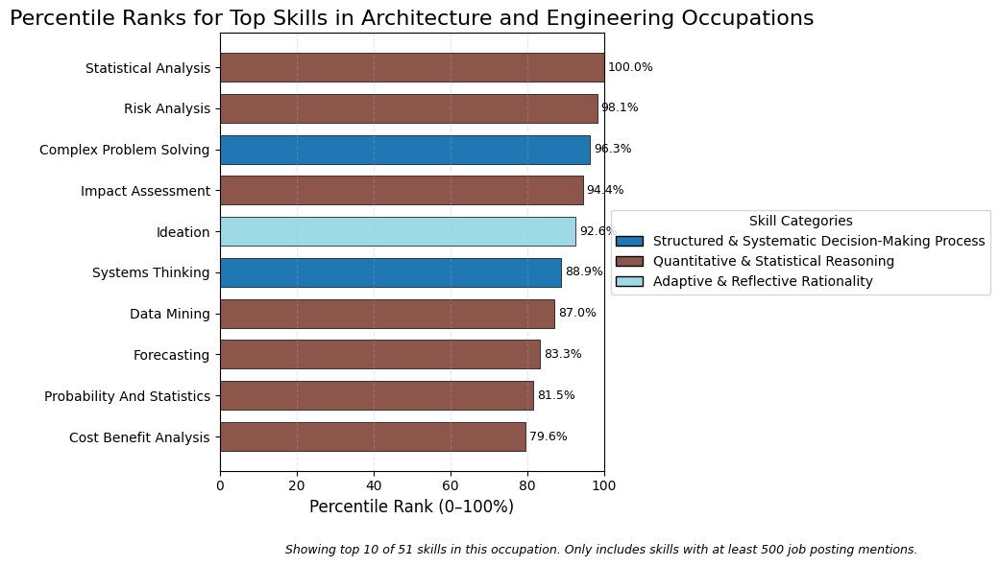

Processing 5/23: Life, Physical, and Social Science Occupations


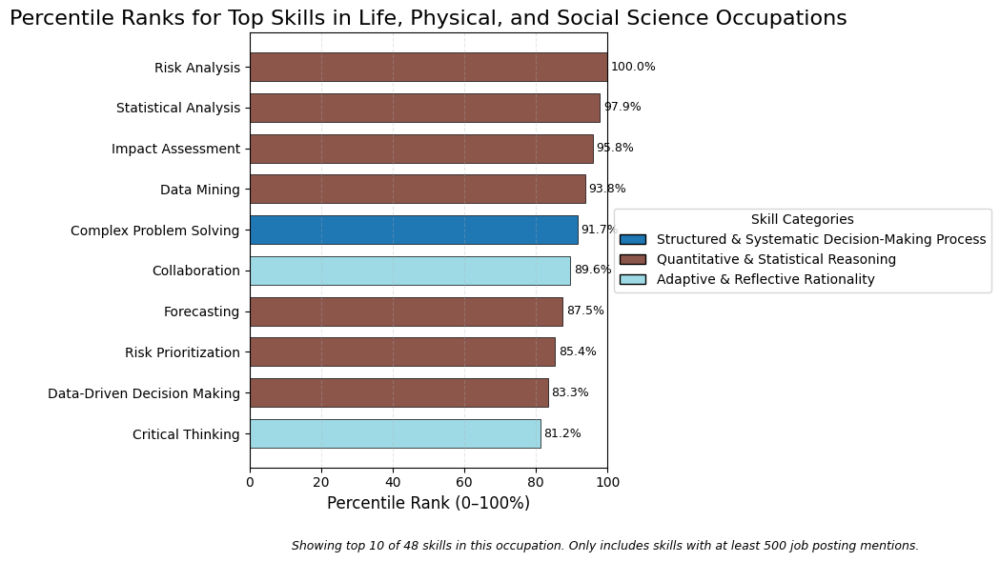

Processing 6/23: Community and Social Service Occupations


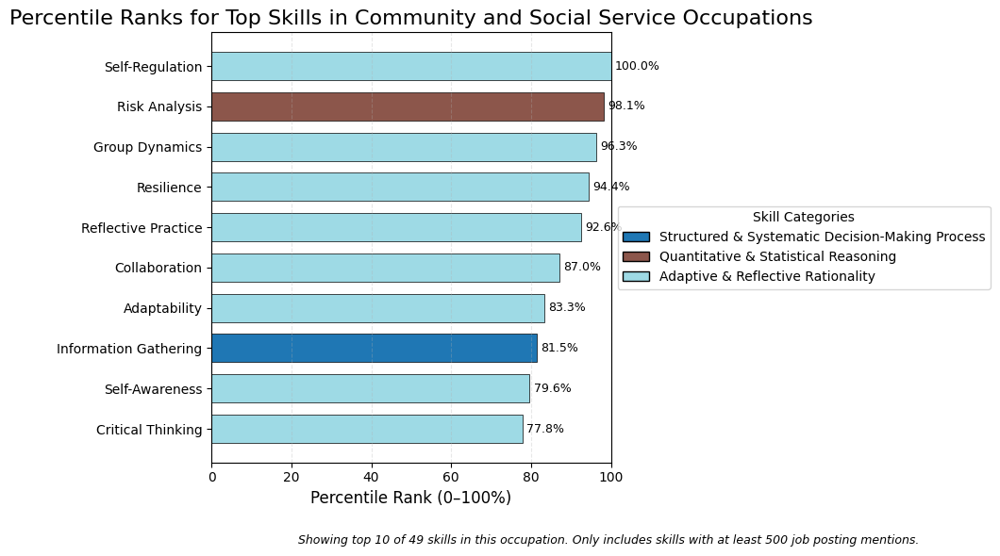

Processing 7/23: Legal Occupations


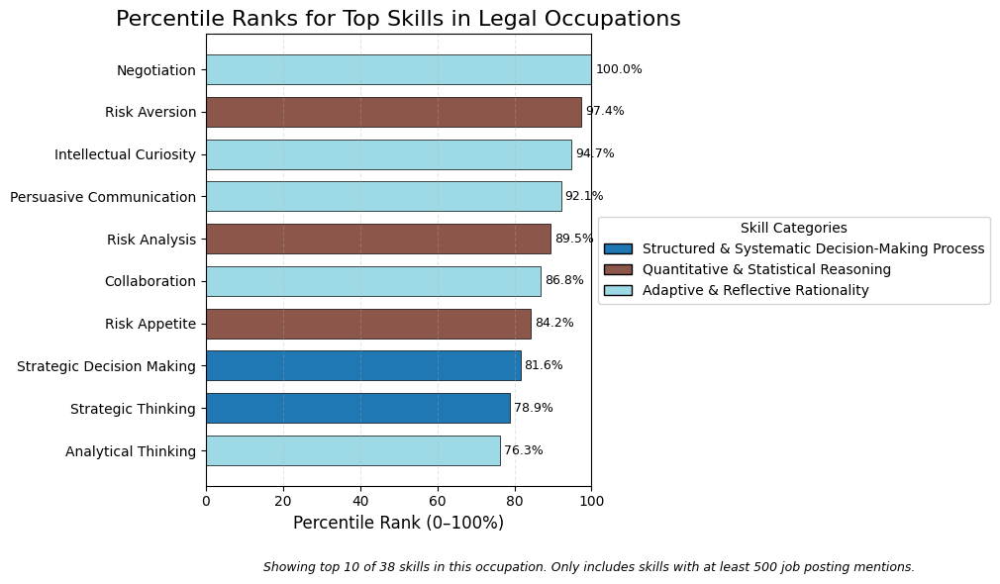

Processing 8/23: Educational Instruction and Library Occupations


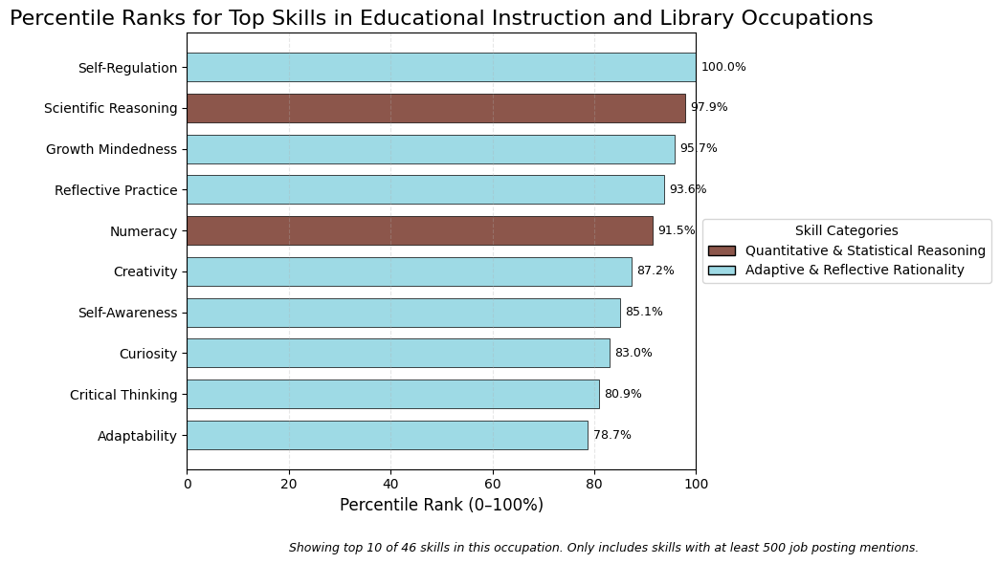

Processing 9/23: Arts, Design, Entertainment, Sports, and Media Occupations


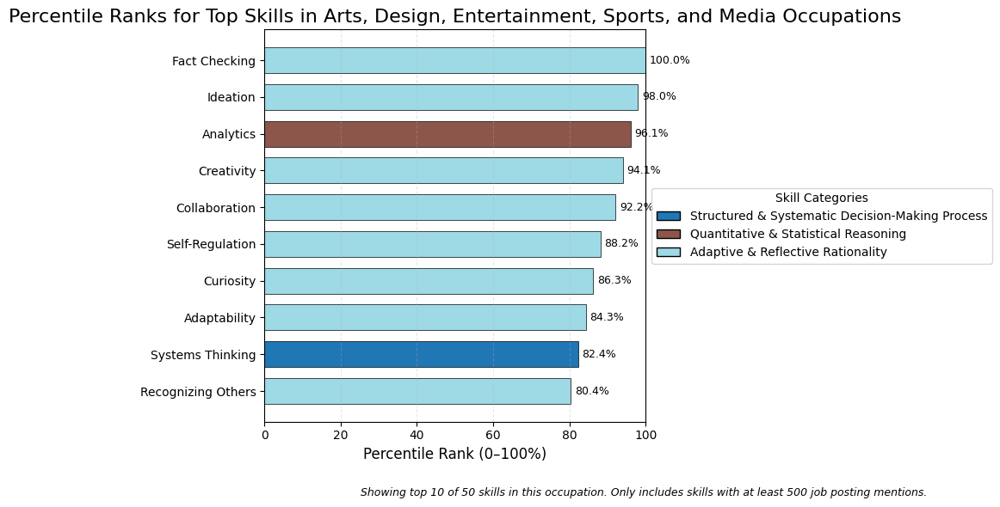

Processing 10/23: Healthcare Practitioners and Technical Occupations


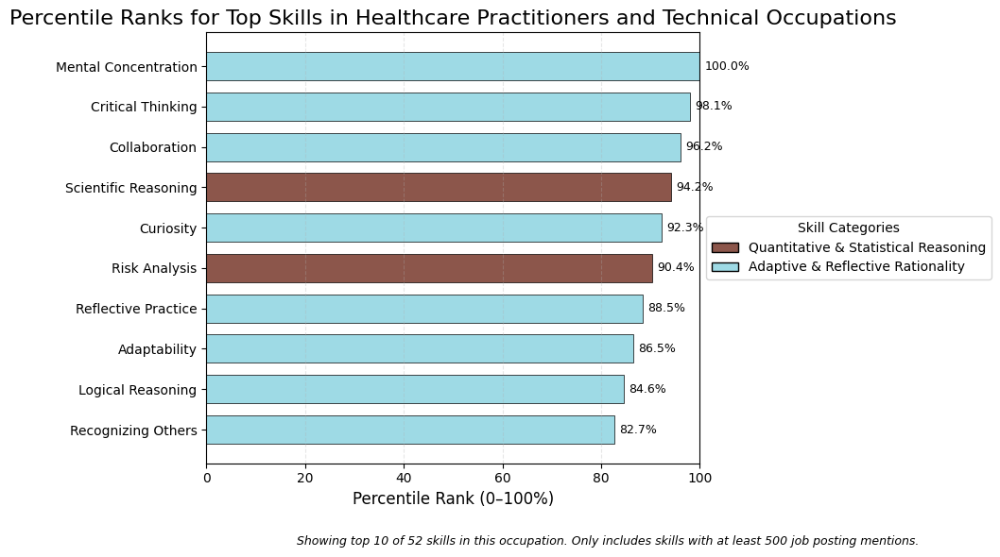

Processing 11/23: Healthcare Support Occupations


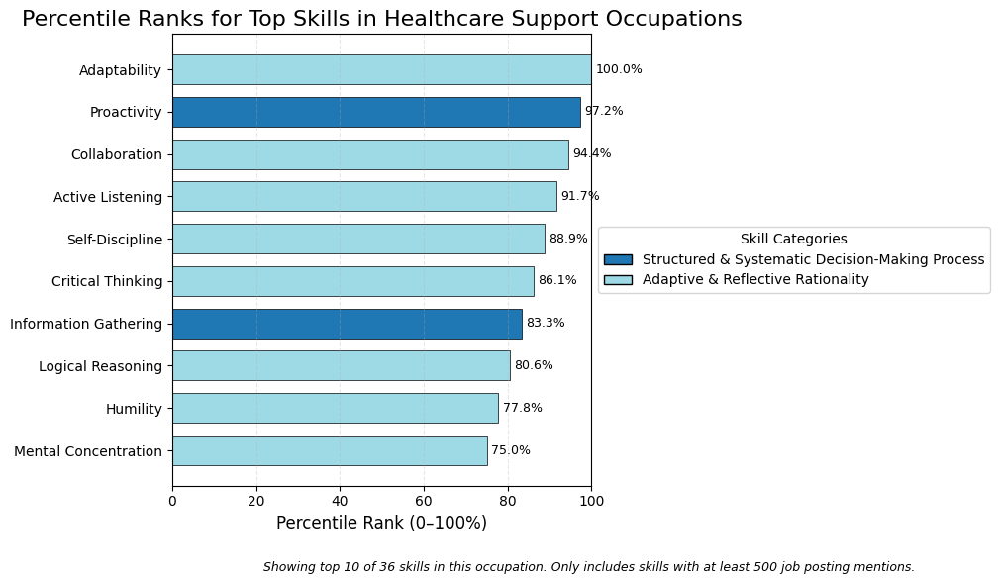

Processing 12/23: Protective Service Occupations


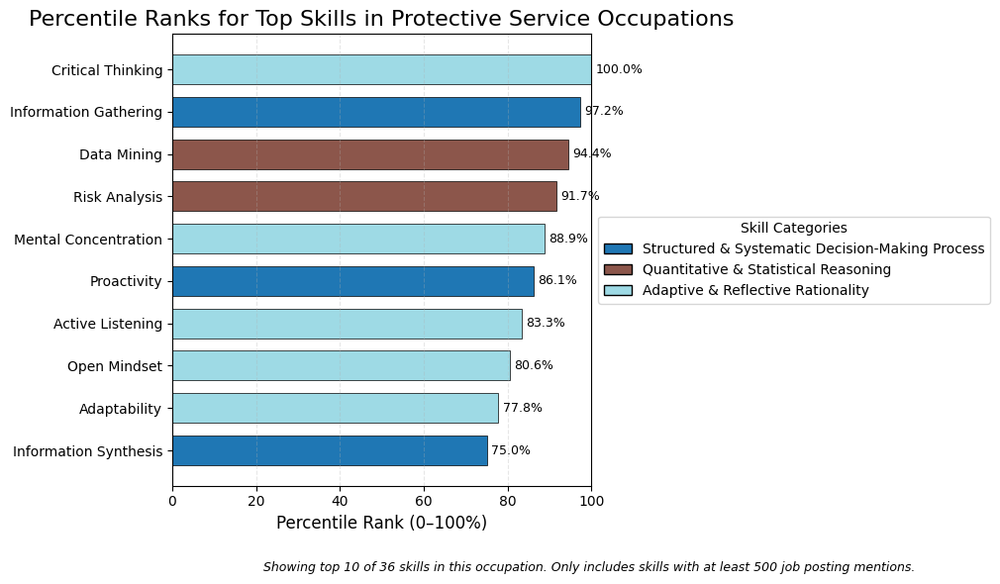

Processing 13/23: Food Preparation and Serving Related Occupations


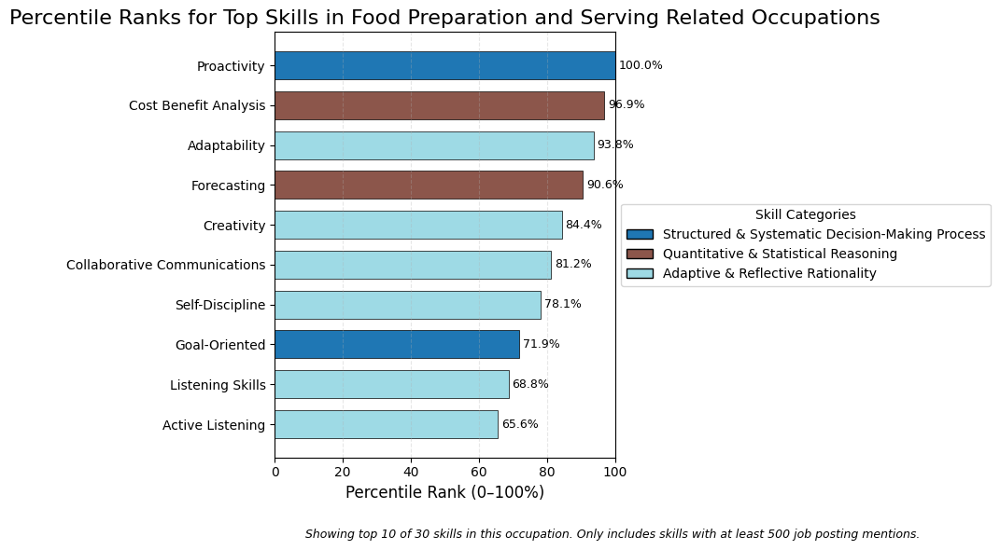

Processing 14/23: Building and Grounds Cleaning and Maintenance Occupations


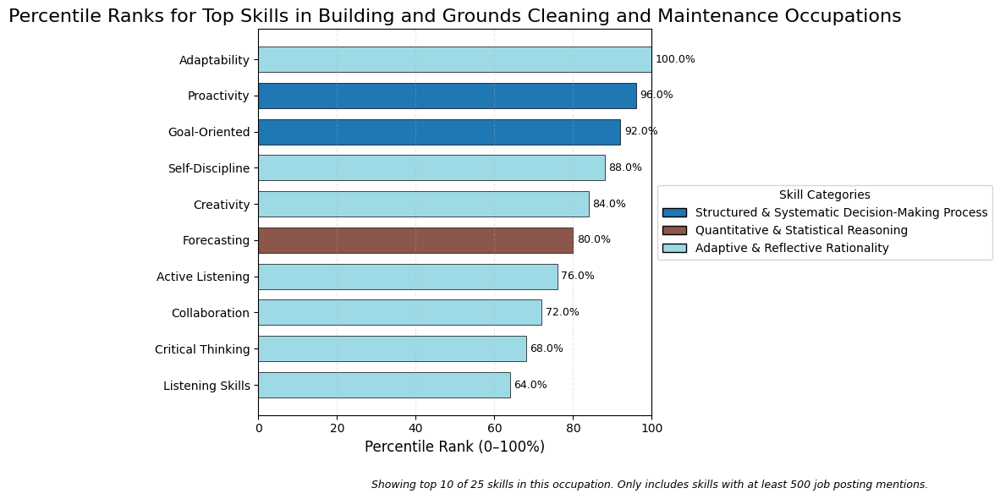

Processing 15/23: Personal Care and Service Occupations


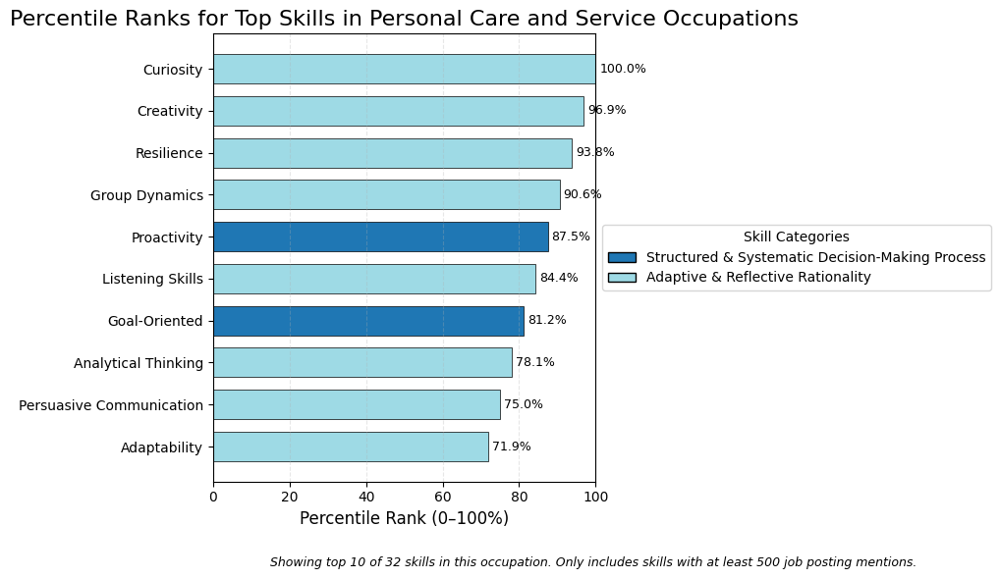

Processing 16/23: Sales and Related Occupations


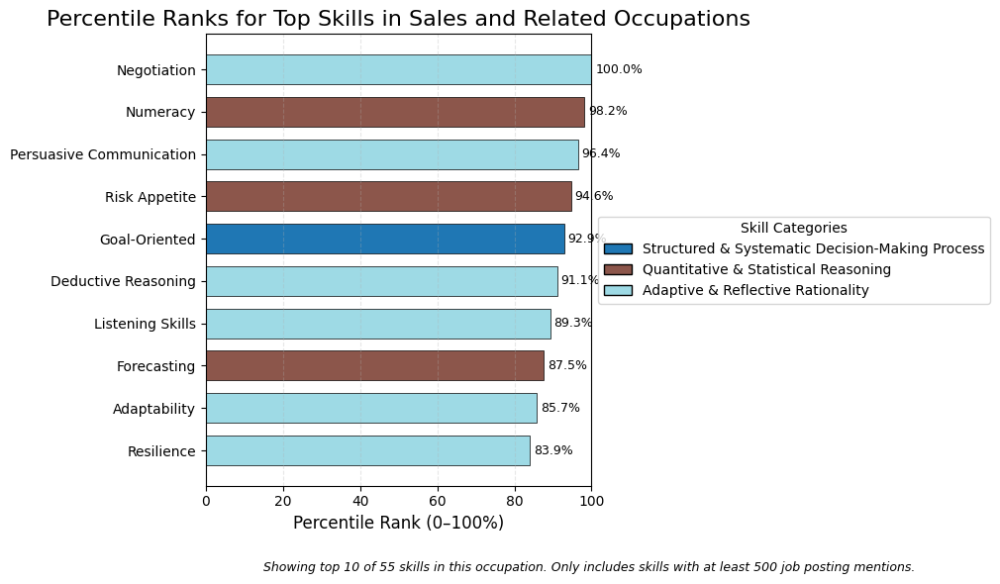

Processing 17/23: Office and Administrative Support Occupations


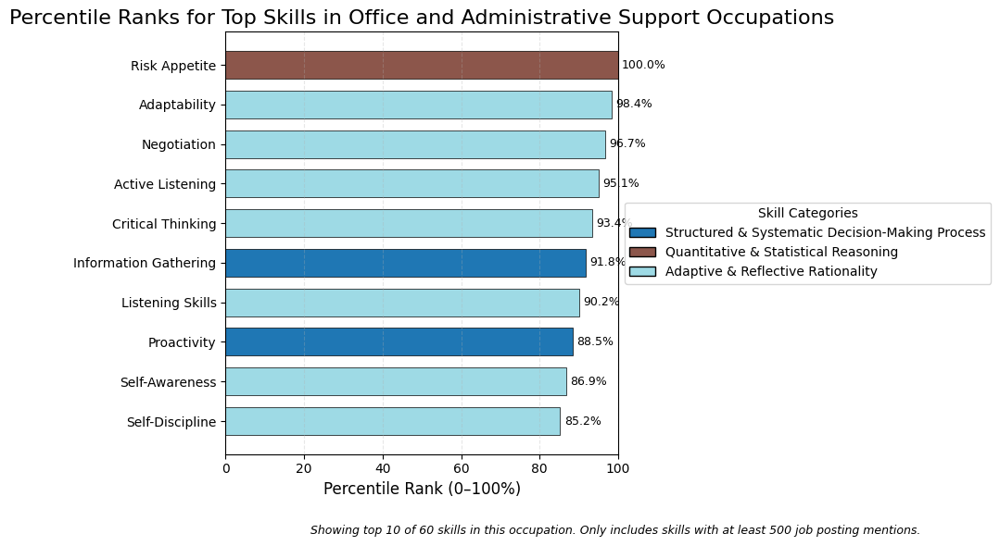

Processing 18/23: Farming, Fishing, and Forestry Occupations


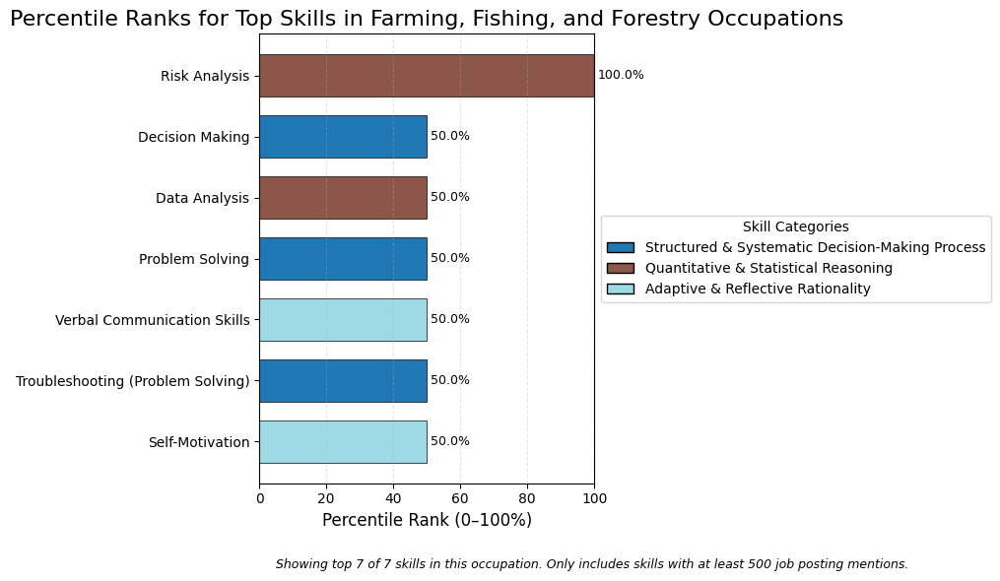

Processing 19/23: Construction and Extraction Occupations


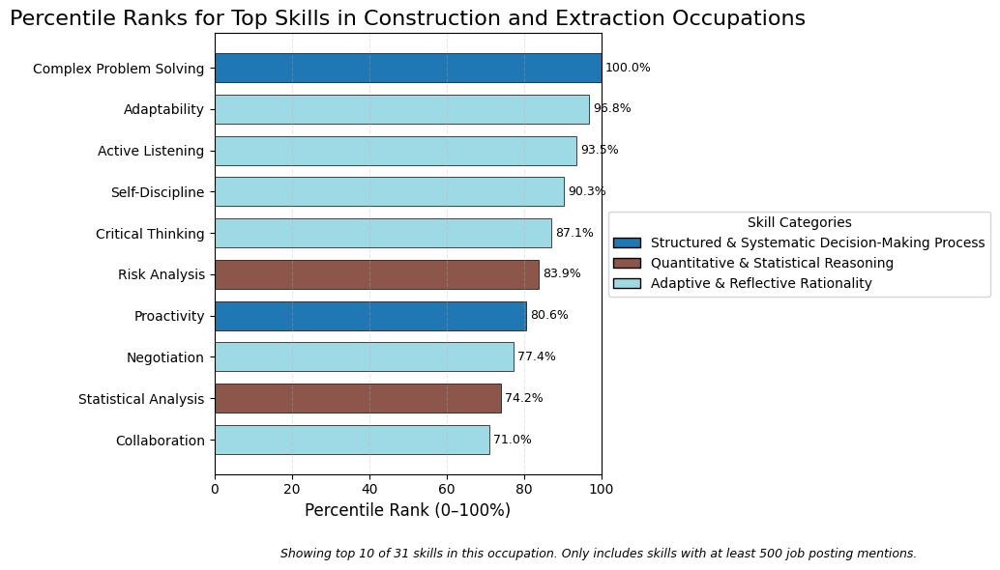

Processing 20/23: Installation, Maintenance, and Repair Occupations


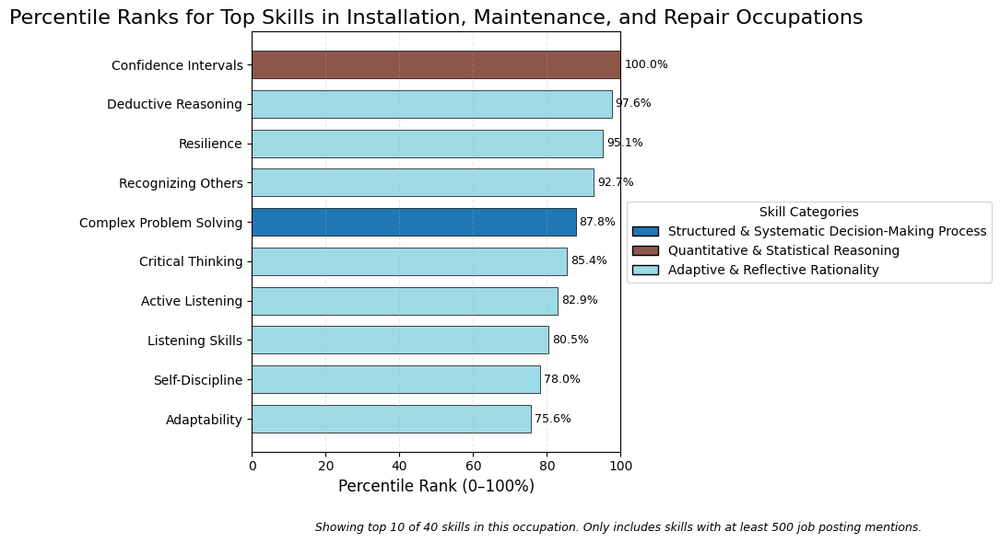

Processing 21/23: Production Occupations


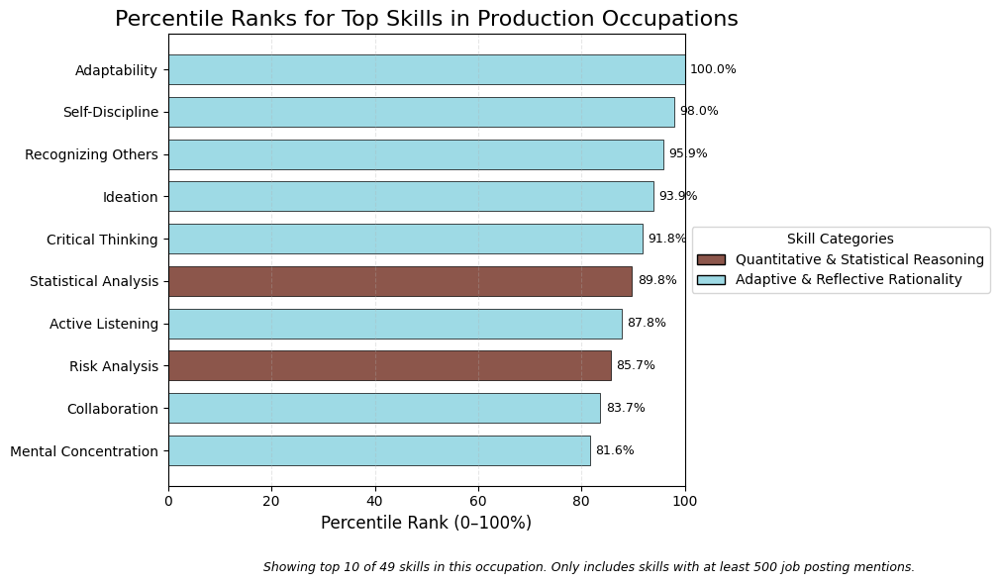

Processing 22/23: Transportation and Material Moving Occupations


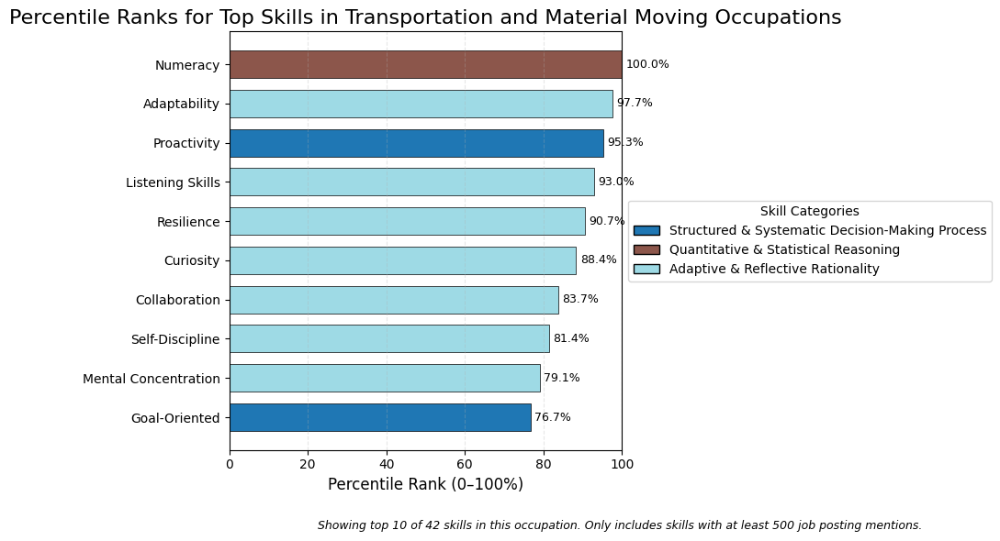

Processing 23/23: Military-only occupations


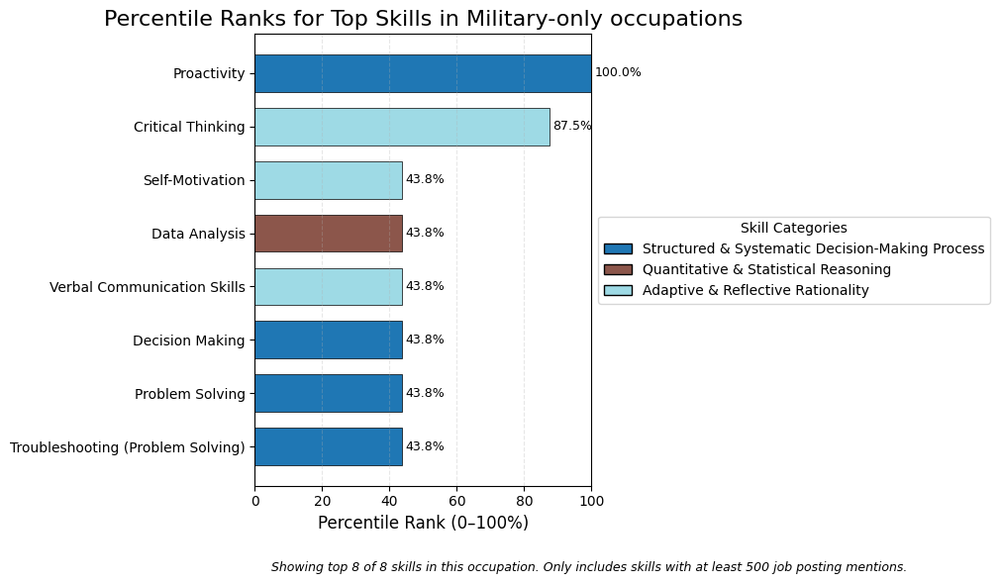

Charts saved to 'soc2_charts'
Total skills evaluated: 88 initially, 68 after filtering
Skills with fewer than 500 job posting mentions were filtered out (20 skills removed)
This ensures that results are based on skills with adequate representation in the labor market.


In [40]:
# Percentile Charts
def plot_percentile_by_soc2(df,
                           soc2_col='SOC_2021_2_NAME',
                           skill_col='SKILL_NAME',
                           category_col='SKILL_CATEGORY',
                           n_skills=10,
                           output_dir='soc2_charts',
                           show_plots=True):
    """
    Create individual percentile‑rank charts for each SOC2 group using SRCA_TF_IDF_PERCENTILE.
    Assumes 'SRCA_TF_IDF_PERCENTILE' exists as a decimal (0–1), converts to 0–100%.
    If missing, calculates it and then converts.
    
    Only includes entries with adequate sample size (SKILL_TOTAL >= 500).
    SKILL_TOTAL represents the total number of job postings mentioning this skill 
    in this occupation. Skills with fewer than 500 mentions are considered to have 
    insufficient data for reliable analysis.
    """
    # 1) Copy
    df_work = df.copy()
    
    # Record initial skill count
    initial_skill_count = df_work[skill_col].nunique()
    
    # Filter out entries with small sample size (SKILL_TOTAL < 500)
    small_sample_filtered = False
    if 'SMALL_SAMPLE_FLAG_SKILL_TOTAL' in df_work.columns:
        print("Filtering out skills with insufficient sample size (SKILL_TOTAL < 500)")
        print("SKILL_TOTAL represents the number of job postings mentioning this skill in this occupation")
        original_shape = df_work.shape
        df_work = df_work[df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] == False]
        small_sample_filtered = True
        print(f"After filtering: {df_work.shape} (removed {original_shape[0] - df_work.shape[0]} rows)")
    elif 'SKILL_TOTAL' in df_work.columns:
        print("Creating small sample flag (SKILL_TOTAL < 500)")
        print("SKILL_TOTAL represents the number of job postings mentioning this skill in this occupation")
        original_shape = df_work.shape
        df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] = df_work['SKILL_TOTAL'] < 500
        df_work = df_work[df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] == False]
        small_sample_filtered = True
        print(f"After filtering: {df_work.shape} (removed {original_shape[0] - df_work.shape[0]} rows)")

    # 2) Ensure percentile column exists, then convert to 0–100%
    pct_col = 'SRCA_TF_IDF_PERCENTILE'
    if pct_col not in df_work.columns:
        print("Calculating percentile ranks within each SOC2 group (0–100)...")
        df_work[pct_col] = (
            df_work
              .groupby('SOC_2021_2')['SRCA_TF_IDF']
              .transform(lambda x: x.rank(pct=True))
        )
    # Now convert decimal to percentage
    df_work[pct_col] = df_work[pct_col] * 100

    # 3) Ensure we have a valid SOC2 column
    if soc2_col not in df_work.columns:
        if 'SOC_2021_2' in df_work.columns:
            soc2_col = 'SOC_2021_2'
            print(f"Using 'SOC_2021_2' instead of '{soc2_col}'")
        else:
            raise ValueError("SOC2 column not found")

    soc_groups = df_work[soc2_col].unique()
    print(f"Found {len(soc_groups)} SOC2 groups")
    
    # Record final skill count after filtering
    final_skill_count = df_work[skill_col].nunique()

    # 4) Prepare category colors
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':                '#9edae5'
    }
    for cat in df_work[category_col].unique():
        if cat not in category_colors:
            idx = len(category_colors) % 20
            category_colors[cat] = plt.cm.tab20(idx)

    # 5) Make output dir
    os.makedirs(output_dir, exist_ok=True)

    # 6) Loop through SOC2s
    for i, soc in enumerate(soc_groups, 1):
        print(f"Processing {i}/{len(soc_groups)}: {soc}")
        plt.figure(figsize=(12, 6))  # Made figure wider to accommodate legend

        soc_data = df_work[df_work[soc2_col] == soc]
        if soc_data.empty:
            plt.text(.5,.5,f"No data for {soc}", ha='center', va='center')
            plt.axis('off')
            fname = soc.replace('/','_').replace(' ','_')
            plt.savefig(f"{output_dir}/percentile_{fname}.png", dpi=300, bbox_inches='tight')
            plt.close()
            continue

        # 7) Top N by percentile
        uniq = soc_data.drop_duplicates(subset=[skill_col])
        total_skills_in_soc = len(uniq)
        
        top = (uniq
               .sort_values(pct_col, ascending=False)
               .head(n_skills)
               .sort_values(pct_col, ascending=True)
              )

        names  = top[skill_col].tolist()
        pcts   = top[pct_col].tolist()
        colors = [category_colors[c] for c in top[category_col]]

        y = np.arange(len(names))
        bars = plt.barh(y, pcts, height=0.7, color=colors,
                        edgecolor='black', linewidth=0.5)
        plt.yticks(y, names)
        for j, bar in enumerate(bars):
            plt.text(bar.get_width()+1, bar.get_y()+bar.get_height()/2,
                     f"{pcts[j]:.1f}%", va='center', fontsize=9)

        plt.title(f'Percentile Ranks for Top Skills in {soc}', fontsize=16)
        plt.xlabel('Percentile Rank (0–100%)', fontsize=12)

        plt.xlim(0, 100)
        plt.grid(axis='x', linestyle='--', alpha=0.3)

        # 8) Legend - moved outside the plot
        legend_elems = [
            Patch(facecolor=clr, edgecolor='black', label=cat)
            for cat, clr in category_colors.items()
            if cat in top[category_col].unique()
        ]
        
        # Place legend outside of the plot to the right
        plt.legend(handles=legend_elems, 
                  loc='center left', 
                  bbox_to_anchor=(1, 0.5), 
                  title="Skill Categories")
        
        # Add note about total skills and filtering
        sample_note = "Only includes skills with at least 500 job posting mentions." if small_sample_filtered else ""
        skill_note = f"Showing top {len(names)} of {total_skills_in_soc} skills in this occupation. {sample_note}"
        plt.figtext(0.5, 0.01, skill_note, ha='center', fontsize=9, style='italic')
        
        # Adjust layout to make room for legend and note
        plt.tight_layout(rect=[0, 0.05, 0.85, 0.98])  # Left, bottom, right, top

        # 9) Save / show
        fname = soc.replace('/','_').replace(' ','_')
        plt.savefig(f"{output_dir}/percentile_{fname}.png",
                    dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        else:
            plt.close()

    # Print summary information
    print(f"Charts saved to '{output_dir}'")
    print(f"Total skills evaluated: {initial_skill_count} initially, {final_skill_count} after filtering")
    if small_sample_filtered:
        print(f"Skills with fewer than 500 job posting mentions were filtered out ({initial_skill_count - final_skill_count} skills removed)")
        print(f"This ensures that results are based on skills with adequate representation in the labor market.")

# Example usage:
plot_percentile_by_soc2(soc2_importance_transformed)

In [41]:
def calculate_importance_metrics(df):
    """
    Calculate multiple importance metrics combining percentile rank and prevalence
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing columns:
        - 'SRCA_TF_IDF_PERCENTILE': Percentile rank of specificity (0–100)
        - 'N': Number of occurrences
        - 'SOC2_POST_COUNT': Total post count
    
    Returns:
    -----------
    pandas.DataFrame
        DataFrame with two new columns:
        - weighted_percentile_importance  (Method 1: percentile * (N / total_posts))
        - weighted_average_importance     (Method 2: (percentile + prevalence%) / 2)
    """
    # Method 1: multiplication approach
    df['weighted_percentile_importance'] = (
        df['SRCA_TF_IDF_PERCENTILE'] * 
        (df['N'] / df['SOC2_POST_COUNT'])
    )
    
    # Method 2: simple average of specificity percentile and prevalence percentile
    df['weighted_average_importance'] = (
        df['SRCA_TF_IDF_PERCENTILE'] +
        (df['N'] / df['SOC2_POST_COUNT'] * 100)
    ) / 2
    
    return df

# Example usage
soc2_importance_transformed = calculate_importance_metrics(soc2_importance_transformed)

In [42]:
soc2_importance_transformed

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,...,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL,SRCA_TF_IDF_ZSCORE,SRCA_TF_IDF_PERCENTILE,TF_IDF_ZSCORE,TF_IDF_PERCENTILE,RCA_TF_IDF_ZSCORE,RCA_TF_IDF_PERCENTILE,weighted_percentile_importance,weighted_average_importance
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.008428,9.293709
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,...,0.008533,False,0.861508,0.974026,0.854245,0.987013,0.789920,0.961039,0.075025,4.338286
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004264,4.712789
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,...,0.006039,False,0.609711,0.935065,0.660618,0.961039,0.478237,0.922078,0.055699,3.445860
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004281,4.731896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,...,0.002550,False,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.029429,1.971471
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.017605,2.230762
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,...,0.002059,False,0.807605,0.875000,0.959184,0.875000,0.651038,0.875000,0.024700,1.848911
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.011824,1.570101


Processing 1/23: Management Occupations


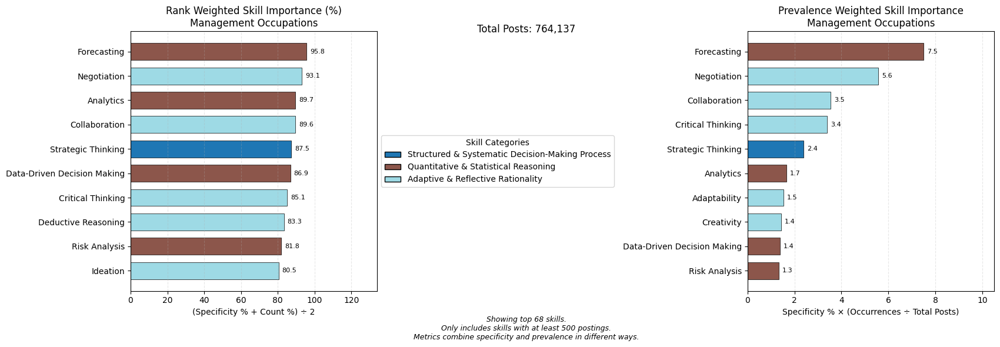

Processing 2/23: Business and Financial Operations Occupations


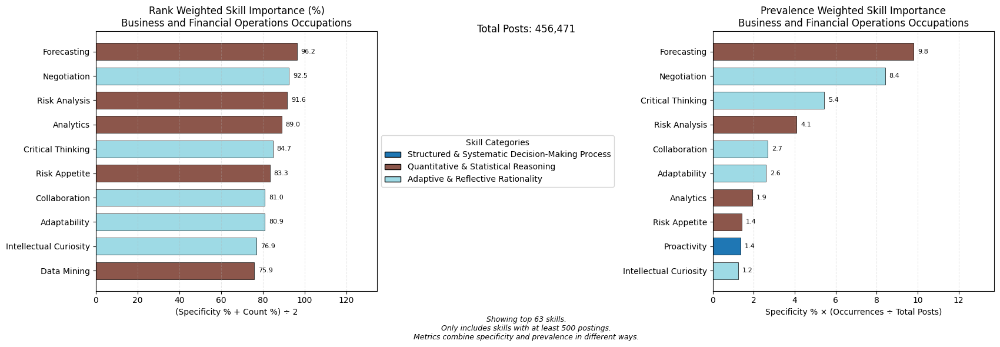

Processing 3/23: Computer and Mathematical Occupations


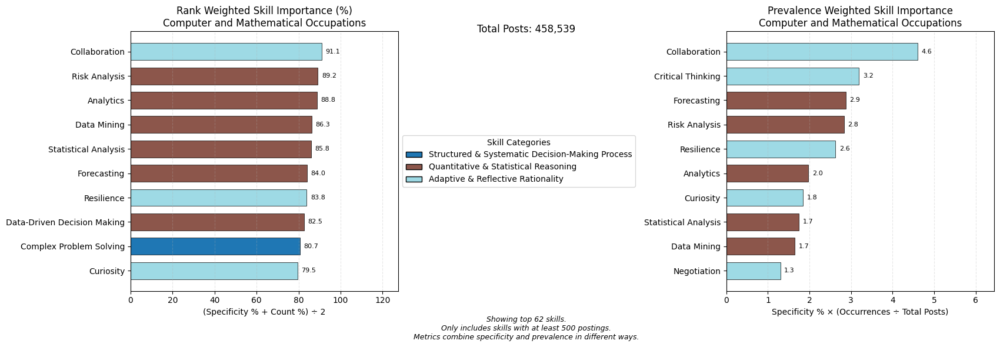

Processing 4/23: Architecture and Engineering Occupations


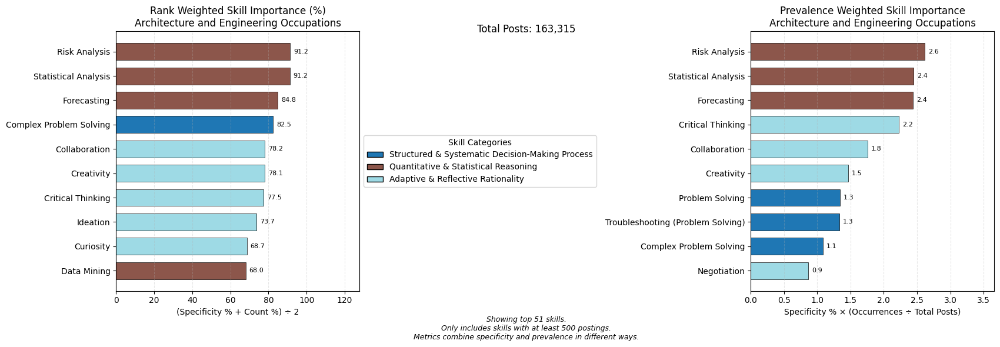

Processing 5/23: Life, Physical, and Social Science Occupations


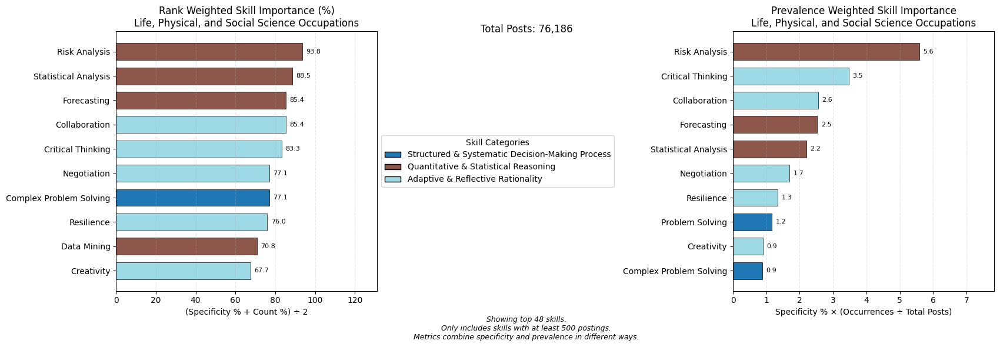

Processing 6/23: Community and Social Service Occupations


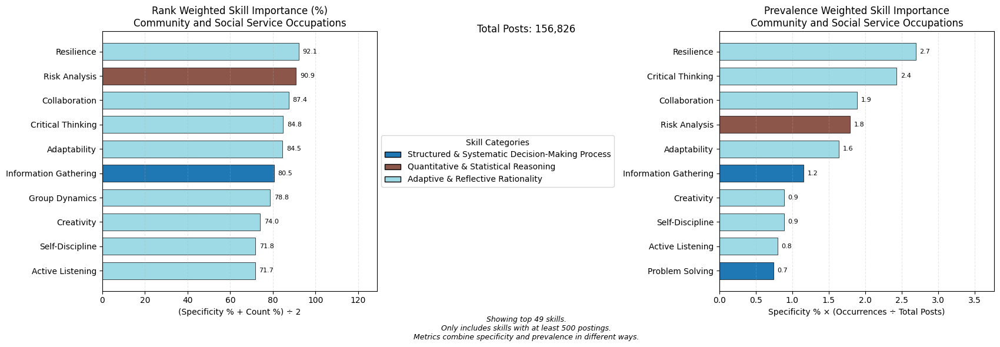

Processing 7/23: Legal Occupations


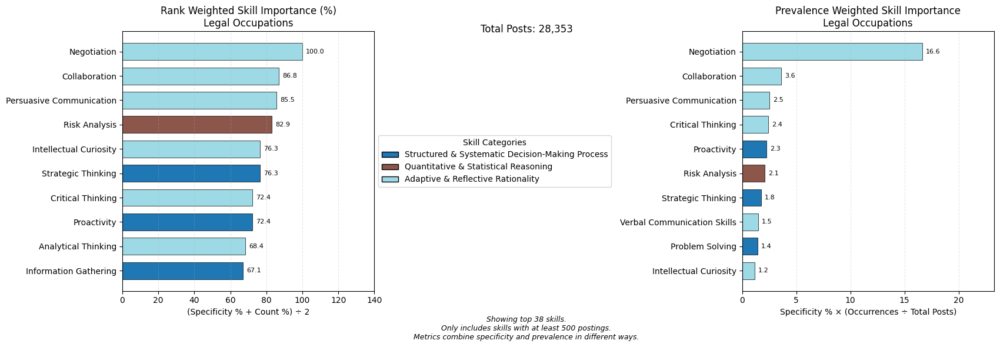

Processing 8/23: Educational Instruction and Library Occupations


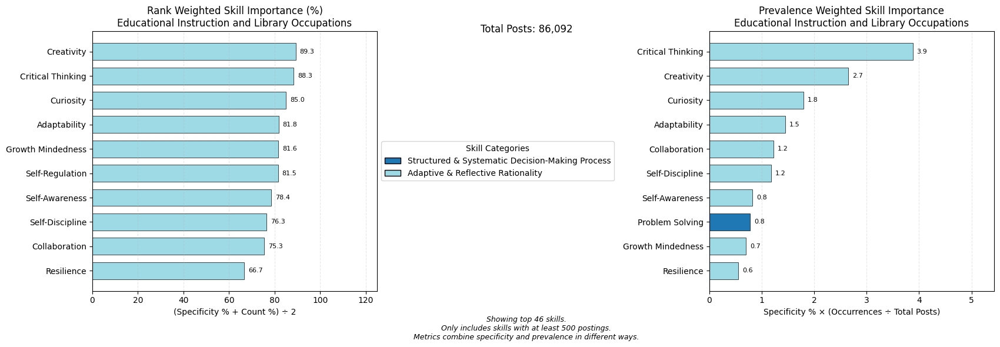

Processing 9/23: Arts, Design, Entertainment, Sports, and Media Occupations


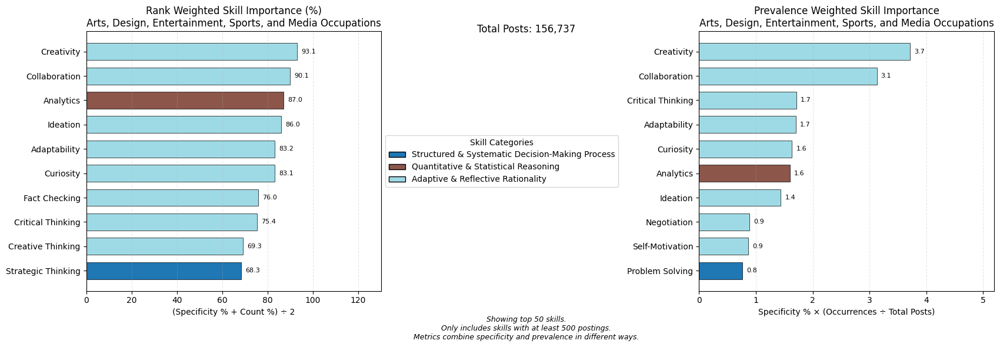

Processing 10/23: Healthcare Practitioners and Technical Occupations


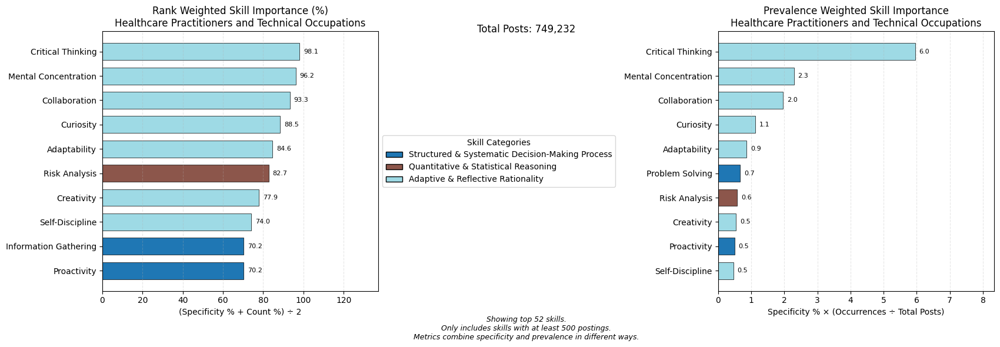

Processing 11/23: Healthcare Support Occupations


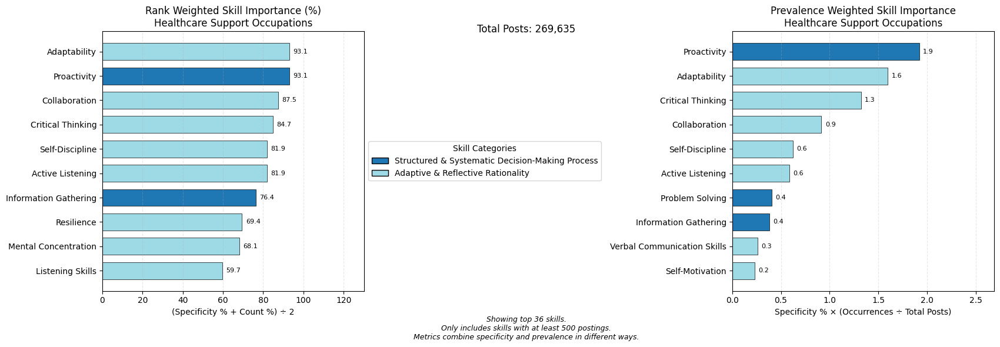

Processing 12/23: Protective Service Occupations


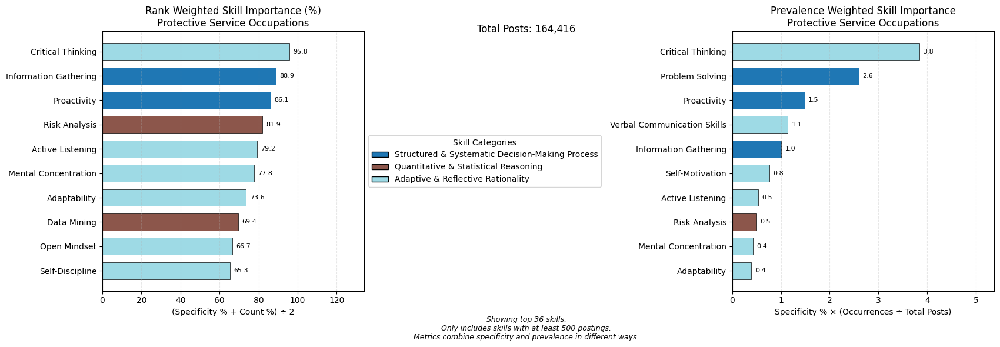

Processing 13/23: Food Preparation and Serving Related Occupations


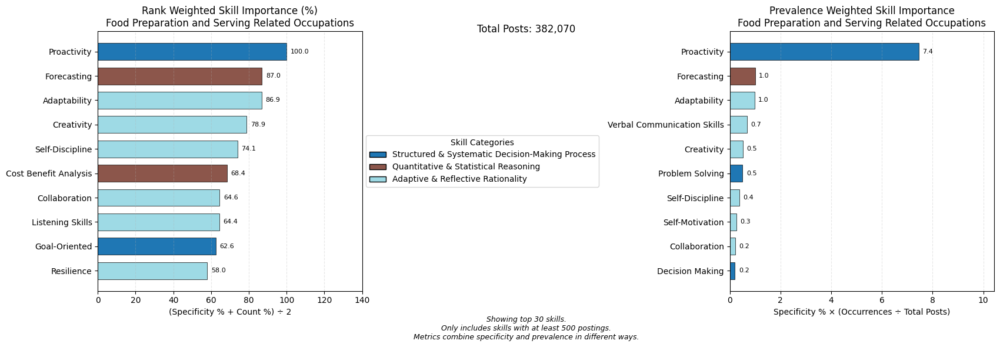

Processing 14/23: Building and Grounds Cleaning and Maintenance Occupations


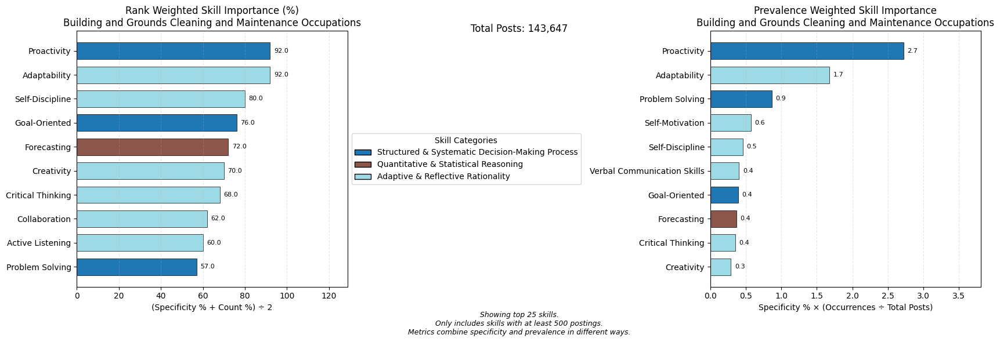

Processing 15/23: Personal Care and Service Occupations


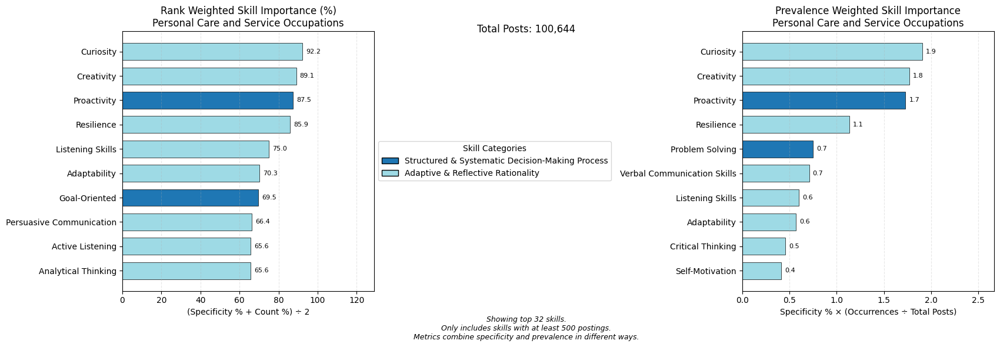

Processing 16/23: Sales and Related Occupations


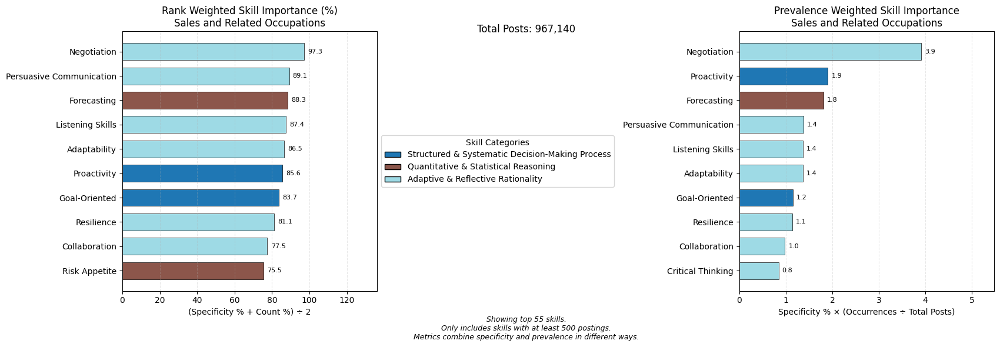

Processing 17/23: Office and Administrative Support Occupations


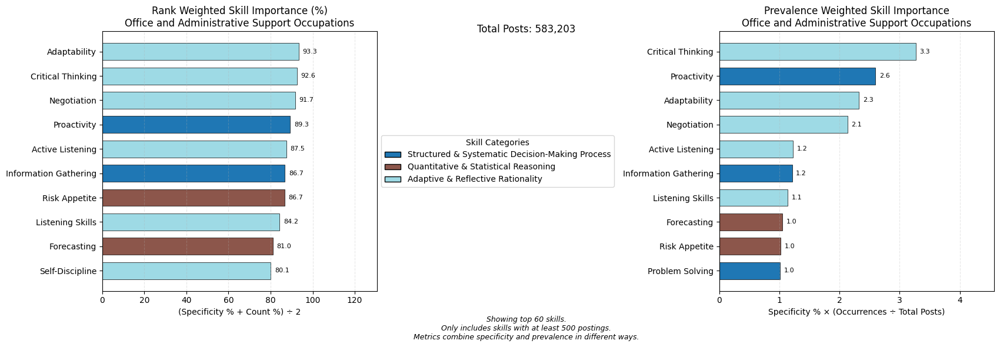

Processing 18/23: Farming, Fishing, and Forestry Occupations


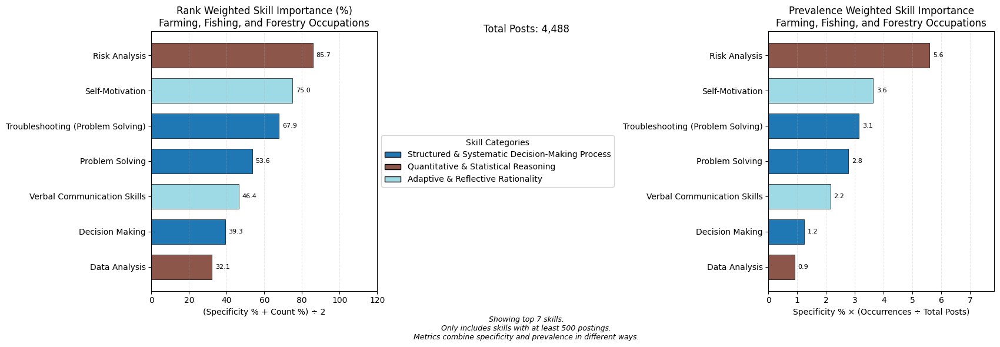

Processing 19/23: Construction and Extraction Occupations


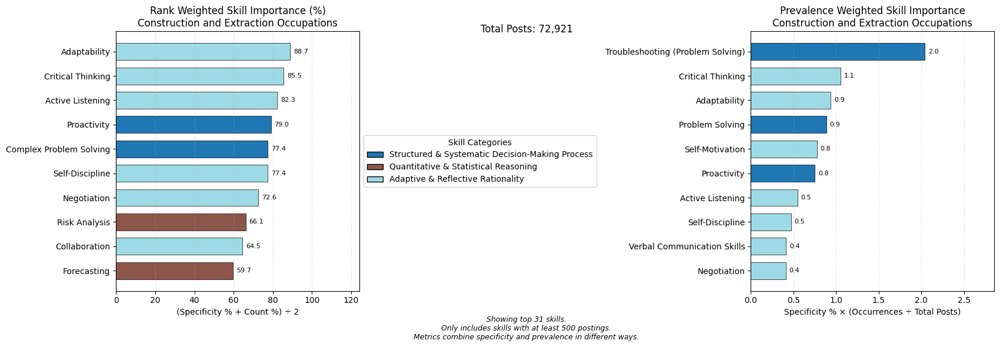

Processing 20/23: Installation, Maintenance, and Repair Occupations


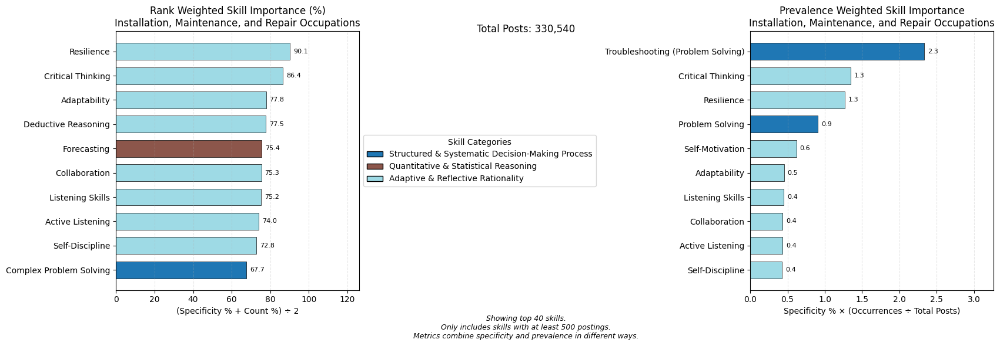

Processing 21/23: Production Occupations


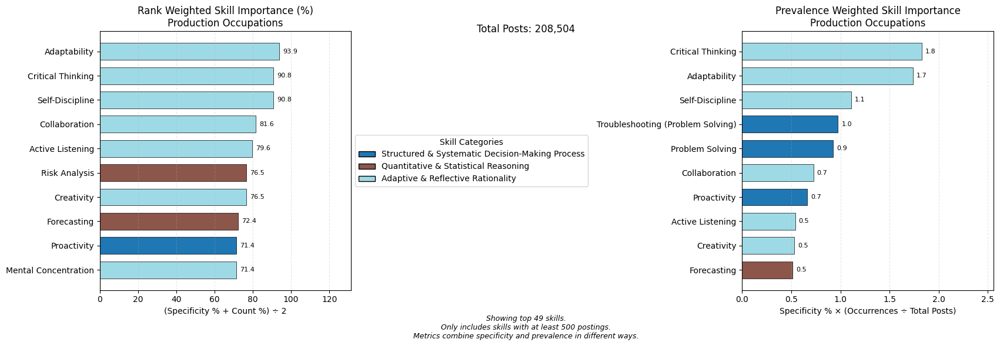

Processing 22/23: Transportation and Material Moving Occupations


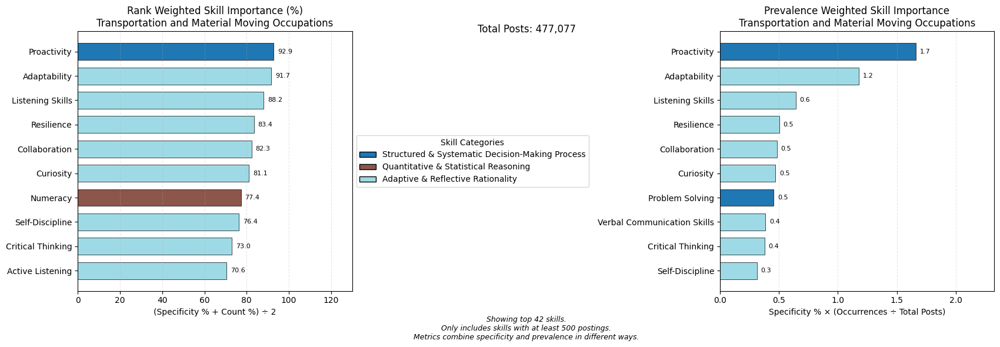

Processing 23/23: Military-only occupations


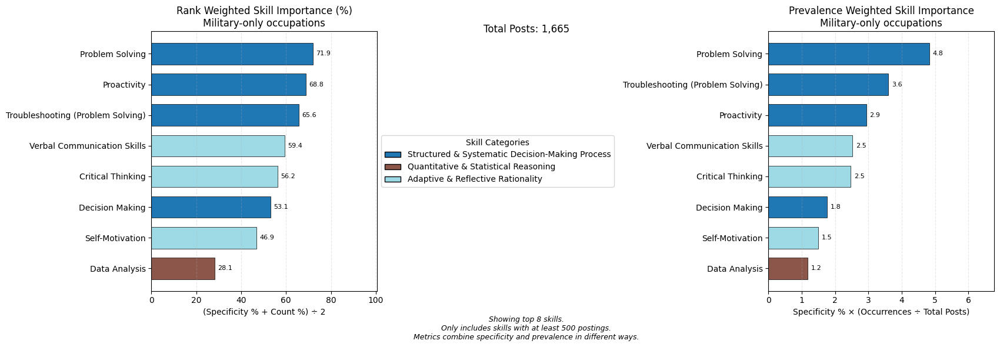

Charts saved in 'weighted_importance_charts'.
Skills evaluated: 88 initially, 68 after filtering.
Filtered out 20 low-sample skills.


In [43]:
def plot_weighted_importance_comparison(df,
                                        soc2_col='SOC_2021_2_NAME',
                                        skill_col='SKILL_NAME',
                                        category_col='SKILL_CATEGORY',
                                        n_skills=10,
                                        output_dir='weighted_importance_charts',
                                        show_plots=True):
    """
    Create comparison charts for each SOC2 group showing top skills by two weighted importance metrics:
      - Rank Weighted Skill Importance (%)  = (Specificity % + Count %) / 2
      - Prevalence Weighted Skill Importance = Specificity % × (Occurrences ÷ Total Posts)
    """
    # 1) Prepare working copy
    df_work = df.copy()
    initial_skill_count = df_work[skill_col].nunique()

    # 2) Filter out small‐sample skills if needed
    small_sample_filtered = False
    if 'SMALL_SAMPLE_FLAG_SKILL_TOTAL' in df_work.columns:
        df_work = df_work[df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] == False]
        small_sample_filtered = True
    elif 'SKILL_TOTAL' in df_work.columns:
        df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] = df_work['SKILL_TOTAL'] < 500
        df_work = df_work[df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL'] == False]
        small_sample_filtered = True

    # 3) Ensure percentile columns exist (0–100)
    pct_spec = 'SRCA_TF_IDF_PERCENTILE'
    pct_cnt  = 'N_PERCENTILE'
    if pct_cnt not in df_work.columns:
        df_work[pct_cnt] = df_work.groupby('SOC_2021_2')['N'].transform(lambda x: x.rank(pct=True))
    if pct_spec not in df_work.columns:
        df_work[pct_spec] = df_work.groupby('SOC_2021_2')['SRCA_TF_IDF'].transform(lambda x: x.rank(pct=True))
    if df_work[pct_spec].max() <= 1: df_work[pct_spec] *= 100
    if df_work[pct_cnt].max() <= 1:  df_work[pct_cnt]  *= 100

    # 4) Compute weighted importance metrics
    df_work['weighted_rank_importance'] = (df_work[pct_spec] + df_work[pct_cnt]) / 2
    df_work['weighted_skill_share_importance'] = df_work[pct_spec] * (df_work['N'] / df_work['SOC2_POST_COUNT'])

    # 5) Confirm SOC2 column
    if soc2_col not in df_work.columns:
        if 'SOC_2021_2' in df_work.columns:
            soc2_col = 'SOC_2021_2'
        else:
            raise ValueError(f"SOC2 column '{soc2_col}' not found")

    soc_groups = df_work[soc2_col].unique()
    final_skill_count = df_work[skill_col].nunique()

    # 6) Category color mapping
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':               '#9edae5'
    }
    for cat in df_work[category_col].unique():
        if cat not in category_colors:
            idx = len(category_colors) % 20
            category_colors[cat] = plt.cm.tab20(idx)

    # 7) Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # 8) Loop through SOC2 groups
    for i, soc in enumerate(soc_groups, 1):
        print(f"Processing {i}/{len(soc_groups)}: {soc}")
        plt.figure(figsize=(18, 6))

        soc_data = df_work[df_work[soc2_col] == soc]
        if soc_data.empty:
            plt.text(.5, .5, f"No data for {soc}", ha='center', va='center')
            plt.axis('off')
            fname = soc.replace('/', '_').replace(' ', '_')
            plt.savefig(f"{output_dir}/weighted_importance_comparison_{fname}.png",
                        dpi=300, bbox_inches='tight')
            plt.close()
            continue

        # Left chart: Rank Weighted Skill Importance (%)
        plt.subplot(1, 2, 1)
        uniq_rank = soc_data.drop_duplicates(subset=[skill_col])
        top_rank = uniq_rank.nlargest(n_skills, 'weighted_rank_importance').sort_values('weighted_rank_importance')
        y1 = np.arange(len(top_rank))
        bars1 = plt.barh(y1,
                         top_rank['weighted_rank_importance'],
                         height=0.7,
                         color=[category_colors[c] for c in top_rank[category_col]],
                         edgecolor='black', linewidth=0.5)
        plt.yticks(y1, top_rank[skill_col])
        plt.title(f'Rank Weighted Skill Importance (%)\n{soc}', fontsize=12)
        plt.xlabel('(Specificity % + Count %) ÷ 2', fontsize=10)
        plt.xlim(0, top_rank['weighted_rank_importance'].max() * 1.4)
        plt.grid(axis='x', linestyle='--', alpha=0.3)
        for bar in bars1:
            plt.text(bar.get_width() + top_rank['weighted_rank_importance'].max() * 0.02,
                     bar.get_y() + bar.get_height()/2,
                     f"{bar.get_width():.1f}", va='center', fontsize=8)

        # Right chart: Prevalence Weighted Skill Importance
        plt.subplot(1, 2, 2)
        top_share = uniq_rank.nlargest(n_skills, 'weighted_skill_share_importance')\
                             .sort_values('weighted_skill_share_importance')
        y2 = np.arange(len(top_share))
        bars2 = plt.barh(y2,
                         top_share['weighted_skill_share_importance'],
                         height=0.7,
                         color=[category_colors[c] for c in top_share[category_col]],
                         edgecolor='black', linewidth=0.5)
        plt.yticks(y2, top_share[skill_col])
        plt.title(f'Prevalence Weighted Skill Importance\n{soc}', fontsize=12)
        plt.xlabel('Specificity % × (Occurrences ÷ Total Posts)', fontsize=10)
        plt.xlim(0, top_share['weighted_skill_share_importance'].max() * 1.4)
        plt.grid(axis='x', linestyle='--', alpha=0.3)
        for bar in bars2:
            plt.text(bar.get_width() + top_share['weighted_skill_share_importance'].max() * 0.02,
                     bar.get_y() + bar.get_height()/2,
                     f"{bar.get_width():.1f}", va='center', fontsize=8)

        # Legend & footnote
        plt.subplot(1, 2, 1)
        legend_elems = [
            Patch(facecolor=clr, edgecolor='black', label=cat)
            for cat, clr in category_colors.items()
            if cat in pd.concat([top_rank[category_col], top_share[category_col]]).unique()
        ]
        plt.legend(handles=legend_elems,
                   loc='center left',
                   bbox_to_anchor=(1, 0.5),
                   title="Skill Categories")

        # Display total posts for this SOC2 group
        total_posts = soc_data['SOC2_POST_COUNT'].iloc[0]
        plt.figtext(
            0.5, 0.88,
            f"Total Posts: {total_posts:,}",
            ha='center', fontsize=12
        )

        # Add footnote without the skill share information
        sample_note = "Only includes skills with at least 500 postings." if small_sample_filtered else ""
        metric_note = "Metrics combine specificity and prevalence in different ways."
        footnote = (
            f"Showing top {len(uniq_rank)} skills.\n"
            f"{sample_note}\n{metric_note}"
        )
        plt.figtext(0.5, 0.01, footnote, ha='center', fontsize=9, style='italic')

        # Save or show
        fname = soc.replace('/', '_').replace(' ', '_')
        plt.tight_layout(rect=[0, 0.05, 0.95, 0.98])
        plt.savefig(f"{output_dir}/weighted_importance_comparison_{fname}.png",
                    dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        else:
            plt.close()

    print(f"Charts saved in '{output_dir}'.")
    print(f"Skills evaluated: {initial_skill_count} initially, {final_skill_count} after filtering.")
    if small_sample_filtered:
        removed = initial_skill_count - final_skill_count
        print(f"Filtered out {removed} low-sample skills.")

# Example usage:
plot_weighted_importance_comparison(soc2_importance_transformed)

In [44]:
soc2_importance_transformed

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,...,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL,SRCA_TF_IDF_ZSCORE,SRCA_TF_IDF_PERCENTILE,TF_IDF_ZSCORE,TF_IDF_PERCENTILE,RCA_TF_IDF_ZSCORE,RCA_TF_IDF_PERCENTILE,weighted_percentile_importance,weighted_average_importance
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.008428,9.293709
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,...,0.008533,False,0.861508,0.974026,0.854245,0.987013,0.789920,0.961039,0.075025,4.338286
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004264,4.712789
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,...,0.006039,False,0.609711,0.935065,0.660618,0.961039,0.478237,0.922078,0.055699,3.445860
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004281,4.731896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,...,0.002550,False,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.029429,1.971471
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.017605,2.230762
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,...,0.002059,False,0.807605,0.875000,0.959184,0.875000,0.651038,0.875000,0.024700,1.848911
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.011824,1.570101


In [45]:
def calculate_skill_share_from_micro_data(conn, skills_list):
    """
    Calculate the correct skill share by going back to posting-level data.
    
    This calculates: What % of posts in each SOC2 mention at least one skill from our list?
    
    Parameters:
    -----------
    conn : snowflake connection
        Snowflake connection object
    skills_list : list
        List of skills you're analyzing
        
    Returns:
    --------
    pandas.DataFrame
        DataFrame with SOC2 groups and their true skill coverage percentages
    """
    
    # Create the skills filter for SQL
    skills_filter = ', '.join([f"'{skill}'" for skill in skills_list])
    
    query = f"""
    WITH base_postings AS (
        SELECT 
            ID,
            SOC_2021_2,
            SOC_2021_2_NAME,
            YEAR(POSTED) AS YEAR
        FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS
        WHERE YEAR(POSTED) BETWEEN 2022 AND 2024
            AND SOC_2021_2 IS NOT NULL
            AND SOC_2021_2 != '99-0000'
            AND ARRAY_SIZE(SKILLS) > 0
            AND (SALARY_TO > 0 OR SALARY > 0 OR SALARY_FROM > 0)
            AND ARRAY_CONTAINS('Company'::VARIANT, SOURCE_TYPES)
            AND IS_INTERNSHIP = FALSE
            AND COMPANY_IS_STAFFING = FALSE
    ),
    total_posts_by_soc2 AS (
        SELECT 
            SOC_2021_2,
            SOC_2021_2_NAME,
            COUNT(DISTINCT ID) AS total_posts
        FROM base_postings
        GROUP BY SOC_2021_2, SOC_2021_2_NAME
    ),
    posts_with_target_skills AS (
        SELECT 
            bp.SOC_2021_2,
            bp.SOC_2021_2_NAME,
            COUNT(DISTINCT bp.ID) AS posts_with_skills
        FROM base_postings bp
        JOIN BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS_SKILLS ps ON bp.ID = ps.ID
        WHERE ps.SKILL_NAME IN ({skills_filter})
        GROUP BY bp.SOC_2021_2, bp.SOC_2021_2_NAME
    )
    SELECT 
        t.SOC_2021_2,
        t.SOC_2021_2_NAME,
        t.total_posts,
        COALESCE(p.posts_with_skills, 0) AS posts_with_skills,
        (COALESCE(p.posts_with_skills, 0) * 100.0 / t.total_posts) AS skill_coverage_pct
    FROM total_posts_by_soc2 t
    LEFT JOIN posts_with_target_skills p ON t.SOC_2021_2 = p.SOC_2021_2
    ORDER BY t.SOC_2021_2
    """
    
    skill_coverage_df = pd.read_sql(query, conn)
    return skill_coverage_df


def calculate_skill_share(df, soc2_col='SOC_2021_2_NAME', conn=None, use_micro_data=True):
    """
    Calculate the share of posts with skills for each SOC2 group

    Parameters:
    -----------
    df : pandas.DataFrame
        Input dataframe with skill information
    soc2_col : str, optional
        Column name for SOC2 groups
    conn : snowflake connection, optional
        If provided and use_micro_data=True, will calculate from posting-level data
    use_micro_data : bool, optional
        If True and conn provided, uses micro data for accurate calculation

    Returns:
    --------
    pandas.Series
        Series with SOC2 groups as index and skill share as values
    """
    if use_micro_data and conn is not None:
        # Get skills list from the dataframe
        skills_list = df['SKILL_NAME'].unique().tolist()
        
        # Calculate from micro data
        skill_coverage_df = calculate_skill_share_from_micro_data(conn, skills_list)
        
        # Convert to Series with SOC2_NAME as index (to match original function)
        skill_share = skill_coverage_df.set_index('SOC_2021_2_NAME')['skill_coverage_pct']
        return skill_share
    else:
        # Original (incorrect) calculation - kept for backwards compatibility
        skill_share = (
            df.groupby(soc2_col)
              .apply(lambda group: group['N'].gt(0).sum() / group['SOC2_POST_COUNT'].iloc[0])
            * 100
        )
        return skill_share


def generate_top_skills_lists(df,
                              soc2_col='SOC_2021_2_NAME',
                              skill_col='SKILL_NAME',
                              category_col='SKILL_CATEGORY',
                              n_skills=10,
                              conn=None,
                              use_micro_data=True):
    """
    Generate lists of top skills for each SOC2 group based on two importance metrics.

    Returns a DataFrame with one row per (SOC2, Metric, Rank, Skill).
    
    Parameters:
    -----------
    conn : snowflake connection, optional
        If provided, will calculate correct skill coverage from micro data
    use_micro_data : bool, optional
        If True and conn provided, uses posting-level data for skill coverage
    """
    # Calculate skill share (correctly if conn provided)
    skill_share = calculate_skill_share(df, soc2_col, conn, use_micro_data)

    df_work = df.copy()
    if 'SMALL_SAMPLE_FLAG_SKILL_TOTAL' in df_work.columns:
        df_work = df_work[~df_work['SMALL_SAMPLE_FLAG_SKILL_TOTAL']]
    elif 'SKILL_TOTAL' in df_work.columns:
        df_work = df_work[df_work['SKILL_TOTAL'] >= 500]

    pct_specificity_col = 'SRCA_TF_IDF_PERCENTILE'
    pct_count_col       = 'N_PERCENTILE'
    if pct_count_col not in df_work.columns:
        df_work[pct_count_col] = df_work.groupby('SOC_2021_2')['N'].transform(lambda x: x.rank(pct=True))
    if pct_specificity_col not in df_work.columns:
        df_work[pct_specificity_col] = df_work.groupby('SOC_2021_2')['SRCA_TF_IDF'].transform(lambda x: x.rank(pct=True))
    if df_work[pct_specificity_col].max() <= 1: df_work[pct_specificity_col] *= 100
    if df_work[pct_count_col].max() <= 1: df_work[pct_count_col] *= 100

    df_work['weighted_rank_importance'] = (df_work[pct_specificity_col] + df_work[pct_count_col]) / 2
    df_work['weighted_skill_share_importance'] = df_work[pct_specificity_col] * (df_work['N'] / df_work['SOC2_POST_COUNT'])

    rows = []
    for soc2, group in df_work.groupby(soc2_col):
        share_pct   = skill_share.get(soc2, 0)
        total_posts = group['SOC2_POST_COUNT'].iloc[0]
        uniq        = group.drop_duplicates(subset=[skill_col])

        top_rank = uniq.nlargest(n_skills, 'weighted_rank_importance')
        top_share= uniq.nlargest(n_skills, 'weighted_skill_share_importance')

        for metric, top in [
            ('Rank Importance', top_rank),
            ('Skill Share Importance', top_share)
        ]:
            for rank, (_, skill_row) in enumerate(top.iterrows(), 1):
                rows.append({
                    'SOC2_Group': soc2,
                    'Percent_of_Posts_with_Skills': share_pct,
                    'Total_Posts': int(total_posts),
                    'Metric': metric,
                    'Rank': rank,
                    'Skill': skill_row[skill_col],
                    'Skill_Category': skill_row[category_col],
                    'Importance_Score': float(
                        skill_row['weighted_rank_importance']
                        if metric == 'Rank Importance'
                        else skill_row['weighted_skill_share_importance']
                    ),
                    'Specificity_Percentile': float(skill_row[pct_specificity_col]),
                    'Count_Percentile':      float(skill_row[pct_count_col]),
                    'Occurrences':           int(skill_row['N']),
                })
    return pd.DataFrame(rows)


def create_soc2_skill_table(top_skills_df, soc2_group,
                            n_skills=10, save_path=None, display=True):
    """
    Create a matplotlib table for a SOC2 group's top skills.
    Shows occupation‑specific skill share, total posts, and the original metric notes.
    """
    # Filter for Rank Importance
    rank_df = top_skills_df[
        (top_skills_df['SOC2_Group'] == soc2_group) &
        (top_skills_df['Metric'] == 'Rank Importance')
    ].head(n_skills).copy()
    if rank_df.empty:
        print(f"No data for {soc2_group}")
        return None

    # Extract share and total posts
    soc2_skill_share = rank_df['Percent_of_Posts_with_Skills'].iloc[0]
    total_posts      = rank_df['Total_Posts'].iloc[0]

    fig, ax = plt.subplots(figsize=(12, n_skills * 0.4 + 3))
    ax.axis('off')

    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':               '#9edae5'
    }

    table_data = []
    cell_colors = []
    for _, row in rank_df.iterrows():
        table_data.append([
            row['Rank'],
            row['Skill'],
            row['Skill_Category'],
            f"{row['Specificity_Percentile']:.2f}",
            f"{row['Count_Percentile']:.2f}",
            f"{row['Importance_Score']:.2f}",
            f"{int(row['Occurrences']):,}"
        ])
        color = category_colors.get(row['Skill_Category'], 'white')
        cell_colors.append(['white', color, color, color, color, color, color])

    table = plt.table(
        cellText=table_data,
        colLabels=['#', 'Skill', 'Category', 'Specificity %', 'Count %',
                   'Rank Importance', 'N Postings'],
        loc='center',
        cellLoc='left',
        colWidths=[0.05, 0.25, 0.30, 0.12, 0.12, 0.14, 0.12],
        cellColours=cell_colors
    )
    for j in range(7):
        table[(0, j)].set_facecolor('#4472C4')
        table[(0, j)].set_text_props(color='white', fontweight='bold')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)

    plt.title(f"Top {n_skills} Skills for {soc2_group}", fontsize=16, y=0.90)

    # Occupation share + total posts (now with correct percentages!)
    plt.figtext(
        0.5, 0.88,
        f"Percent of Posts with Skills: {soc2_skill_share:.2f}%   |   Total Posts: {total_posts:,}",
        ha='center', fontsize=12
    )

    # Re‑add original metric notes
    note = (
        "Rank Importance is the average of Specificity % and Count %\n"
        "Specificity %: How unique this skill is to this occupation (100% = most unique)\n"
        "Count %: How prevalent this skill is within this occupation (100% = most prevalent)"
    )
    plt.figtext(0.5, 0.91, note, ha='center', fontsize=9, style='italic')

    legend_elems = [
        plt.Rectangle((0,0),1,1,facecolor=clr,edgecolor='gray',label=cat)
        for cat, clr in category_colors.items()
    ]
    plt.legend(
        handles=legend_elems,
        loc='upper center',
        bbox_to_anchor=(0.5,0.9),
        ncol=3, fontsize=10,
        frameon=True, framealpha=0.7
    )

    plt.tight_layout(rect=[0,0,1,0.9])
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    if display:
        plt.show()
    else:
        plt.close()


def create_all_soc2_skill_tables(top_skills_df, n_skills=10, output_dir='soc2_skill_tables', display=True):
    """
    Create matplotlib table visualizations for all SOC2 groups
    """
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)

    figures = {}
    for soc2 in top_skills_df['SOC2_Group'].unique():
        save_path = os.path.join(
            output_dir, f"{soc2.replace('/', '_').replace(' ', '_')}_skills.png"
        )
        fig = create_soc2_skill_table(top_skills_df, soc2, n_skills, save_path, display)
        figures[soc2] = fig

    return figures



In [46]:
# Top 10 skills
top_skills_df = generate_top_skills_lists(soc2_importance_transformed, conn=conn)

/tmp/ipykernel_38116/1312801916.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group['N'].gt(0).sum() / group['SOC2_POST_COUNT'].iloc[0])


In [47]:
top_skills_df

,SOC2_Group,Percent_of_Posts_with_Skills,Total_Posts,Metric,Rank,Skill,Skill_Category,Importance_Score,Specificity_Percentile,Count_Percentile,Occurrences
0,Architecture and Engineering Occupations,0.033065,163315,Rank Importance,1,Risk Analysis,Quantitative & Statistical Reasoning,91.230937,98.148148,84.313725,4348
1,Architecture and Engineering Occupations,0.033065,163315,Rank Importance,2,Statistical Analysis,Quantitative & Statistical Reasoning,91.176471,100.000000,82.352941,3995
2,Architecture and Engineering Occupations,0.033065,163315,Rank Importance,3,Forecasting,Quantitative & Statistical Reasoning,84.803922,83.333333,86.274510,4776
3,Architecture and Engineering Occupations,0.033065,163315,Rank Importance,4,Complex Problem Solving,Structured & Systematic Decision-Making Process,82.461874,96.296296,68.627451,1843
4,Architecture and Engineering Occupations,0.033065,163315,Rank Importance,5,Collaboration,Adaptive & Reflective Rationality,78.159041,75.925926,80.392157,3774
...,...,...,...,...,...,...,...,...,...,...,...
445,Transportation and Material Moving Occupations,0.009013,477077,Skill Share Importance,6,Curiosity,Adaptive & Reflective Rationality,0.471057,88.372093,73.809524,2543
446,Transportation and Material Moving Occupations,0.009013,477077,Skill Share Importance,7,Problem Solving,Structured & Systematic Decision-Making Process,0.456918,8.139535,100.000000,26781
447,Transportation and Material Moving Occupations,0.009013,477077,Skill Share Importance,8,Verbal Communication Skills,Adaptive & Reflective Rationality,0.386574,8.139535,97.619048,22658
448,Transportation and Material Moving Occupations,0.009013,477077,Skill Share Importance,9,Critical Thinking,Adaptive & Reflective Rationality,0.378716,67.441860,78.571429,2679


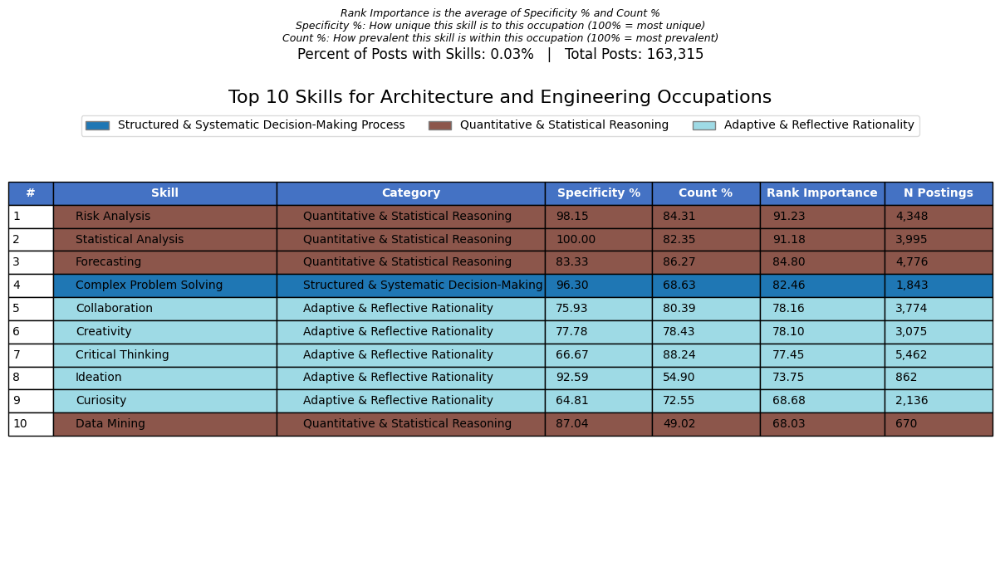

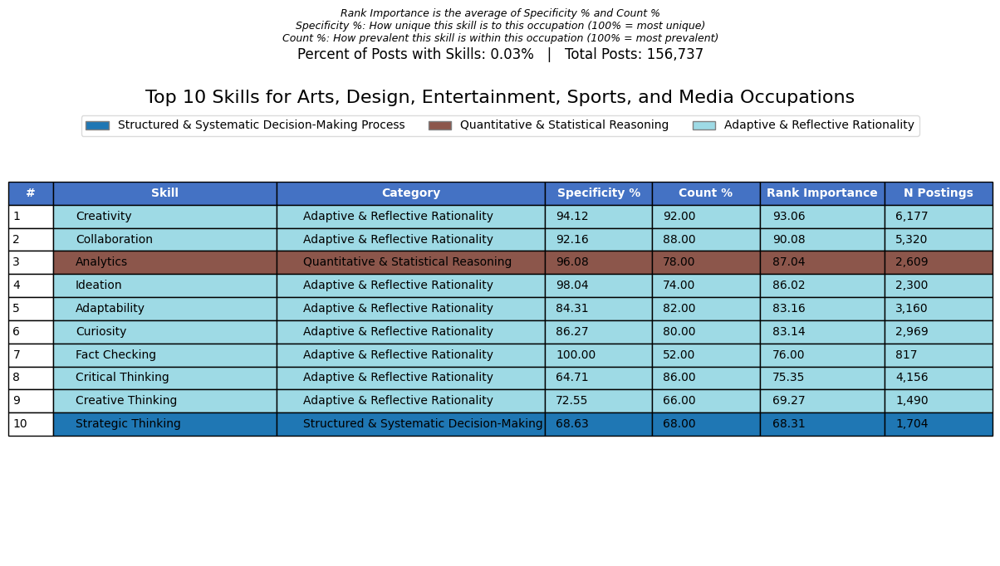

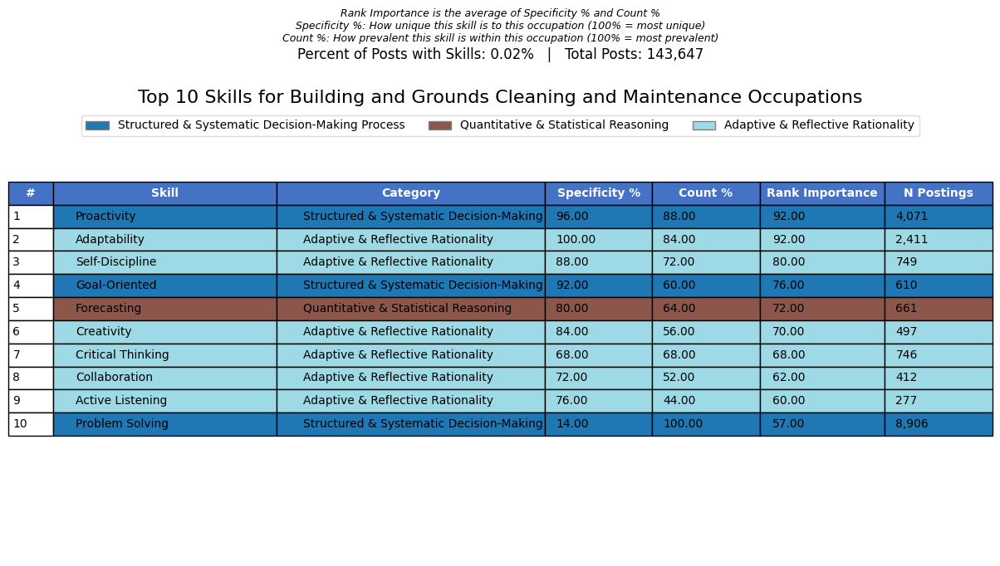

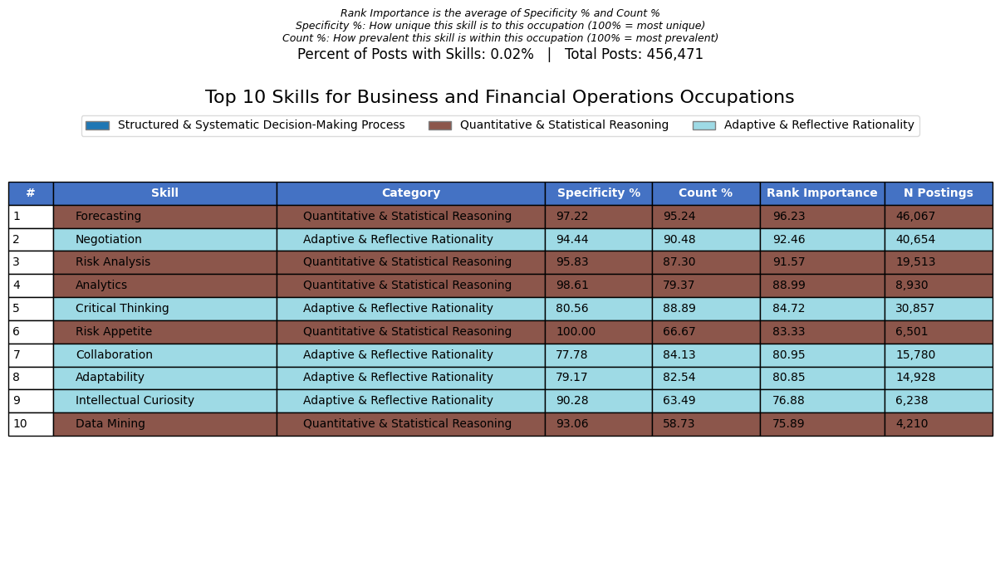

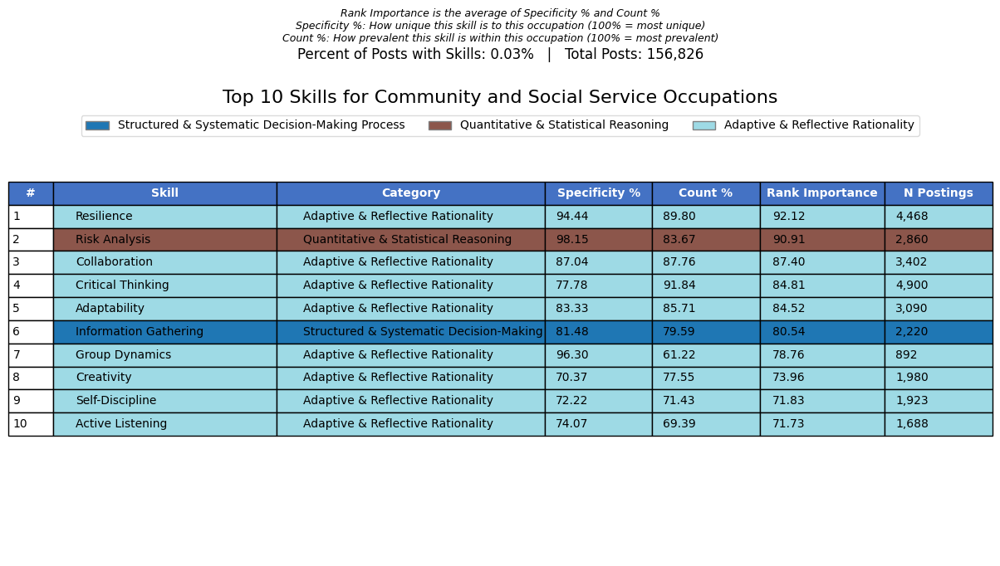

...

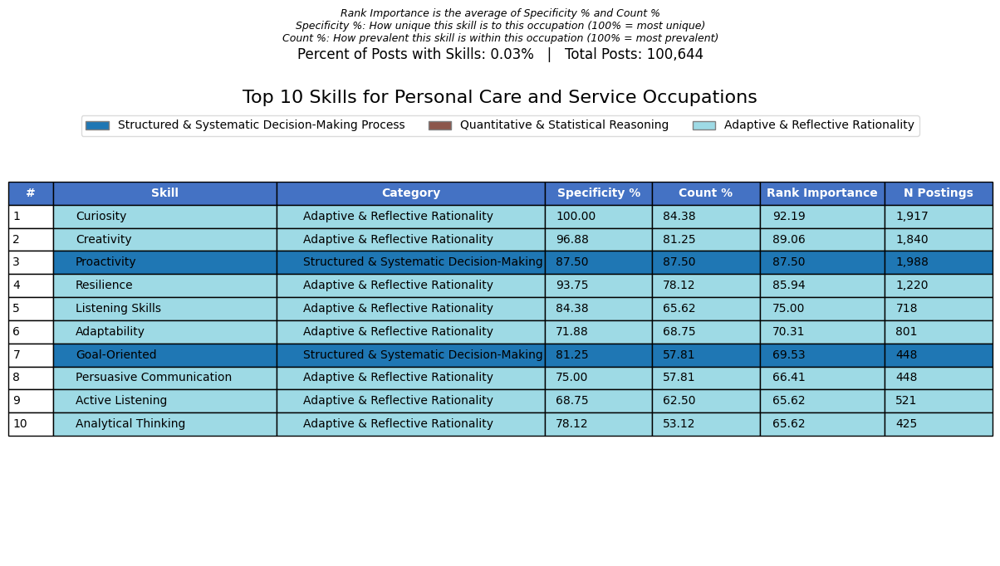

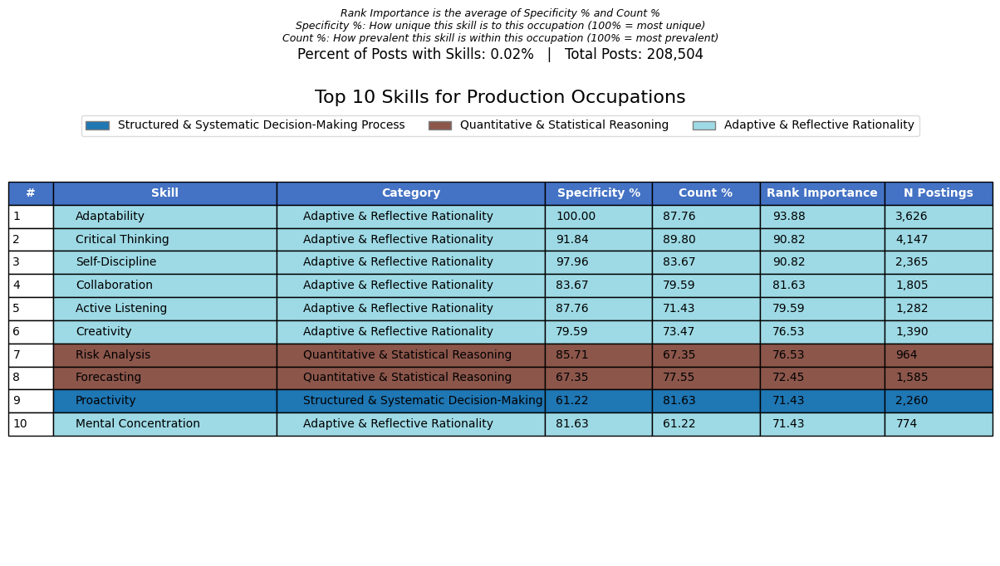

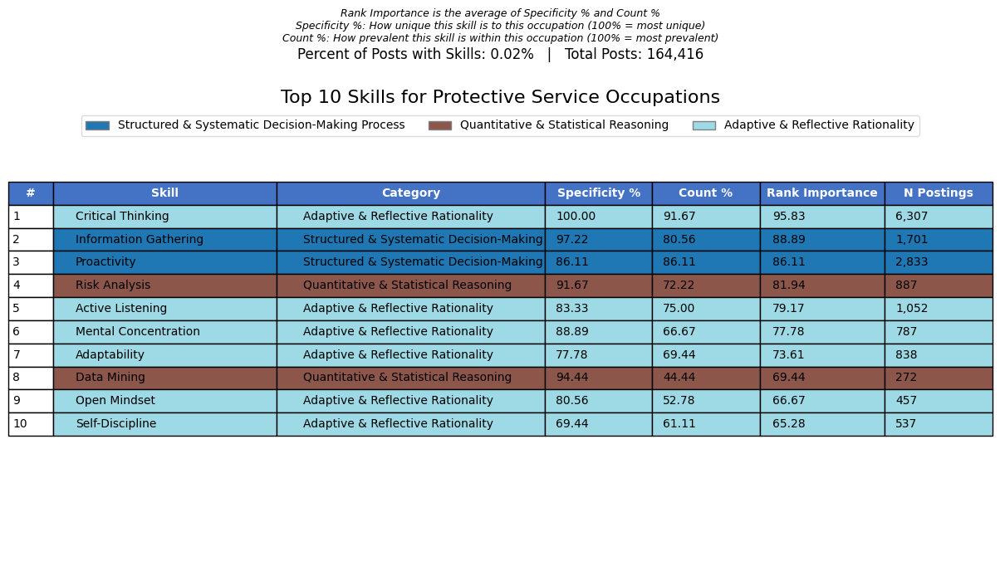

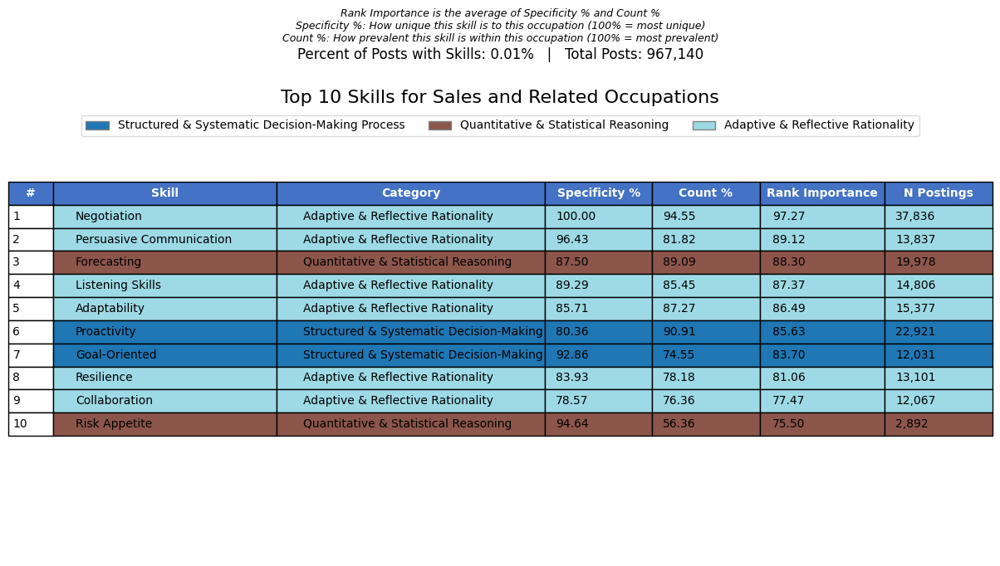

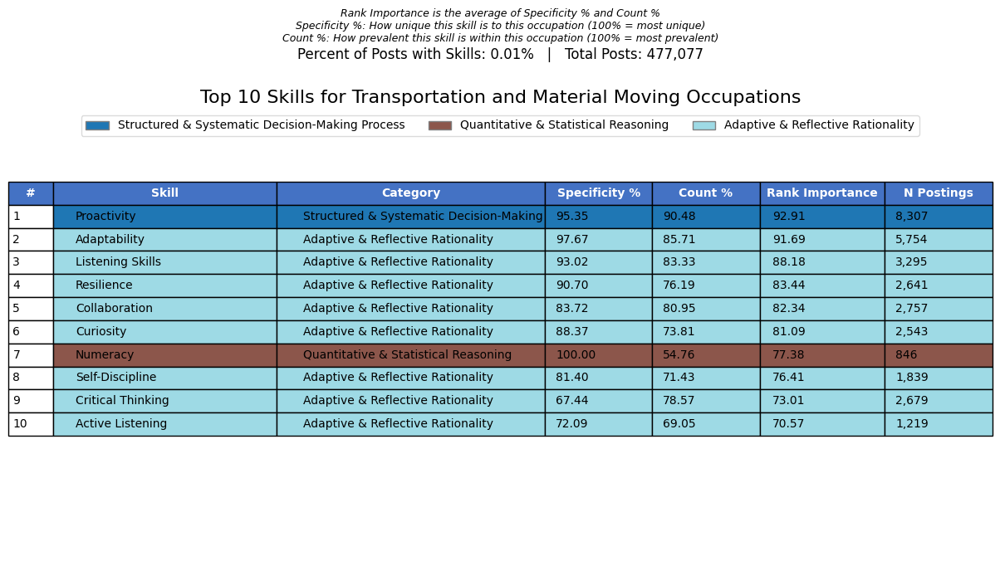

{'Architecture and Engineering Occupations': None,
 'Arts, Design, Entertainment, Sports, and Media Occupations': None,
 'Building and Grounds Cleaning and Maintenance Occupations': None,
 'Business and Financial Operations Occupations': None,
 'Community and Social Service Occupations': None,
 'Computer and Mathematical Occupations': None,
 'Construction and Extraction Occupations': None,
 'Educational Instruction and Library Occupations': None,
 'Farming, Fishing, and Forestry Occupations': None,
 'Food Preparation and Serving Related Occupations': None,
 'Healthcare Practitioners and Technical Occupations': None,
 'Healthcare Support Occupations': None,
 'Installation, Maintenance, and Repair Occupations': None,
 'Legal Occupations': None,
 'Life, Physical, and Social Science Occupations': None,
 'Management Occupations': None,
 'Military-only occupations': None,
 'Office and Administrative Support Occupations': None,
 'Personal Care and Service Occupations': None,
 'Production Occu

In [48]:
# Create tables for all SOC2 groups
create_all_soc2_skill_tables(top_skills_df)

In [49]:
soc2_importance_transformed

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,...,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL,SRCA_TF_IDF_ZSCORE,SRCA_TF_IDF_PERCENTILE,TF_IDF_ZSCORE,TF_IDF_PERCENTILE,RCA_TF_IDF_ZSCORE,RCA_TF_IDF_PERCENTILE,weighted_percentile_importance,weighted_average_importance
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.008428,9.293709
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,...,0.008533,False,0.861508,0.974026,0.854245,0.987013,0.789920,0.961039,0.075025,4.338286
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004264,4.712789
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,...,0.006039,False,0.609711,0.935065,0.660618,0.961039,0.478237,0.922078,0.055699,3.445860
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004281,4.731896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,...,0.002550,False,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.029429,1.971471
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.017605,2.230762
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,...,0.002059,False,0.807605,0.875000,0.959184,0.875000,0.651038,0.875000,0.024700,1.848911
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.011824,1.570101


In [50]:
def plot_skill_percent_overall(df,
                               soc2_col='SOC_2021_2_NAME',
                               skill_col='SKILL_NAME',
                               category_col='SKILL_CATEGORY',
                               n_skills=15,
                               output_dir='skill_percent_charts'):
    """
    Plot the top-n skills by the percent of *all* postings that mention them,
    irrespective of SOC2.  Percent = (total mentions of skill) / (total postings) * 100.
    """
    # 1) Compute total postings across all SOC2 groups
    total_posts = df.groupby(soc2_col)['SOC2_POST_COUNT'] \
                    .first() \
                    .sum()

    # 2) If you have a small-sample flag, filter it out first
    if 'SMALL_SAMPLE_FLAG_SKILL_POSTING' in df.columns:
        df = df[~df['SMALL_SAMPLE_FLAG_SKILL_POSTING']]

    # 3) Sum up mentions per skill
    skill_ct = (
        df
        .groupby(skill_col)
        .agg({
            'N': 'sum',
            category_col: lambda x: x.mode().iloc[0]
        })
        .reset_index()
        .rename(columns={'N': 'Mentions'})
    )

    # 4) Compute overall percent
    skill_ct['Percent'] = skill_ct['Mentions'] / total_posts * 100

    # 5) Take top n_skills
    top = skill_ct.nlargest(n_skills, 'Percent') \
                  .sort_values('Percent', ascending=True)

    # 6) Plotting setup
    os.makedirs(output_dir, exist_ok=True)
    y = np.arange(len(top))
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':               '#17becf'
    }
    colors = [category_colors.get(cat, '#7f7f7f') for cat in top[category_col]]

    plt.figure(figsize=(12, 8))
    bars = plt.barh(y, top['Percent'], color=colors, edgecolor='black')
    plt.yticks(y, top[skill_col], fontsize=10)

    # 7) Annotate bars with “xx.x%”
    for i, bar in enumerate(bars):
        pct = top['Percent'].iloc[i]
        plt.text(bar.get_width() + top['Percent'].max()*0.01,
                 bar.get_y() + bar.get_height()/2,
                 f"{pct:.1f}%", va='center', fontsize=10)

    # 8) Titles & labels
    plt.title(
        "Most Frequently Mentioned Skills\n(% of All Job Postings)",
        fontsize=14, fontweight='bold'
    )
    plt.xlabel("Percent of All Postings", fontsize=12)

    # 9) Legend by skill category
    legend_elems = [
        Patch(facecolor=clr, edgecolor='black', label=cat)
        for cat, clr in category_colors.items()
        if cat in top[category_col].unique()
    ]
    plt.legend(handles=legend_elems, loc='lower right')

    # 10) Footnote
    note = "Note: Percent = (total postings mentioning skill) ÷ (total postings overall) × 100."
    if 'SMALL_SAMPLE_FLAG_SKILL_POSTING' in df.columns:
        note += " Small-sample skill-postings were excluded."
    plt.figtext(0.5, 0.02, note, ha='center', fontsize=9, style='italic')

    plt.grid(axis='x', linestyle='--', alpha=0.3)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])

    out = os.path.join(output_dir, "top_skills_overall_percent.png")
    plt.savefig(out, dpi=300, bbox_inches='tight')
    print(f"Saved overall percent chart to {out}")
    plt.show()
    plt.close()




Saved overall percent chart to skill_percent_charts/top_skills_overall_percent.png


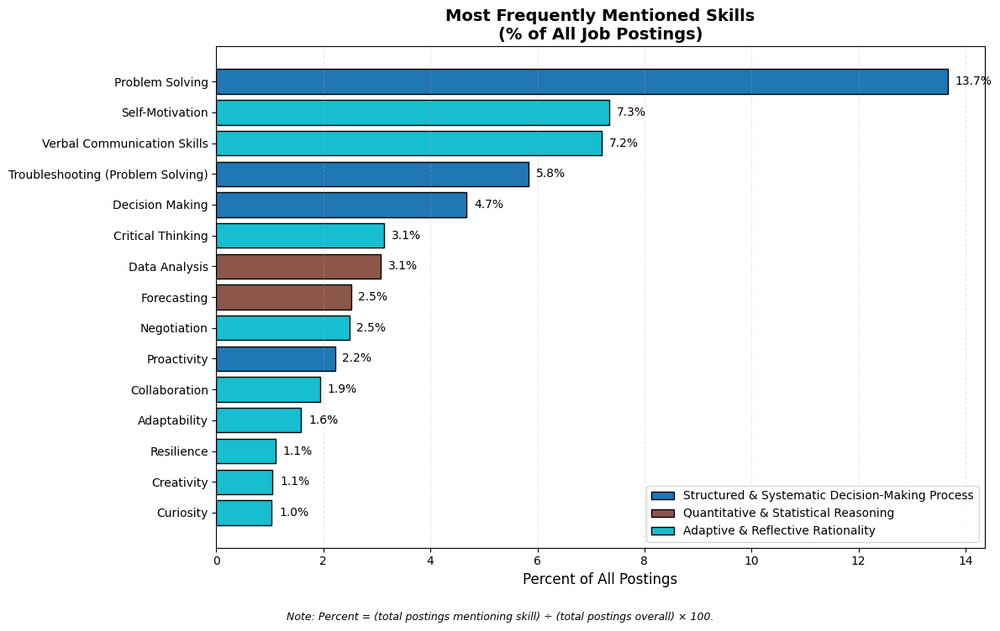

In [51]:
# Example usage:
plot_skill_percent_overall(soc2_importance_transformed, 'SOC_2021_2_NAME', 'SKILL_NAME', 'SKILL_CATEGORY', n_skills=15)

In [52]:
def plot_skill_rate_by_soc2_with_aggregate(df,
                                           target_soc2_code="11-0000",
                                           soc2_name_col='SOC_2021_2_NAME',
                                           soc2_code_col='SOC_2021_2',
                                           skill_col='SKILL_NAME',
                                           category_col='SKILL_CATEGORY',
                                           n_skills=10,
                                           output_dir='skill_rate_charts'):
    """
    Create two skill-rate charts, expressed as PERCENT of postings:
    1. Top skills for a specific SOC2 group (target_soc2_code)
    2. Top skills for all other SOC2 groups combined

    Percent = (mean SKILL_RATE or RCA_SKILL_RATE) * 100.
    """
    # 1) Filter small samples if flagged
    has_flag = 'SMALL_SAMPLE_FLAG_SKILL_POSTING' in df.columns
    if has_flag:
        df = df[~df['SMALL_SAMPLE_FLAG_SKILL_POSTING']]

    # 2) Identify rate column
    for col in ('SKILL_RATE','RCA_SKILL_RATE'):
        if col in df.columns:
            rate_col = col
            break
    else:
        raise ValueError("No SKILL_RATE or RCA_SKILL_RATE column found")

    # 3) Aggregate by SOC2 + skill
    agg = df.groupby([soc2_code_col, soc2_name_col, skill_col]).agg({
        rate_col: 'mean',
        category_col: lambda x: x.mode().iloc[0]
    }).reset_index()

    # 4) Convert rate→percent
    agg['Percent'] = agg[rate_col] * 100

    # 5) Color map
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':               '#17becf'
    }

    os.makedirs(output_dir, exist_ok=True)

    # helper to plot top n_skills by Percent
    def create_chart(data, title, fname_suffix):
        if data.empty:
            print(f"No data for {title}")
            return
        top = data.nlargest(n_skills, 'Percent').sort_values('Percent', ascending=True)
        y = np.arange(len(top))
        colors = [category_colors.get(cat, '#7f7f7f') for cat in top[category_col]]

        plt.figure(figsize=(10, 8))
        bars = plt.barh(y, top['Percent'], color=colors, edgecolor='black', height=0.7)
        plt.yticks(y, top[skill_col])

        for i, bar in enumerate(bars):
            pct = top['Percent'].iloc[i]
            plt.text(bar.get_width() + top['Percent'].max()*0.01,
                     bar.get_y() + bar.get_height()/2,
                     f"{pct:.1f}%", va='center', fontsize=10)

        plt.title(f"{title}\n(Percent of Job Postings Mentioning Each Skill)",
                  fontsize=14, fontweight='bold')
        rate_label = "Skill Rate (%)" if rate_col=="SKILL_RATE" else "RCA × Skill Rate (%)"
        plt.xlabel(rate_label, fontsize=12)

        note = "Only specialized skills (RCA > 1) shown." if rate_col=="RCA_SKILL_RATE" else ""
        plt.figtext(0.5, 0.01, note, ha='center', fontsize=9, style='italic')

        legend_elems = [
            Patch(facecolor=color, edgecolor='black', label=cat)
            for cat, color in category_colors.items()
            if cat in top[category_col].unique()
        ]
        if legend_elems:
            plt.legend(handles=legend_elems, loc='lower right')

        plt.grid(axis='x', linestyle='--', alpha=0.3)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])

        out_path = os.path.join(output_dir, f"top_skills_{fname_suffix}.png")
        plt.savefig(out_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()
        print(f"Saved chart: {out_path}")

    # 6a) Target SOC2
    target = agg[agg[soc2_code_col].astype(str)==str(target_soc2_code)]
    create_chart(target, f"Most Frequently Requested Skills in {target_soc2_code}", f"soc2_{target_soc2_code}")

    # 6b) All other SOC2 combined
    others = agg[agg[soc2_code_col].astype(str)!=str(target_soc2_code)]
    # re-aggregate across SOC2 for overall
    other_agg = others.groupby(skill_col).agg({
        'Percent': 'mean',
        category_col: lambda x: x.mode().iloc[0]
    }).reset_index()
    create_chart(other_agg, "Most Frequently Requested Skills in All Other SOC2 Groups", "all_others")

    return {'target': target, 'others': other_agg}


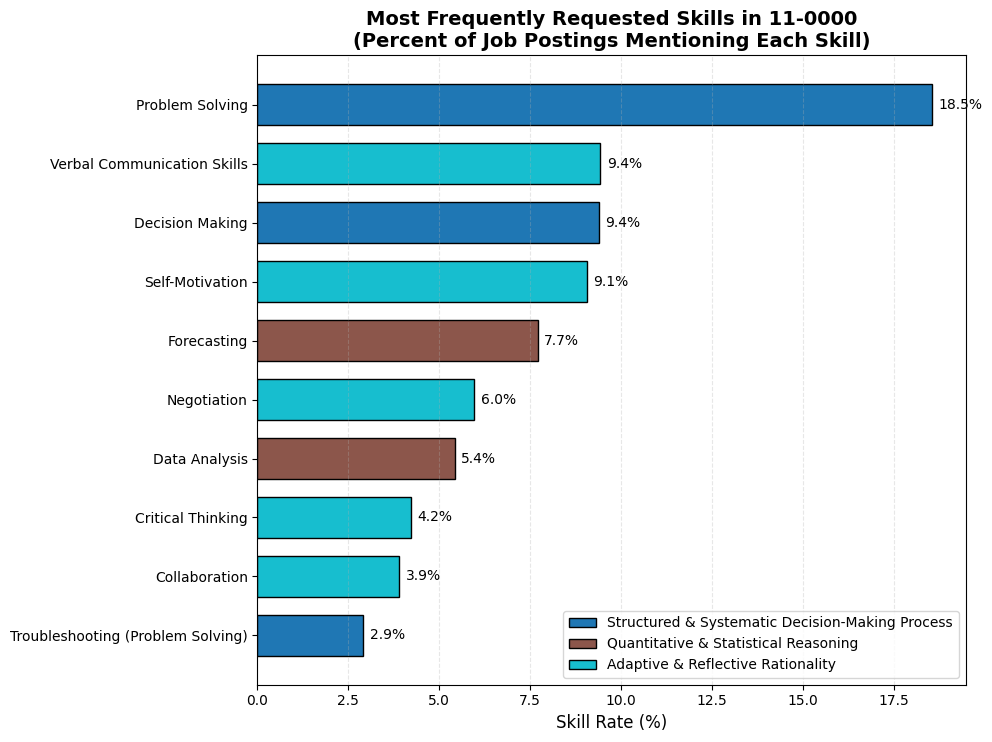

Saved chart: skill_rate_charts/top_skills_soc2_11-0000.png


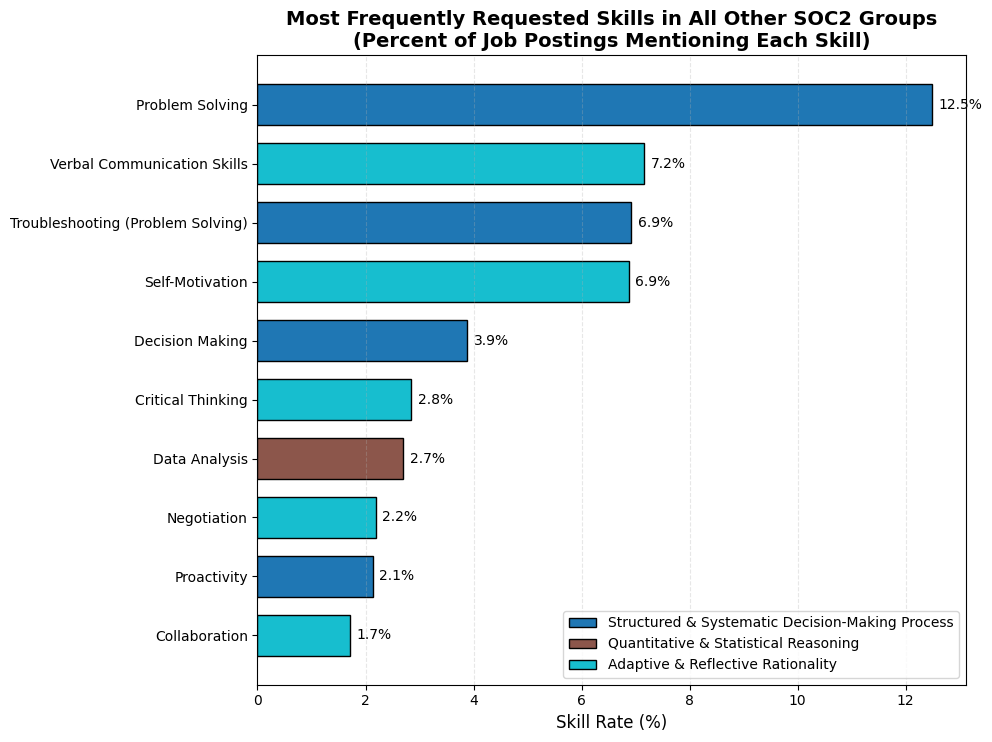

Saved chart: skill_rate_charts/top_skills_all_others.png


In [53]:
# Example usage:
result_dfs = plot_skill_rate_by_soc2_with_aggregate(soc2_importance_transformed, target_soc2_code="11-0000")  # "11-0000" for Management Occupations

In [54]:
soc2_importance_transformed

,SOC_2021_2,SOC_2021_2_NAME,SOC2_POST_COUNT,SKILL_NAME,N,SKILL_CATEGORY,SKILL_SHARE,SKILL_RATE,SKILL_TOTAL,SKILL_IN_OCCS_COUNT,...,SRCA_TF_IDF,SMALL_SAMPLE_FLAG_SKILL_TOTAL,SRCA_TF_IDF_ZSCORE,SRCA_TF_IDF_PERCENTILE,TF_IDF_ZSCORE,TF_IDF_PERCENTILE,RCA_TF_IDF_ZSCORE,RCA_TF_IDF_PERCENTILE,weighted_percentile_importance,weighted_average_importance
781,11-0000,Management Occupations,764137,Problem Solving,141686,Structured & Systematic Decision-Making Process,0.169586,0.185420,929986,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.008428,9.293709
142,11-0000,Management Occupations,764137,Forecasting,58858,Quantitative & Statistical Reasoning,0.070448,0.077025,170962,21,...,0.008533,False,0.861508,0.974026,0.854245,0.987013,0.789920,0.961039,0.075025,4.338286
514,11-0000,Management Occupations,764137,Decision Making,71677,Structured & Systematic Decision-Making Process,0.085791,0.093801,318173,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004264,4.712789
129,11-0000,Management Occupations,764137,Negotiation,45517,Adaptive & Reflective Rationality,0.054480,0.059567,168879,21,...,0.006039,False,0.609711,0.935065,0.660618,0.961039,0.478237,0.922078,0.055699,3.445860
780,11-0000,Management Occupations,764137,Verbal Communication Skills,71969,Adaptive & Reflective Rationality,0.086141,0.094183,489656,23,...,0.000000,False,0.000000,0.045455,0.000000,0.045455,0.000000,0.045455,0.004281,4.731896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,55-0000,Military-only occupations,1665,Proactivity,49,Structured & Systematic Decision-Making Process,0.047527,0.029429,150947,22,...,0.002550,False,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.029429,1.971471
565,55-0000,Military-only occupations,1665,Decision Making,67,Structured & Systematic Decision-Making Process,0.064985,0.040240,318173,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.017605,2.230762
249,55-0000,Military-only occupations,1665,Critical Thinking,47,Adaptive & Reflective Rationality,0.045587,0.028228,213315,22,...,0.002059,False,0.807605,0.875000,0.959184,0.875000,0.651038,0.875000,0.024700,1.848911
115,55-0000,Military-only occupations,1665,Data Analysis,45,Quantitative & Statistical Reasoning,0.043647,0.027027,208646,23,...,0.000000,False,0.000000,0.437500,0.000000,0.437500,0.000000,0.437500,0.011824,1.570101


In [55]:
# 3b. Top Skills by Management vs Other
def plot_skill_rate_by_soc2_with_aggregate(df, target_soc2_code="11-0000", soc2_name_col='SOC_2021_2_NAME', 
                                    soc2_code_col='SOC_2021_2', skill_col='SKILL_NAME', 
                                    category_col='SKILL_CATEGORY', n_skills=10, 
                                    output_dir='skill_rate_charts'):
    """
    Create two skill rate charts:
    1. Top skills for a specific SOC2 group (target_soc2_code, e.g., "11-0000" for Management Occupations)
    2. Top aggregated skills for all other SOC2 groups combined
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Skills dataframe
    target_soc2_code : str
        The specific SOC2 code to analyze separately (e.g., "11-0000" for Management Occupations)
    soc2_code_col : str
        Column name containing SOC2 group codes
    soc2_name_col : str
        Column name containing SOC2 group names
    skill_col : str
        Column name containing skill names
    category_col : str
        Column name containing skill categories
    n_skills : int
        Number of most frequent skills to display per chart
    output_dir : str
        Directory to save charts
    """
    
    # Debugging: Print column names to verify they exist
    print("Available columns in DataFrame:", df.columns.tolist())
    
    # Check if target columns exist
    if soc2_code_col not in df.columns:
        print(f"ERROR: SOC2 code column '{soc2_code_col}' not found in DataFrame")
        return
    if soc2_name_col not in df.columns:
        print(f"ERROR: SOC2 name column '{soc2_name_col}' not found in DataFrame")
        return
        
    # Debug: Check values in the SOC2 code column
    print(f"SOC2 code column data type: {df[soc2_code_col].dtype}")
    print(f"Unique values in SOC2 code column: {df[soc2_code_col].unique()[:10]} ... (showing first 10)")
    
    # If SOC2 code is stored as a number, convert target to numeric for comparison
    if df[soc2_code_col].dtype in ['int64', 'float64'] or pd.api.types.is_numeric_dtype(df[soc2_code_col]):
        print(f"Converting target_soc2_code '{target_soc2_code}' to numeric for comparison")
        try:
            target_soc2_code = int(target_soc2_code)
        except ValueError:
            print(f"ERROR: Cannot convert '{target_soc2_code}' to numeric")
            return
    
    # Check for small sample flag
    has_small_sample_flag = 'SMALL_SAMPLE_FLAG_SKILL_POSTING' in df.columns
    if has_small_sample_flag:
        print("Small sample flag found in data - will filter out small samples")
        # Count small samples before filtering
        small_samples_count = df[df['SMALL_SAMPLE_FLAG_SKILL_POSTING'] == True].drop_duplicates(subset=[soc2_code_col, skill_col]).shape[0]
        total_samples = df.drop_duplicates(subset=[soc2_code_col, skill_col]).shape[0]
        print(f"Found {small_samples_count} small samples out of {total_samples} total skill-occupation combinations ({small_samples_count/total_samples*100:.1f}%)")
        
        # Apply the filter
        filtered_df = df[df['SMALL_SAMPLE_FLAG_SKILL_POSTING'] == False]
        print(f"After filtering small samples: {filtered_df.shape[0]} rows remaining (from {df.shape[0]})")
    else:
        print("No small sample flag found - using all data")
        filtered_df = df.copy()
    
    # Find skill rate column
    skill_rate_col = None
    for col_name in ['SKILL_RATE', 'RCA_SKILL_RATE']:
        if col_name in filtered_df.columns:
            skill_rate_col = col_name
            break
            
    if not skill_rate_col:
        print("Error: Could not find skill rate column. Please specify the correct column name.")
        return
        
    print(f"Using {skill_rate_col} for skill rate values")
    
    # Group by SOC2 and skill name
    print("Grouping data by SOC2 and skill name...")
    
    # Define aggregation functions
    agg_dict = {
        'RCA': 'mean',
        skill_rate_col: 'mean',
        category_col: lambda x: x.mode().iloc[0] if not x.empty else None
    }
    
    # Add small sample flag to aggregation if it exists
    if has_small_sample_flag:
        agg_dict['SMALL_SAMPLE_FLAG_SKILL_POSTING'] = 'any'  # If any are True, result is True
    
    # Perform aggregation
    aggregated_df = filtered_df.groupby([soc2_code_col, soc2_name_col, skill_col]).agg(agg_dict).reset_index()
    
    print(f"Original shape: {filtered_df.shape}, Aggregated shape: {aggregated_df.shape}")
    
    # Fixed colors for skill categories
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',  # Blue
        'Quantitative & Statistical Reasoning': '#8c564b',            # Brown
        'Adaptive & Reflective Rationality': '#17becf'                # Light blue/cyan
    }
    
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created output directory: {output_dir}")
    
    # 1. Process target SOC2 group
    print(f"Filtering for target SOC2 code: {target_soc2_code}")
    print(f"Type of target_soc2_code: {type(target_soc2_code)}")
    
    # Try different approaches to filter the data
    if isinstance(target_soc2_code, str):
        print("Using string comparison")
        target_soc_data = aggregated_df[
            (aggregated_df[soc2_code_col].astype(str) == target_soc2_code) & 
            (aggregated_df['RCA'] > 1)
        ]
    else:
        print("Using numeric comparison")
        target_soc_data = aggregated_df[
            (aggregated_df[soc2_code_col] == target_soc2_code) & 
            (aggregated_df['RCA'] > 1)
        ]
    
    # Check if we found any matching data
    print(f"Found {len(target_soc_data)} skills for SOC2 code '{target_soc2_code}' meeting criteria")
    
    if len(target_soc_data) == 0:
        # Try an alternative approach - filter by name instead if no results found
        print("No skills found by code. Trying to filter by SOC2 name containing 'Management'...")
        management_data = aggregated_df[
            (aggregated_df[soc2_name_col].str.contains('Management', case=False)) & 
            (aggregated_df['RCA'] > 1)
        ]
        print(f"Found {len(management_data)} skills for SOC2 name containing 'Management'")
        
        if len(management_data) > 0:
            target_soc_data = management_data
            target_soc_code = management_data[soc2_code_col].iloc[0]  # Use the actual code found
            print(f"Using SOC2 code '{target_soc_code}' for Management Occupations")
    
    target_soc_name = target_soc_data[soc2_name_col].iloc[0] if not target_soc_data.empty else f"SOC2 Code {target_soc2_code}"
    print(f"Processing target group: {target_soc_name} with {len(target_soc_data)} skills meeting criteria")
    
    # 2. Process all other SOC2 groups (aggregate their data)
    other_soc_data = aggregated_df[
        (aggregated_df[soc2_code_col].astype(str) != str(target_soc2_code)) & 
        (aggregated_df['RCA'] > 1)
    ]
    
    # Aggregate the other SOC groups by skill
    other_agg_dict = {
        skill_rate_col: 'mean',
        'RCA': 'mean',
        category_col: lambda x: x.mode().iloc[0] if not x.empty else None
    }
    
    other_skills_agg = other_soc_data.groupby(skill_col).agg(other_agg_dict).reset_index()
    print(f"Aggregated other SOC2 groups: {len(other_skills_agg)} unique skills")
    
    # Function to create and save a chart
    def create_chart(data, title_prefix, filename_suffix):
        if data.empty:
            print(f"No data available for {title_prefix} chart")
            return
            
        # Get the top N skills by Skill Rate
        top_skills = data.sort_values(skill_rate_col, ascending=False).head(n_skills)
        
        # Sort skills in ascending order for better visualization (highest at top)
        top_skills = top_skills.sort_values(skill_rate_col, ascending=True)
        
        plt.figure(figsize=(10, 8))
        
        # Assign colors based on skill categories
        bar_colors = [category_colors.get(cat, '#7f7f7f') for cat in top_skills[category_col]]
        
        # Create horizontal bars
        y_pos = np.arange(len(top_skills))
        
        # Convert skill rate to percentage for display
        percentage_values = top_skills[skill_rate_col] * 100
        
        bars = plt.barh(y_pos, percentage_values, 
                      height=0.7, color=bar_colors, edgecolor='black', linewidth=0.5)
        
        # Set y-tick labels
        plt.yticks(y_pos, top_skills[skill_col])
        
        # Add Skill Rate value labels (as percentages)
        for j, bar in enumerate(bars):
            plt.text(max(0.5, bar.get_width() + 0.5), 
                   bar.get_y() + bar.get_height()/2, 
                   f'{percentage_values.iloc[j]:.1f}%', va='center', fontsize=10)
        
        # Create title and labels
        rate_type = "Skill Rate" if skill_rate_col == "SKILL_RATE" else "RCA × Skill Rate" 
        
        plt.title(f'{title_prefix}\n(Percentage of Job Postings Mentioning Each Skill)', 
                 fontsize=14, fontweight='bold')
        plt.xlabel(f'{rate_type} (%)', fontsize=12)
        
        # Add subtitle explaining criteria
        note_text = "Note: Only showing specialized skills (RCA > 1)"
        if has_small_sample_flag:
            note_text += " with sufficient sample size"
        
        plt.figtext(0.5, 0.01, note_text, ha='center', fontsize=10, fontstyle='italic')
        
        # Set x-axis limit
        max_value = percentage_values.max()
        if np.isfinite(max_value) and max_value > 0:
            plt.xlim(0, max_value * 1.15)  # Extra space for labels
        else:
            plt.xlim(0, 100.0)
        
        # Add grid lines
        plt.grid(axis='x', linestyle='--', alpha=0.3)
        
        # Add legend for skill categories with clearer titles
        from matplotlib.patches import Patch
        category_labels = {
            'Structured & Systematic Decision-Making Process': 'Decision-Making Skills',
            'Quantitative & Statistical Reasoning': 'Quantitative Skills',
            'Adaptive & Reflective Rationality': 'Adaptive Skills'
        }
        
        legend_elements = []
        categories_in_data = top_skills[category_col].unique()
        for cat, color in category_colors.items():
            if cat in categories_in_data:
                label = category_labels.get(cat, cat)
                legend_elements.append(Patch(facecolor=color, edgecolor='black', label=label))
        
        if legend_elements:
            plt.legend(handles=legend_elements, loc='lower right')
        
        # Tight layout but with room for the subtitle
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        
        # Save and close this figure
        plt.savefig(f"{output_dir}/most_frequent_skills_{filename_suffix}.png", dpi=300, bbox_inches='tight')
        plt.show()  # Show the plot before closing
        plt.close()
    
    # Create the two charts
    create_chart(target_soc_data, f"Most Frequently Requested Skills in {target_soc_name}", f"soc2_code_{target_soc2_code}")
    create_chart(other_skills_agg, "Most Frequently Requested Skills Across All Other SOC2 Groups", "all_other_soc2_groups")
    
    # Also return the dataframes for further analysis
    return {
        'target_soc_skills': target_soc_data.sort_values(skill_rate_col, ascending=False).head(n_skills),
        'other_soc_skills': other_skills_agg.sort_values(skill_rate_col, ascending=False).head(n_skills)
    }


Available columns in DataFrame: ['SOC_2021_2', 'SOC_2021_2_NAME', 'SOC2_POST_COUNT', 'SKILL_NAME', 'N', 'SKILL_CATEGORY', 'SKILL_SHARE', 'SKILL_RATE', 'SKILL_TOTAL', 'SKILL_IN_OCCS_COUNT', 'TF_IDF', 'RCA', 'SRCA', 'RCA_SKILL_SHARE', 'RCA_SKILL_RATE', 'RCA_TF_IDF', 'SRCA_SKILL_SHARE', 'SRCA_SKILL_RATE', 'SRCA_TF_IDF', 'SMALL_SAMPLE_FLAG_SKILL_TOTAL', 'SRCA_TF_IDF_ZSCORE', 'SRCA_TF_IDF_PERCENTILE', 'TF_IDF_ZSCORE', 'TF_IDF_PERCENTILE', 'RCA_TF_IDF_ZSCORE', 'RCA_TF_IDF_PERCENTILE', 'weighted_percentile_importance', 'weighted_average_importance']
SOC2 code column data type: object
Unique values in SOC2 code column: ['11-0000' '13-0000' '15-0000' '17-0000' '19-0000' '21-0000' '23-0000'
 '25-0000' '27-0000' '29-0000'] ... (showing first 10)
No small sample flag found - using all data
Using SKILL_RATE for skill rate values
Grouping data by SOC2 and skill name...
Original shape: (1023, 28), Aggregated shape: (1023, 6)
Filtering for target SOC2 code: 11-0000
Type of target_soc2_code: <class 'st

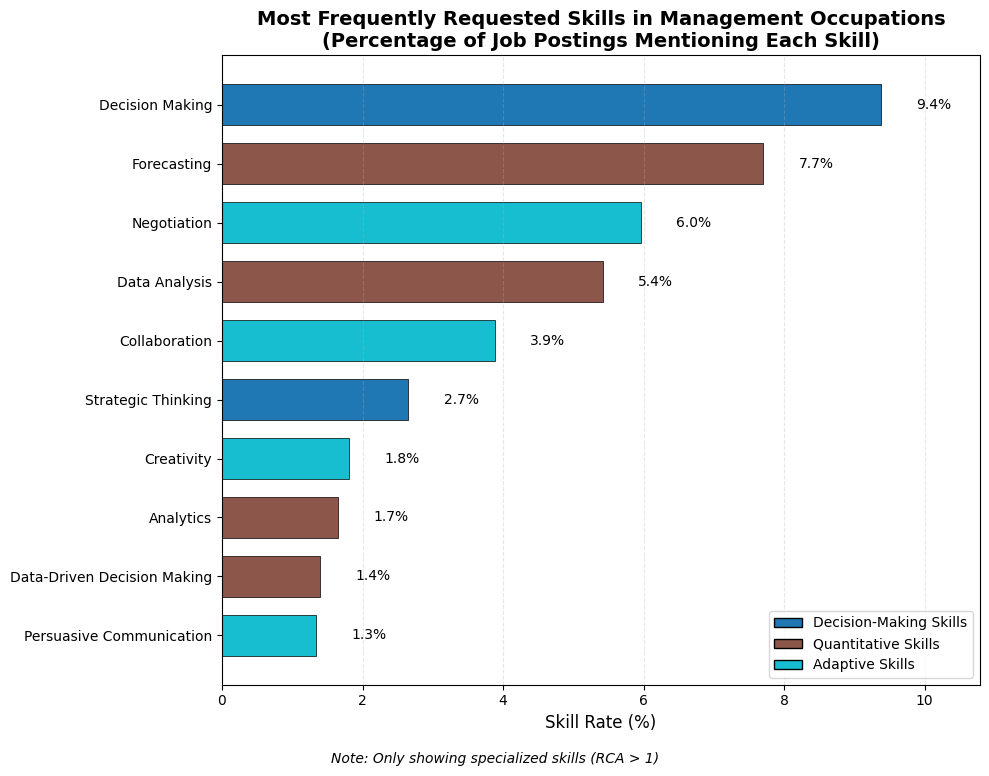

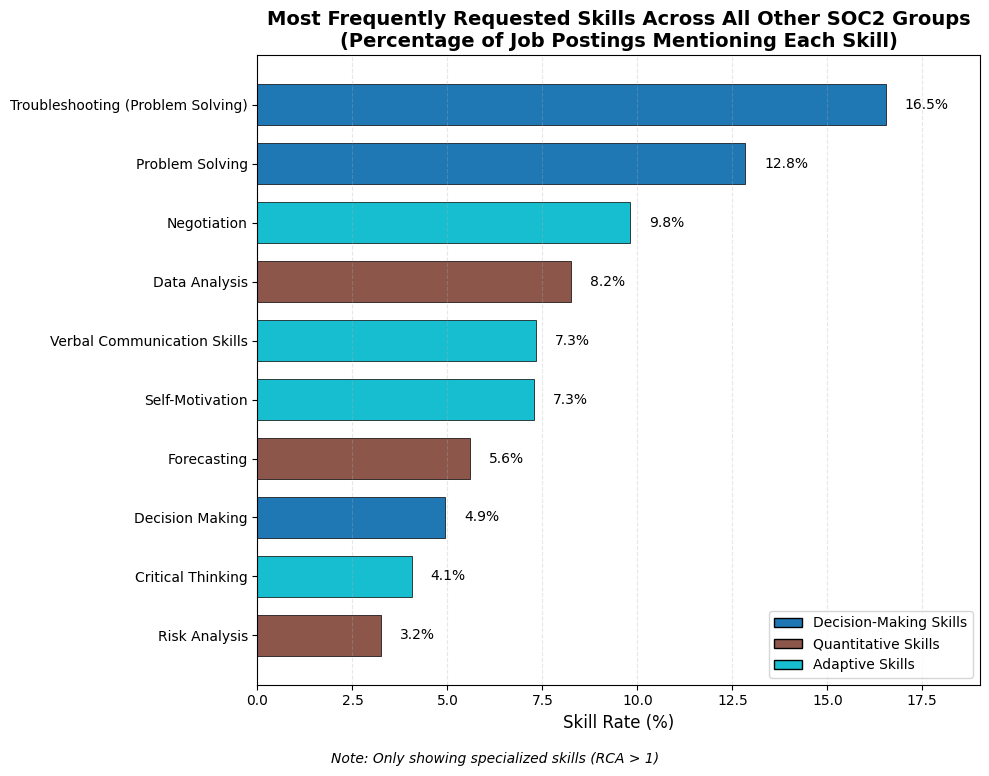

In [56]:
# Example usage:
result_dfs = plot_skill_rate_by_soc2_with_aggregate(soc2_importance_transformed, target_soc2_code="11-0000")  # "11-0000" for Management Occupations

In [57]:
# Export to Excel with all sheets

# ---  Generate your top_skills_df before exporting ---
top_skills_df = generate_top_skills_lists(
    soc2_importance_transformed,
    soc2_col='SOC_2021_2_NAME',
    skill_col='SKILL_NAME',
    category_col='SKILL_CATEGORY',
    n_skills=10
)

# ---  Prepare output path ---
output_dir = "Output"
os.makedirs(output_dir, exist_ok=True)
excel_path = os.path.join(output_dir, "2025.07.09 - skill_importance.xlsx")

# --- 2) Write both sheets ---
with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:
    # a) SOC2‐level summary
    soc2_importance_transformed.to_excel(
        writer,
        sheet_name='SOC2_Level',
        index=False
    )
    #  Top skills per SOC2
    top_skills_df.to_excel(
        writer,
        sheet_name='Top_Skills',
        index=False
    )

print(f"Successfully exported data to {excel_path}")


/tmp/ipykernel_38116/1312801916.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group['N'].gt(0).sum() / group['SOC2_POST_COUNT'].iloc[0])


Successfully exported data to Output/2025.07.09 - skill_importance.xlsx


In [58]:
# Query to get skill-occupation relationships by experience levels
skill_occ_exp_query = f"""
WITH base_postings AS (
    SELECT 
        ID,
        SOC_2021_2,
        SOC_2021_2_NAME,
        COALESCE(MIN_YEARS_EXPERIENCE, 0) AS MIN_YEARS_EXPERIENCE,
        CASE 
            WHEN COALESCE(MIN_YEARS_EXPERIENCE, 0) < 3 THEN 'Entry Level (0-3 years)'
            WHEN COALESCE(MIN_YEARS_EXPERIENCE, 0) BETWEEN 3 AND 8 THEN 'Mid Level (3-8 years)'
            WHEN COALESCE(MIN_YEARS_EXPERIENCE, 0) > 8 THEN 'Senior Level (8+ years)'
            ELSE 'Unknown'
        END AS experience_level,
        YEAR(POSTED) AS YEAR
    FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS
    WHERE YEAR(POSTED) BETWEEN 2023 AND 2024
      AND SOC_2021_2 IS NOT NULL
      AND SOC_2021_2 != '99-0000'
      AND ARRAY_SIZE(SKILLS) > 0
      AND (SALARY_TO > 0 OR SALARY > 0 OR SALARY_FROM > 0)
      AND ARRAY_CONTAINS('Company'::VARIANT, SOURCE_TYPES)
      AND IS_INTERNSHIP = FALSE
      AND COMPANY_IS_STAFFING = FALSE
),
soc2_exp_counts AS (
    SELECT 
        SOC_2021_2,
        experience_level,
        COUNT(DISTINCT ID) AS soc2_exp_post_count
    FROM base_postings
    GROUP BY SOC_2021_2, experience_level
)
SELECT 
    bp.SOC_2021_2,
    bp.SOC_2021_2_NAME,
    bp.experience_level,
    sec.soc2_exp_post_count,
    ps.SKILL_NAME,
    sl."Category Name"      AS SKILL_CATEGORY,
    COUNT(DISTINCT bp.ID)   AS N,
    COUNT(DISTINCT bp.ID) * 1.0 
      / sec.soc2_exp_post_count AS skill_rate
FROM base_postings bp

-- count posts per SOC2 & experience bucket
JOIN soc2_exp_counts sec 
  ON bp.SOC_2021_2       = sec.SOC_2021_2 
 AND bp.experience_level = sec.experience_level

-- expand to one row per skill
JOIN BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS_SKILLS ps 
  ON bp.ID = ps.ID

-- bring in your ADE_LC skills lookup to get Category Name
JOIN TEMPORARY_DATA.JNANIA."ADE_LC_skills_v5_2025_03_10" sl
  ON ps.SKILL_NAME = sl."Skill"

WHERE ps.SKILL_NAME IN ({', '.join([f"'{skill}'" for skill in skills])})

GROUP BY 
    bp.SOC_2021_2,
    bp.SOC_2021_2_NAME,
    bp.experience_level,
    sec.soc2_exp_post_count,
    ps.SKILL_NAME,
    sl."Category Name"

HAVING sec.soc2_exp_post_count >= 50

ORDER BY 
    bp.SOC_2021_2,
    bp.experience_level,
    skill_rate DESC;
"""

# Execute query and get data
occ_skills_by_exp = pd.read_sql(skill_occ_exp_query, conn)

/tmp/ipykernel_38116/3919122332.py:78: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  occ_skills_by_exp = pd.read_sql(skill_occ_exp_query, conn)


In [59]:
occ_skills_by_exp

,SOC_2021_2,SOC_2021_2_NAME,EXPERIENCE_LEVEL,SOC2_EXP_POST_COUNT,SKILL_NAME,SKILL_CATEGORY,N,SKILL_RATE
0,11-0000,Management Occupations,Entry Level (0-3 years),310123,Problem Solving,Structured & Systematic Decision-Making Process,43706,0.140931
1,11-0000,Management Occupations,Entry Level (0-3 years),310123,Verbal Communication Skills,Adaptive & Reflective Rationality,24638,0.079446
2,11-0000,Management Occupations,Entry Level (0-3 years),310123,Self-Motivation,Adaptive & Reflective Rationality,23519,0.075838
3,11-0000,Management Occupations,Entry Level (0-3 years),310123,Decision Making,Structured & Systematic Decision-Making Process,20407,0.065803
4,11-0000,Management Occupations,Entry Level (0-3 years),310123,Forecasting,Quantitative & Statistical Reasoning,15806,0.050967
...,...,...,...,...,...,...,...,...
4390,55-0000,Military-only occupations,Senior Level (8+ years),266,Data Analysis,Quantitative & Statistical Reasoning,2,0.007519
4391,55-0000,Military-only occupations,Senior Level (8+ years),266,Cost Benefit Analysis,Quantitative & Statistical Reasoning,1,0.003759
4392,55-0000,Military-only occupations,Senior Level (8+ years),266,Proactivity,Structured & Systematic Decision-Making Process,1,0.003759
4393,55-0000,Military-only occupations,Senior Level (8+ years),266,Creativity,Adaptive & Reflective Rationality,1,0.003759


In [60]:
# First, get all entries without the skills filter
basic_query = """
SELECT 
    p.ID,
    p.SOC_2021_2,
    p.SOC_2021_2_NAME,
    p.SOC_2021_5,  -- Added SOC5 code
    p.SOC_2021_5_NAME,  -- Added SOC5 name
    p.MIN_YEARS_EXPERIENCE,
    p.TITLE,
    p.COMPANY_NAME,
    p.POSTED,
    p.SKILLS,
    p.CITY,
    p.STATE,
    p.SALARY,
    p.SALARY_FROM,
    p.SALARY_TO
FROM BGI_POSTINGS_BACKUPS.FEB_25.US_POSTINGS p
WHERE YEAR(p.POSTED) BETWEEN 2023 AND 2024
  AND p.SOC_2021_2 = '11-0000'      -- Management Occupations only
  AND (p.SALARY_TO > 0 OR p.SALARY > 0 OR p.SALARY_FROM > 0)
  AND ARRAY_CONTAINS('Company'::VARIANT, p.SOURCE_TYPES)
  AND p.IS_INTERNSHIP = FALSE
  AND p.COMPANY_IS_STAFFING = FALSE
  AND COALESCE(p.MIN_YEARS_EXPERIENCE, 0) < 3  -- Entry level
  AND ARRAY_SIZE(p.SKILLS) > 0  -- Make sure there are skills to filter
ORDER BY p.POSTED DESC
"""

# Get the raw data first
entry_mgmt_raw = pd.read_sql(basic_query, conn)

# Print the first row to see the structure of SKILLS
if not entry_mgmt_raw.empty:
    print("Total rows before filtering:", len(entry_mgmt_raw))
    print("Example of SKILLS in first row:", entry_mgmt_raw.iloc[0]['SKILLS'])
    
    # Now manually filter for the skills
    # This depends on how SKILLS is represented in the dataframe
    # It might be a string representation of a list, a JSON string, etc.
    # You'll need to parse it appropriately
    
    # Example (adjust based on actual data structure):
    def has_matching_skill(skills_data, target_skills):
        # Parse skills_data if it's a string representation
        if isinstance(skills_data, str):
            try:
                import json
                skills_data = json.loads(skills_data)
            except:
                # If not valid JSON, might be a different format
                # Try other parsing methods as needed
                pass
        
        # Check if any skill matches
        if isinstance(skills_data, list):
            # If skills_data is a list of dictionaries with 'value' key
            if skills_data and isinstance(skills_data[0], dict) and 'value' in skills_data[0]:
                return any(skill['value'] in target_skills for skill in skills_data)
            # If skills_data is a simple list of strings
            return any(skill in target_skills for skill in skills_data)
        
        return False
    
    # Filter the dataframe
    filtered_df = entry_mgmt_raw[entry_mgmt_raw['SKILLS'].apply(
        lambda skills_data: has_matching_skill(skills_data, skills)
    )]
    
    print("Total rows after filtering:", len(filtered_df))
else:
    print("No data found matching the basic criteria.")


/tmp/ipykernel_38116/3732505178.py:32: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  entry_mgmt_raw = pd.read_sql(basic_query, conn)


Total rows before filtering: 310123
Example of SKILLS in first row: [
  "KS7G3CS6YHQLLTVBLMZ4",
  "KS441K2756CXYXBG990G",
  "KS1203L5ZBS8NR0T5XN2"
]
Total rows after filtering: 0


In [61]:
entry_mgmt_raw

,ID,SOC_2021_2,SOC_2021_2_NAME,SOC_2021_5,SOC_2021_5_NAME,MIN_YEARS_EXPERIENCE,TITLE,COMPANY_NAME,POSTED,SKILLS,CITY,STATE,SALARY,SALARY_FROM,SALARY_TO
0,12e93979bdcabf0387bbd42571dc0b53e2623dd1,11-0000,Management Occupations,11-3051,Industrial Production Managers,2.0,ET0D16ABAD98FACAF3,Allied Universal,2024-12-31,"[\n ""KS7G3CS6YHQLLTVBLMZ4"",\n ""KS441K2756CXY...",SGFub3ZlciwgTko=,34,NaN,45947,45947
1,384cf8fe8f46cc8f8610310cf19c3d0fae1f7ab8,11-0000,Management Occupations,11-1021,General and Operations Managers,2.0,ETB86D209073613008,Victra,2024-12-31,"[\n ""KS126DB6T061MHD7RTGQ"",\n ""KS121Z26S4VJL...",UGxlYXNhbnRvbiwgQ0E=,6,89035.0,89035,89035
2,7824ab2ac124838dfe7c73df936bf223d319af13,11-0000,Management Occupations,11-9199,"Managers, All Other",2.0,ETDFBFC378CB0B2A3A,Bloodworks Northwest,2024-12-31,"[\n ""KS121ZK72969ZMWZX55X"",\n ""KS121Z26S4VJL...",U2VhdHRsZSwgV0E=,53,103793.0,81027,126559
3,6616879bfa89a4bd2697f38350fc1934c060fb57,11-0000,Management Occupations,11-3061,Purchasing Managers,NaN,ET41F3B0F9617D3DBD,Culta,2024-12-31,"[\n ""KSKG9OA3NDST6929VROF"",\n ""ESFF9F7F1E6E3...",Q2FtYnJpZGdlLCBNRA==,24,34320.0,32240,36400
4,46f7165afe459c4f863a3d7ec886f836563e9e4e,11-0000,Management Occupations,11-9121,Natural Sciences Managers,1.0,ET62BEEED02CF4DDE2,Cedars-Sinai,2024-12-31,"[\n ""KS124PC78CPTJRN5280F"",\n ""KS120RN6FDTS9...",QmV2ZXJseSBIaWxscywgQ0E=,6,NaN,48651,82701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310118,8b9c80d9534ef451e832647a2893465639ca808b,11-0000,Management Occupations,11-2022,Sales Managers,NaN,ET792DF2C6EE55154C,Milan Laser Hair Removal,2023-01-01,"[\n ""KS122556LMQ829GZCCRV"",\n ""KS126D668BLGS...",Q2FudG9uLCBPSA==,39,105000.0,90000,120000
310119,5b4fac838251a496efa38ee52eba6e521f273fd5,11-0000,Management Occupations,11-1021,General and Operations Managers,NaN,ETFDE2EC77DDCB5B2C,CVS Health,2023-01-01,"[\n ""KS121Z26S4VJLQ1WXN21"",\n ""KS127CS79GV08...",SGluZ2hhbSwgTUE=,25,48530.0,35360,60320
310120,d5a9a017fb67d7f5ce9d7986953d8595f76a0caf,11-0000,Management Occupations,11-1021,General and Operations Managers,NaN,ET4E85036B0241E6EC,PetSmart,2023-01-01,"[\n ""KS124JB619VXG6RQ810C""\n]",TGFrZSBGb3Jlc3QsIENB,6,47170.0,32240,59363
310121,5f514b67633000cb4092f0d5cf09cab594c66014,11-0000,Management Occupations,11-9051,Food Service Managers,NaN,ETD97012708241EF3D,Raising Cane's,2023-01-01,"[\n ""KS1200365FTR9X0M96T9"",\n ""KS1218W78FGVP...",RGF5dG9uLCBPSA==,39,39000.0,37440,40560


Distribution of SOC5 Categories:
                                      SOC_2021_5_NAME  Count
0                     General and Operations Managers  57559
1                               Food Service Managers  39188
2                Medical and Health Services Managers  34847
3                                      Sales Managers  23424
4                                  Financial Managers  17457
5   Transportation, Storage, and Distribution Mana...  15466
6                                  Marketing Managers  15275
7                                 Managers, All Other  14483
8   Property, Real Estate, and Community Associati...  13089
9                                 Facilities Managers   8020
10               Personal Service Managers, All Other   5715
11                     Industrial Production Managers   5605
12                          Public Relations Managers   5555
13                           Human Resources Managers   5463
14                                   Chief Executive

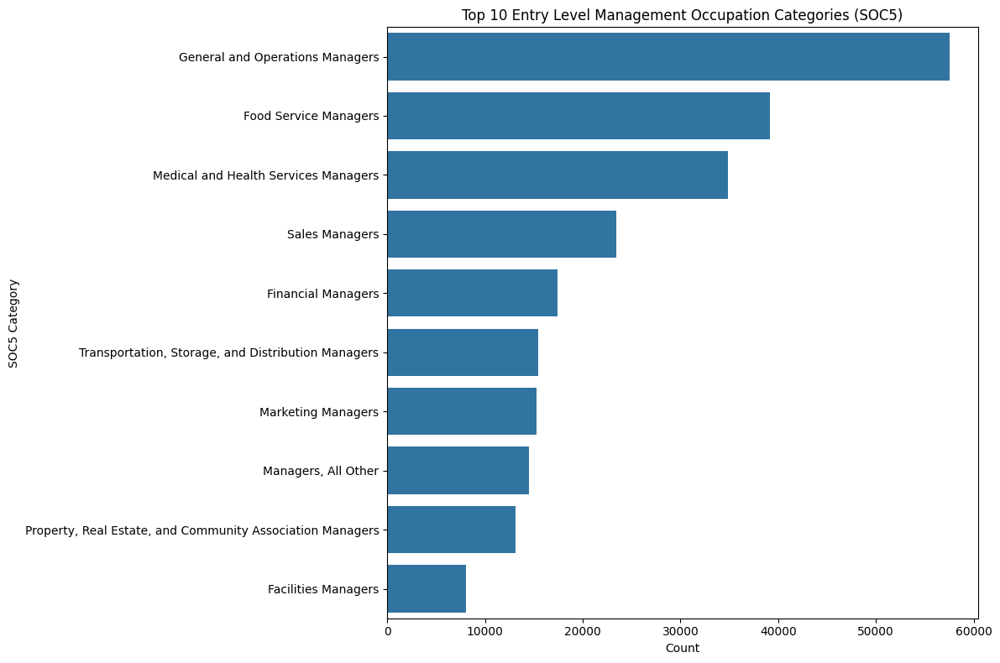


Top Job Titles by SOC5 Category:

Category: General and Operations Managers
  - ET26E045A7E3611CE2: 7908
  - ETBCF5DD72BB5BC69C: 5139
  - ETFDE2EC77DDCB5B2C: 4653

Category: Food Service Managers
  - ETD97012708241EF3D: 5436
  - ET69368BFF4499943A: 2406
  - ET32340120BB9E6B7C: 2192

Category: Medical and Health Services Managers
  - ETF3A6403D61FB906F: 1931
  - ETA4A8A6D5C12B38B6: 1584
  - ET487046171FFD0D16: 1253

Category: Sales Managers
  - ET792DF2C6EE55154C: 3876
  - ETA073AC10FA99C7C0: 938
  - ET3D3FA2630CEA6A60: 798

Category: Financial Managers
  - ET476AD50A29FABD9A: 1716
  - ETADBDB8EF00715D15: 1652
  - ETDE0B7256A75EE190: 519

Salary Ranges by SOC5 Category:

Category: General and Operations Managers
  - Average SALARY: $65,298.94
  - Average SALARY_FROM: $55,160.48
  - Average SALARY_TO: $70,264.82

Category: Food Service Managers
  - Average SALARY: $56,435.58
  - Average SALARY_FROM: $48,891.97
  - Average SALARY_TO: $58,415.26

Category: Medical and Health Services Mana

In [62]:
# Create a distribution of SOC5 names and counts
soc5_distribution = entry_mgmt_raw['SOC_2021_5_NAME'].value_counts().reset_index()
soc5_distribution.columns = ['SOC_2021_5_NAME', 'Count']

# Display the distribution as a table
print("Distribution of SOC5 Categories:")
print(soc5_distribution)

# Calculate percentages
total = soc5_distribution['Count'].sum()
soc5_distribution['Percentage'] = (soc5_distribution['Count'] / total * 100).round(1)

# Create a horizontal bar chart for visualization
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='SOC_2021_5_NAME', data=soc5_distribution.head(10))
plt.title('Top 10 Entry Level Management Occupation Categories (SOC5)')
plt.xlabel('Count')
plt.ylabel('SOC5 Category')
plt.tight_layout()
plt.show()

# Additional Analysis: Check for most common job titles within each top SOC5 category
print("\nTop Job Titles by SOC5 Category:")
for soc5 in soc5_distribution.head(5)['SOC_2021_5_NAME']:
    print(f"\nCategory: {soc5}")
    titles = entry_mgmt_raw[entry_mgmt_raw['SOC_2021_5_NAME'] == soc5]['TITLE'].value_counts().head(3)
    for title, count in titles.items():
        print(f"  - {title}: {count}")

# Check salary distributions by SOC5 category
print("\nSalary Ranges by SOC5 Category:")
for soc5 in soc5_distribution.head(5)['SOC_2021_5_NAME']:
    filtered = entry_mgmt_raw[entry_mgmt_raw['SOC_2021_5_NAME'] == soc5]
    
    # Calculate average salary using available salary information
    salary_cols = ['SALARY', 'SALARY_FROM', 'SALARY_TO']
    avg_salaries = {}
    
    for col in salary_cols:
        avg = filtered[col].mean()
        if pd.notna(avg):
            avg_salaries[col] = avg
    
    print(f"\nCategory: {soc5}")
    for col, avg in avg_salaries.items():
        print(f"  - Average {col}: ${avg:,.2f}")

In [63]:
def plot_skill_rate_by_experience(df,
                                  soc2_code_col='SOC_2021_2',
                                  soc2_name_col='SOC_2021_2_NAME',
                                  skill_col='SKILL_NAME',
                                  exp_col='EXPERIENCE_LEVEL',
                                  rate_col='SKILL_RATE',
                                  category_col='SKILL_CATEGORY',
                                  count_col='SOC2_EXP_POST_COUNT',
                                  n_skills=10,
                                  output_dir='experience_skill_charts',
                                  specific_soc2=None,   # New parameter to specify a single SOC2 or None for all
                                  sort_by_non_entry=True):  # New parameter to sort by non-entry level share
    """
    Plot skill rates by experience level with percentage format.
    If specific_soc2 is None, will aggregate across all SOC2 codes.
    If specific_soc2 is provided, will filter for that specific SOC2 code.
    If sort_by_non_entry is True, will sort skills by their presence in non-entry level positions.
    """
    # 1) rename buckets with new naming scheme
    rename_map = {
        'Entry Level (0-3 years)':      'Entry Level (Less than 3 years)',
        'Mid Level (3-8 years)':        'Middle (3-8 years)',
        'Senior Level (8+ years)':      'Senior (8+ years)'
    }
    df = df.copy()
    df[exp_col] = df[exp_col].map(rename_map).fillna(df[exp_col])
    
    # 2) your category colors
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',
        'Quantitative & Statistical Reasoning':            '#8c564b',
        'Adaptive & Reflective Rationality':               '#17becf'  # Changed to match first function
    }
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Updated experience level order with new names
    exp_order = [
        'Entry Level (Less than 3 years)',
        'Middle (3-8 years)',
        'Senior (8+ years)'
    ]
    
    # If specific_soc2 is None, plot for all SOC2 codes combined
    if specific_soc2 is None:
        # Aggregate the data across all SOC2 codes
        aggregated_data = []
        
        for exp_level in exp_order:
            if exp_level not in df[exp_col].unique():
                continue
                
            # Filter by experience level
            df_exp = df[df[exp_col] == exp_level]
            
            # Aggregate skill rates by skill name
            agg_dict = {
                rate_col: 'mean',
                category_col: lambda x: x.mode().iloc[0] if not x.empty else None,
                count_col: 'sum'  # Sum up the posting counts
            }
            
            # Group by skill and get the average skill rate
            skill_agg = df_exp.groupby(skill_col).agg(agg_dict).reset_index()
            
            # Add experience level back
            skill_agg[exp_col] = exp_level
            
            aggregated_data.append(skill_agg)
        
        if not aggregated_data:
            print("No data available for the specified criteria")
            return
            
        # Combine all the aggregated data
        combined_df = pd.concat(aggregated_data, ignore_index=True)
        
        # Create a pivot table for skill sorting (if sorting by non-entry level)
        if sort_by_non_entry:
            # First, create a flag for non-entry level
            combined_df['is_non_entry'] = ~combined_df[exp_col].str.contains('Entry Level')
            
            # Create a pivot table to get skill rates by experience level
            pivot_df = combined_df.pivot_table(
                index=skill_col, 
                columns='is_non_entry', 
                values=rate_col, 
                aggfunc='mean'
            ).reset_index()
            
            # Fill NaN values with 0
            if True in pivot_df.columns:
                pivot_df[True] = pivot_df[True].fillna(0)
            else:
                pivot_df[True] = 0
                
            # Sort by non-entry level skill rate
            skill_order = pivot_df.sort_values(True, ascending=False)[skill_col].tolist()
            
            # Map skills to their order
            skill_order_map = {skill: i for i, skill in enumerate(skill_order)}
            combined_df['skill_order'] = combined_df[skill_col].map(skill_order_map)
        
        # Plot the combined data
        fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=False)
        
        # Get total postings count by experience level
        postings_count = combined_df.groupby(exp_col)[count_col].sum()
        
        for i, lvl in enumerate(exp_order):
            ax = axes[i]
            df_lvl = combined_df[combined_df[exp_col] == lvl]
            
            if df_lvl.empty:
                ax.set_title(f"{lvl}\n(no data)")
                ax.axis('off')
                continue
            
            # If sorting by non-entry level and in the all-SOC view
            if sort_by_non_entry and specific_soc2 is None:
                # Get top N skills based on the consistent ordering for all skill rate charts
                all_skills = set(combined_df[skill_col].unique())
                sorted_skills = sorted(all_skills, key=lambda s: skill_order_map.get(s, 9999))
                top_n_skills = sorted_skills[:n_skills]
                top10 = df_lvl[df_lvl[skill_col].isin(top_n_skills)]
                
                # Sort display order by skill_order
                top10 = top10.sort_values('skill_order', ascending=True)
            else:
                # Get top skills for this experience level by rate
                top10 = (df_lvl
                        .sort_values(rate_col, ascending=False)
                        .head(n_skills))
            
            y = np.arange(len(top10))
            colors = [category_colors.get(cat, '#333333')
                    for cat in top10[category_col]]
            
            # Convert skill rate to percentage for display
            percentage_values = top10[rate_col] * 100
            
            bars = ax.barh(y, percentage_values, height=0.7,
                          color=colors, edgecolor='black')
            
            ax.set_title(lvl, fontsize=14)
            ax.set_yticks(y)
            ax.set_yticklabels(top10[skill_col], fontsize=9)
            ax.invert_yaxis()   # largest at top
            ax.set_xlabel('Skill Rate (%)')  # Updated label
            ax.grid(axis='x', linestyle='--', alpha=0.3)
            
            # annotate with percentage
            for j, bar in enumerate(bars):
                ax.text(bar.get_width() + 0.5,  # More space for percentage values
                       bar.get_y() + bar.get_height()/2,
                       f"{percentage_values.iloc[j]:.1f}%",  # Format as percentage
                       va='center', fontsize=8)
        
        # shared legend at bottom
        handles = [plt.Line2D([0], [0], color=c, lw=10)
                  for c in category_colors.values()]
        category_labels = {
            'Structured & Systematic Decision-Making Process': 'Decision-Making Skills',
            'Quantitative & Statistical Reasoning': 'Quantitative Skills',
            'Adaptive & Reflective Rationality': 'Adaptive Skills'
        }
        labels = [category_labels.get(cat, cat) for cat in category_colors.keys()]
        fig.legend(handles, labels, title='Skill Category',
                  loc='lower center', ncol=len(labels), frameon=False)
        
        # note about postings
        note_lines = [
            f"{lvl}: {postings_count.get(lvl, 0):,} postings"
            for lvl in exp_order if lvl in postings_count.index
        ]
        note = "Postings per level:\n" + "\n".join(note_lines)
        fig.text(0.5, 0.08, note, ha='center', fontsize=9, style='italic')
        
        if sort_by_non_entry:
            fig.suptitle(f"Top {n_skills} Skills by Experience Level Across All Occupations\n(Skills Ranked by Non-Entry Level Demand)", fontsize=16)
        else:
            fig.suptitle(f"Top {n_skills} Skills by Experience Level Across All Occupations", fontsize=16)
        # leave extra room at bottom for legend & note
        plt.tight_layout(rect=[0, 0.15, 1, 0.95])
        
        # save & show
        out = f"{output_dir}/skills_all_occupations.png"
        fig.savefig(out, dpi=300)
        plt.show()
        plt.close(fig)
        
        print(f"All-occupations chart saved to {out}")
        
    # Original functionality: loop through each SOC2 code
    if specific_soc2 is not None:
        # Filter for specific SOC2 if provided
        soc2_list = [specific_soc2]
    else:
        soc2_list = df[soc2_code_col].unique()
        
    for soc2 in soc2_list:
        sub = df[df[soc2_code_col] == soc2]
        name = sub[soc2_name_col].iloc[0]
        if sub[exp_col].nunique() < 2:
            continue
        
        # postings count per bucket
        postings_count = sub.groupby(exp_col)[count_col].first()
        
        # 3 panels
        fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=False)
        
        for i, lvl in enumerate(exp_order):
            ax = axes[i]
            df_lvl = sub[sub[exp_col] == lvl]
            if df_lvl.empty:
                ax.set_title(f"{lvl}\n(no data)")
                ax.axis('off')
                continue
            
            # each bucket: top 10
            top10 = (df_lvl
                     .sort_values(rate_col, ascending=False)
                     .head(n_skills))
            
            y = np.arange(len(top10))
            colors = [category_colors.get(cat, '#333333')
                      for cat in top10[category_col]]
            
            # Convert skill rate to percentage for display
            percentage_values = top10[rate_col] * 100
            
            bars = ax.barh(y, percentage_values, height=0.7,
                           color=colors, edgecolor='black')
            
            ax.set_title(lvl, fontsize=14)
            ax.set_yticks(y)
            ax.set_yticklabels(top10[skill_col], fontsize=9)
            ax.invert_yaxis()   # largest at top
            ax.set_xlabel('Skill Rate (%)')  # Updated label
            ax.grid(axis='x', linestyle='--', alpha=0.3)
            
            # annotate with percentage
            for j, bar in enumerate(bars):
                ax.text(bar.get_width() + 0.5,  # More space for percentage values
                        bar.get_y() + bar.get_height()/2,
                        f"{percentage_values.iloc[j]:.1f}%",  # Format as percentage
                        va='center', fontsize=8)
        
        # shared legend at bottom
        handles = [plt.Line2D([0], [0], color=c, lw=10)
                   for c in category_colors.values()]
        category_labels = {
            'Structured & Systematic Decision-Making Process': 'Decision-Making Skills',
            'Quantitative & Statistical Reasoning': 'Quantitative Skills',
            'Adaptive & Reflective Rationality': 'Adaptive Skills'
        }
        labels = [category_labels.get(cat, cat) for cat in category_colors.keys()]
        fig.legend(handles, labels, title='Skill Category',
                   loc='lower center', ncol=len(labels), frameon=False)
        
        # note about postings
        note_lines = [
            f"{lvl}: {postings_count.get(lvl, 0):,} postings"
            for lvl in exp_order
        ]
        note = "Postings per level:\n" + "\n".join(note_lines)
        fig.text(0.5, 0.09, note, ha='center', fontsize=9, style='italic')
        
        fig.suptitle(f"Top {n_skills} Skills by Experience in {name}", fontsize=16)
        # leave extra room at bottom for legend & note
        plt.tight_layout(rect=[0, 0.15, 1, 0.95])
        
        # save & show
        out = f"{output_dir}/skills_{soc2}_{name.replace(' ','_')}.png"
        fig.savefig(out, dpi=300)
        plt.show()
        plt.close(fig)
    
    print(f"Charts saved under {output_dir}")



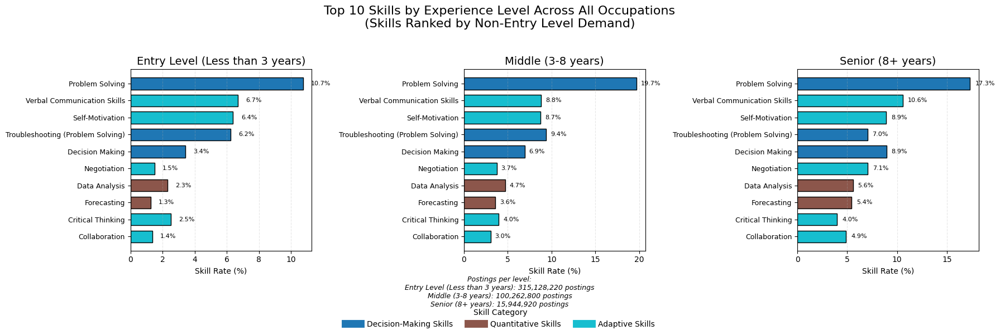

All-occupations chart saved to experience_skill_charts/skills_all_occupations.png


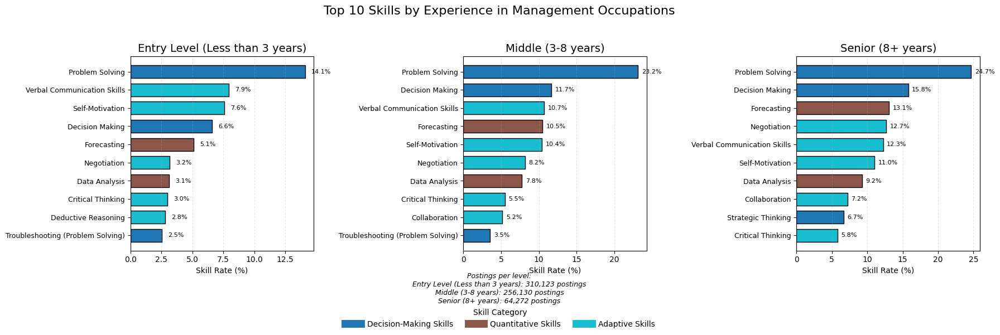

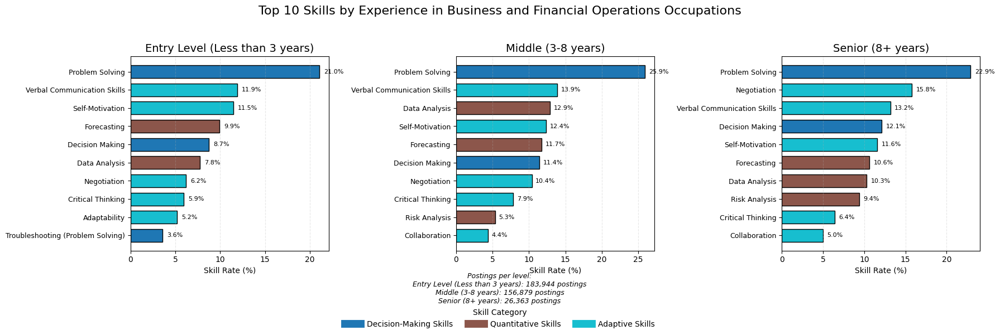

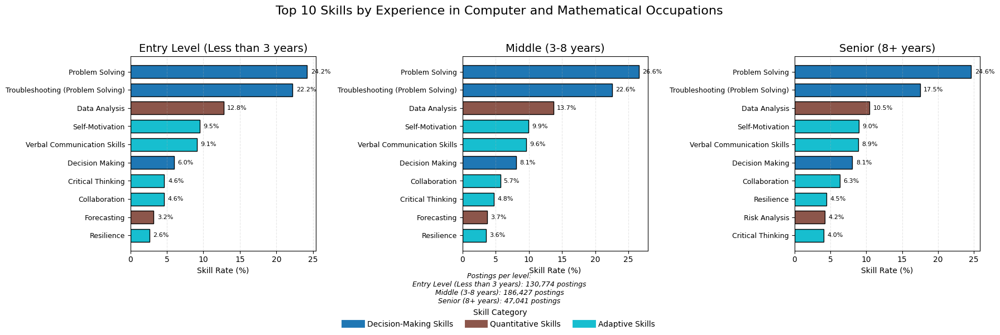

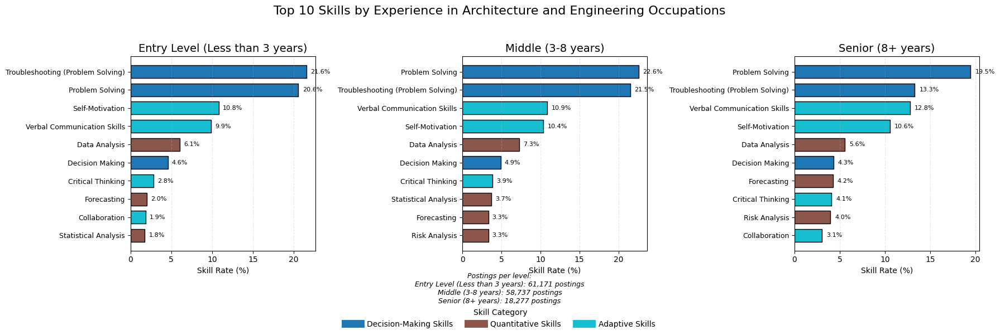

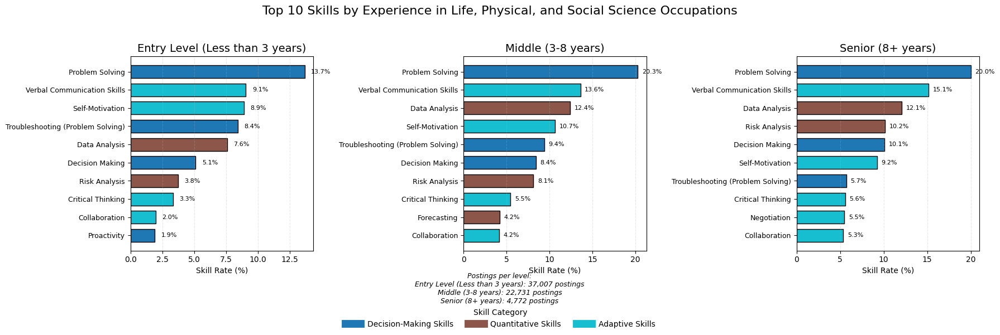

...

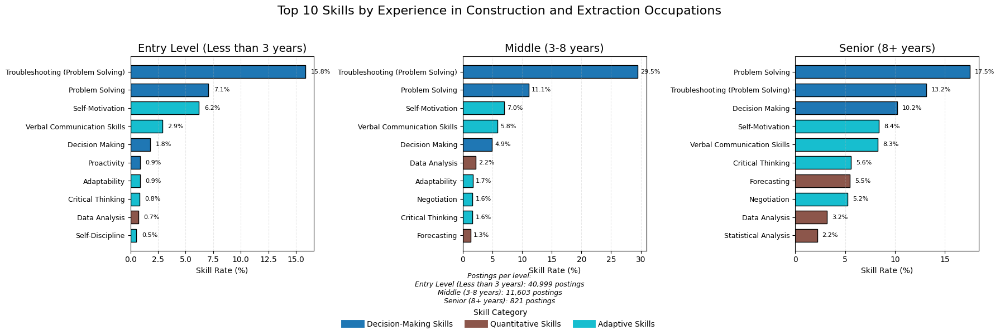

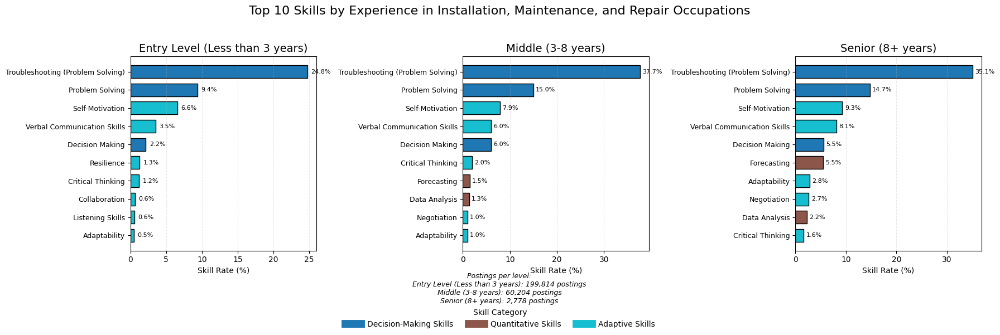

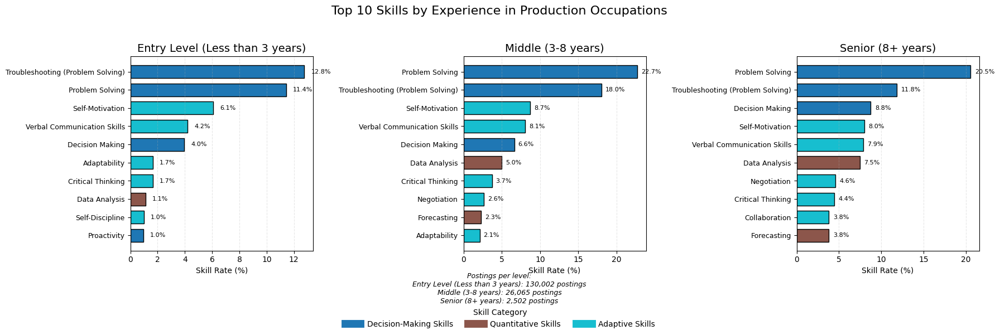

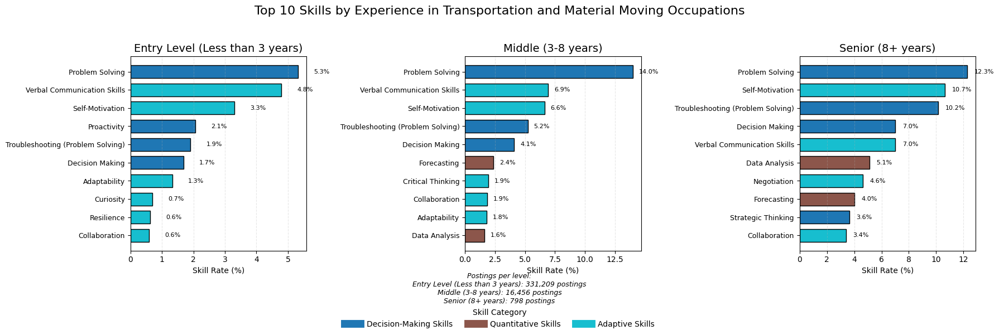

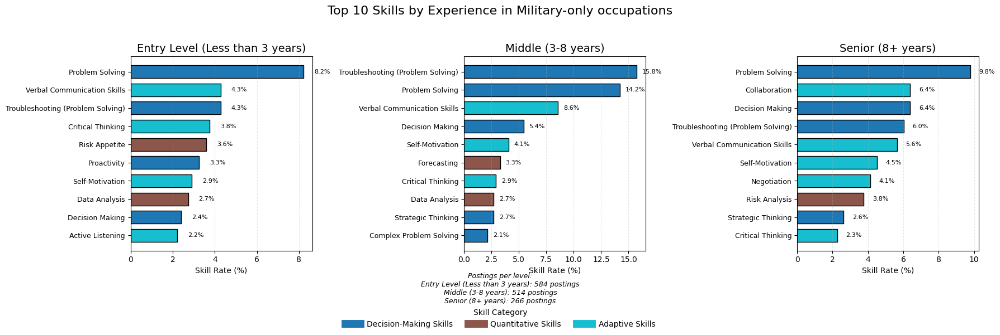

Charts saved under experience_skill_charts


In [64]:
# Usage examples:
# 1. To generate charts for all SOC2 codes with percentages:
plot_skill_rate_by_experience(occ_skills_by_exp)


Starting analysis of skills by experience level...
Created output directory: skill_comparison_charts
Entry-level data points: 1636
Non-entry-level data points: 2759
Generating overall skills comparison...
Overall comparison chart saved to skill_comparison_charts/skills_comparison_all_occupations.png
Found 23 SOC2 groups
Processing comparison for group 1/23: Management Occupations
  Comparison chart for Management Occupations saved
Processing comparison for group 2/23: Business and Financial Operations Occupations
  Comparison chart for Business and Financial Operations Occupations saved
Processing comparison for group 3/23: Computer and Mathematical Occupations
  Comparison chart for Computer and Mathematical Occupations saved
Processing comparison for group 4/23: Architecture and Engineering Occupations
  Comparison chart for Architecture and Engineering Occupations saved
Processing comparison for group 5/23: Life, Physical, and Social Science Occupations
  Comparison chart for Life, 

/tmp/ipykernel_38116/348292314.py:226: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(14, 10))


  Comparison chart for Installation, Maintenance, and Repair Occupations saved
Processing comparison for group 21/23: Production Occupations
  Comparison chart for Production Occupations saved
Processing comparison for group 22/23: Transportation and Material Moving Occupations
  Comparison chart for Transportation and Material Moving Occupations saved
Processing comparison for group 23/23: Military-only occupations
  Comparison chart for Military-only occupations saved
All comparison charts saved to the 'skill_comparison_charts' directory


,Skill,Entry Level Rate,Non-Entry Level Rate,Difference,Category
9,Problem Solving,0.107472,0.185338,-0.077866,Structured & Systematic Decision-Making Process
10,Decision Making,0.034105,0.079091,-0.044985,Structured & Systematic Decision-Making Process
13,Negotiation,0.015027,0.053718,-0.038691,Adaptive & Reflective Rationality
0,Forecasting,0.012600,0.044703,-0.032103,Quantitative & Statistical Reasoning
2,Verbal Communication Skills,0.066759,0.096631,-0.029871,Adaptive & Reflective Rationality
7,Data Analysis,0.022983,0.051327,-0.028343,Quantitative & Statistical Reasoning
4,Collaboration,0.013527,0.039347,-0.025820,Adaptive & Reflective Rationality
11,Self-Motivation,0.063874,0.088210,-0.024336,Adaptive & Reflective Rationality
5,Troubleshooting (Problem Solving),0.062412,0.082401,-0.019989,Structured & Systematic Decision-Making Process
15,Risk Analysis,0.009669,0.027541,-0.017872,Quantitative & Statistical Reasoning


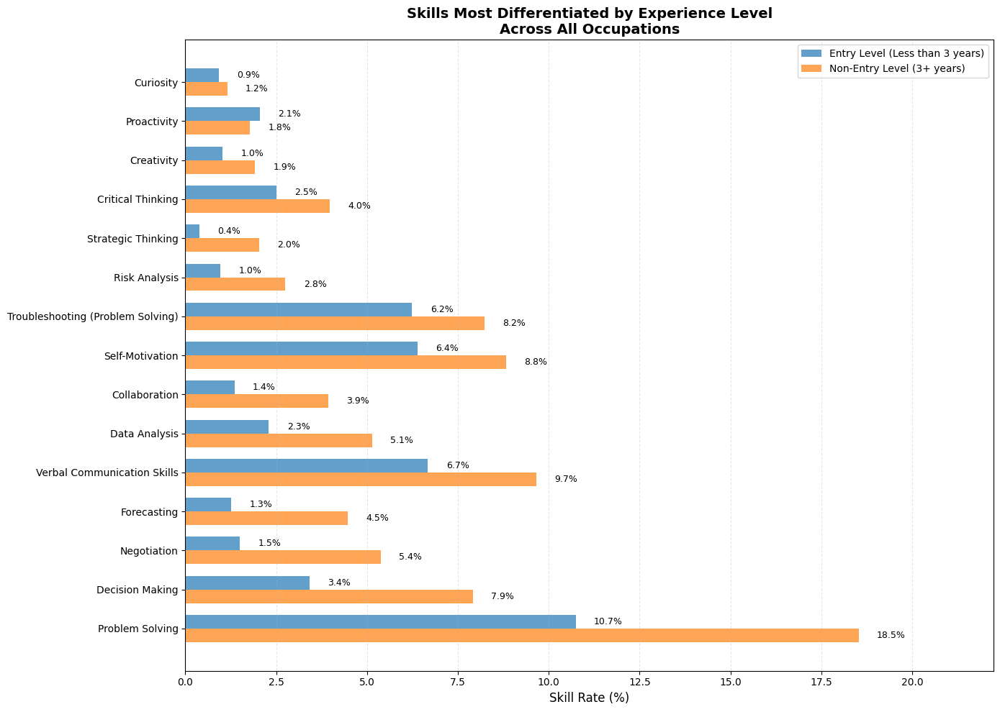

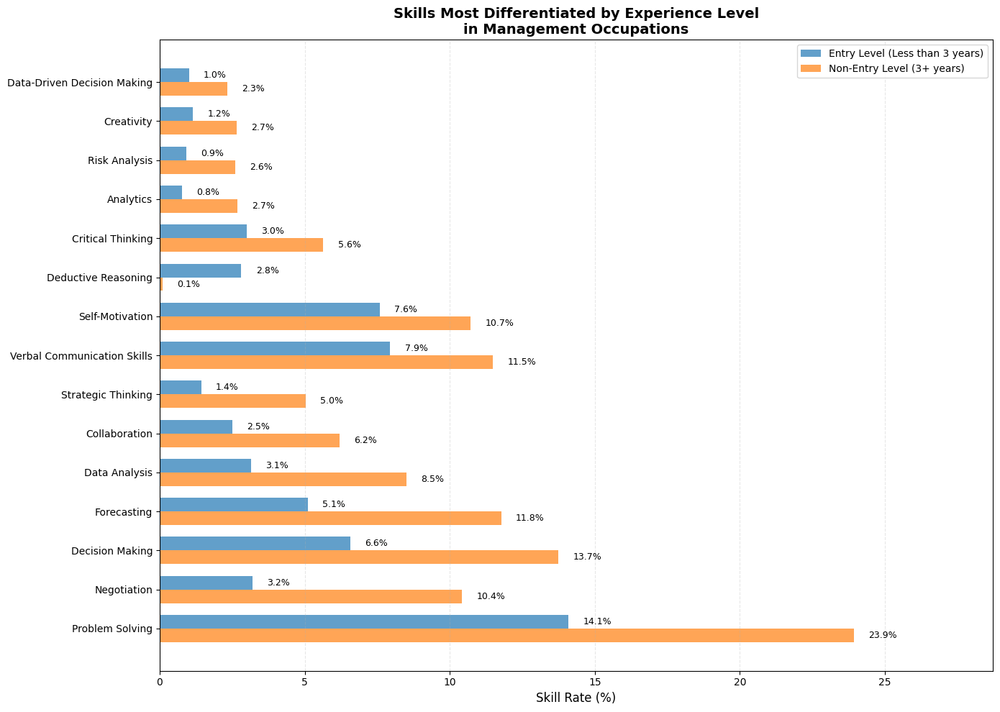

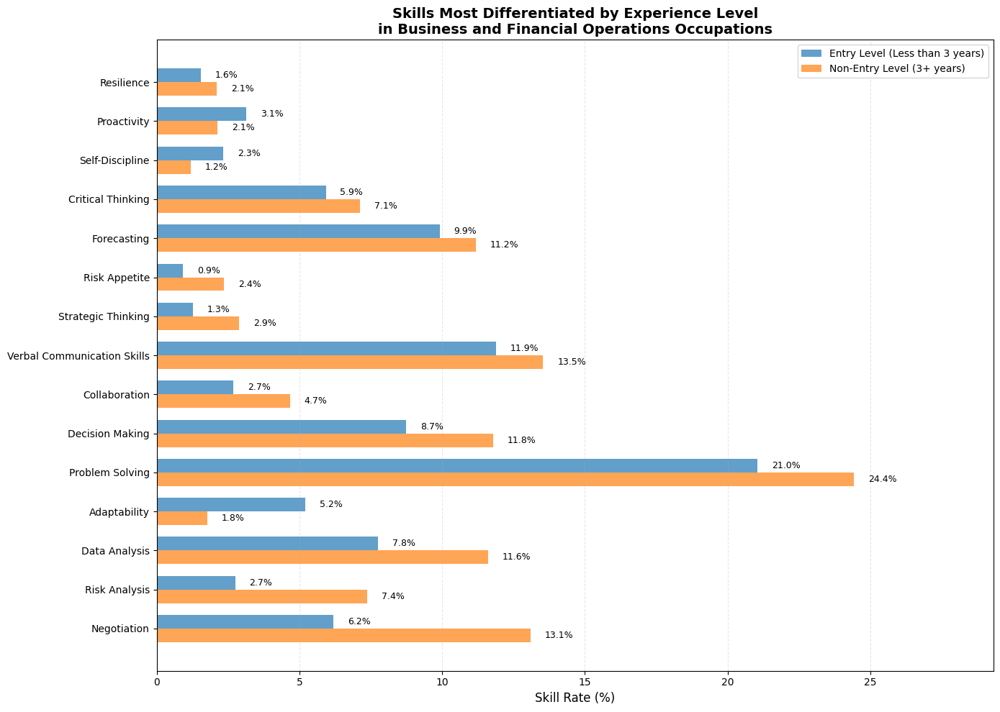

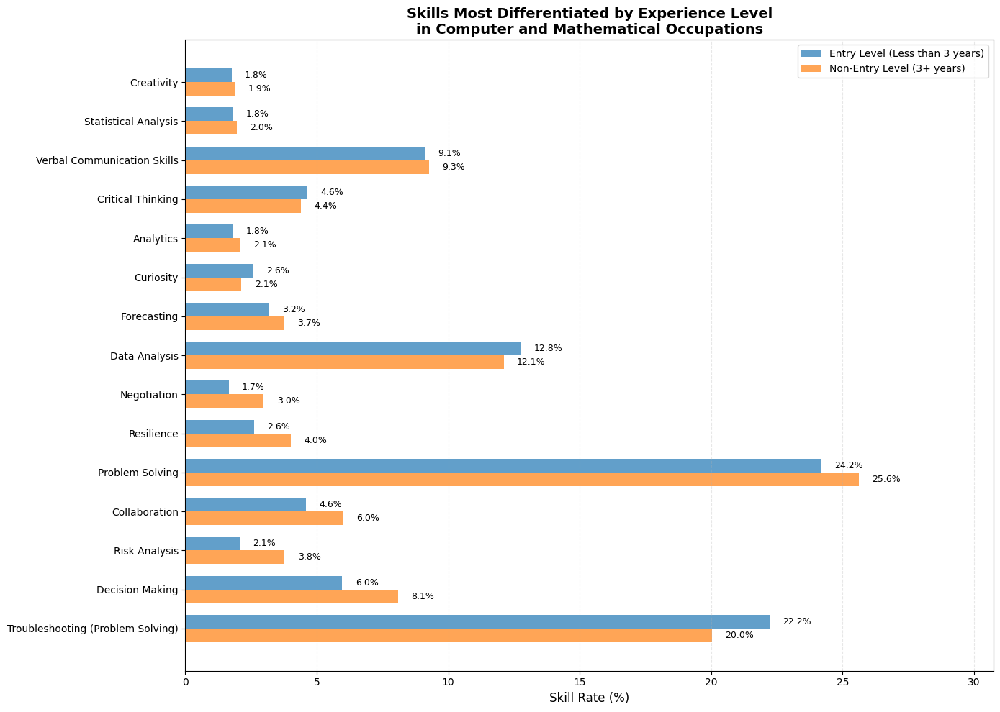

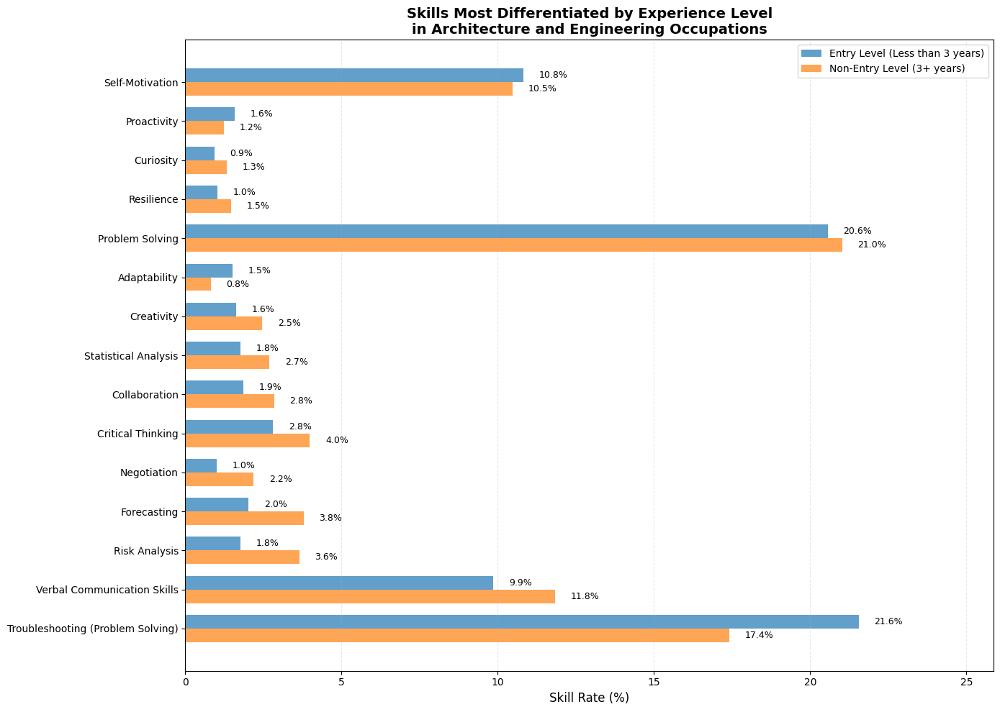

...

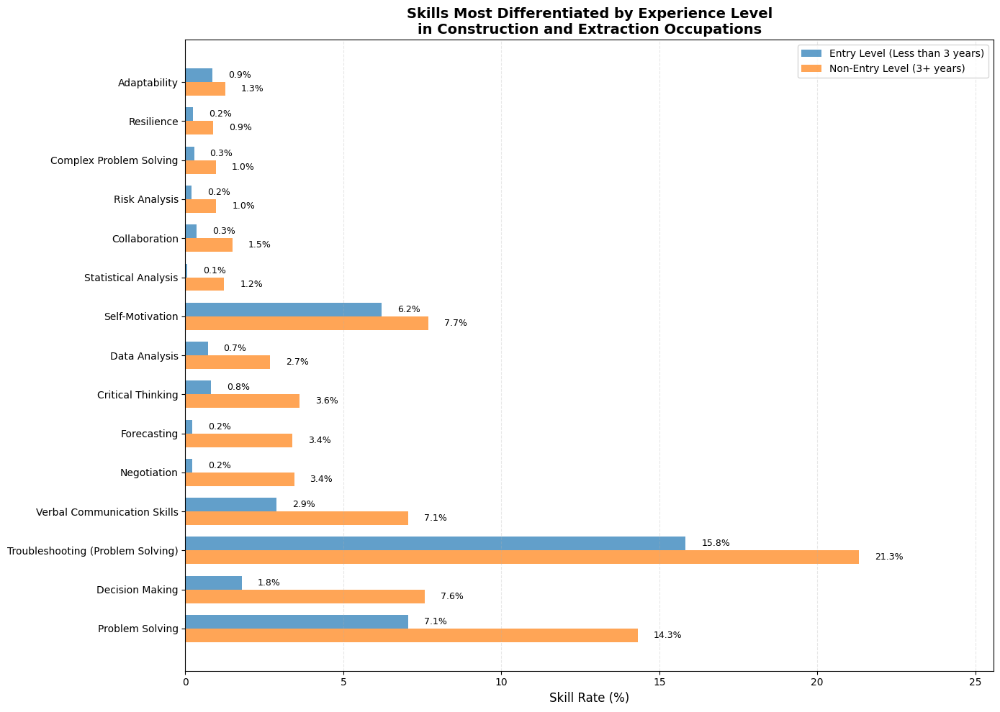

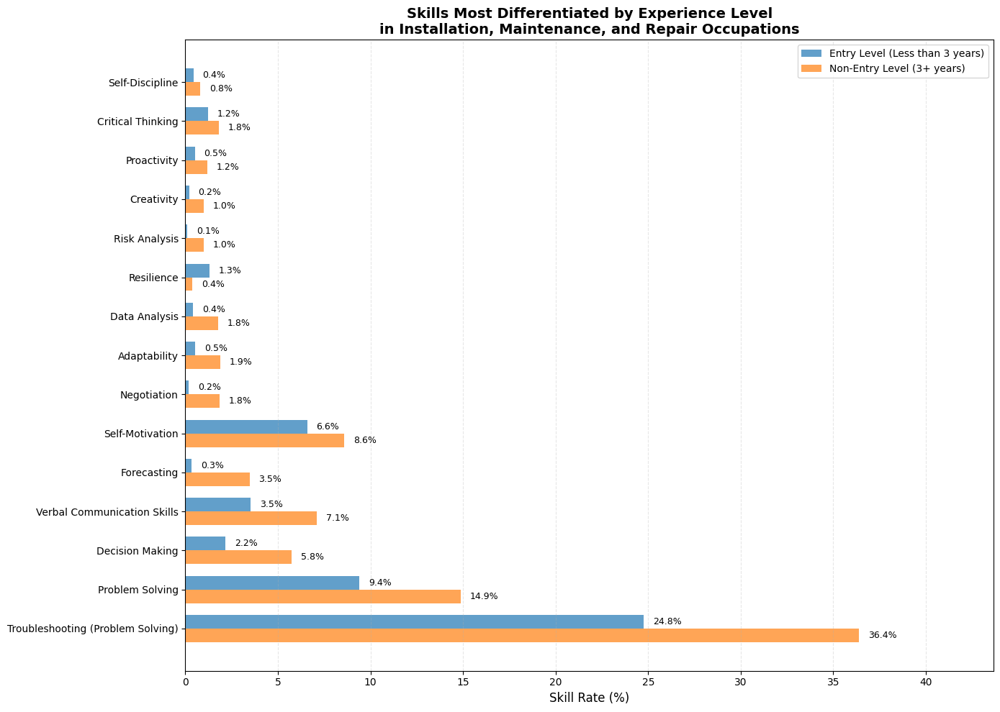

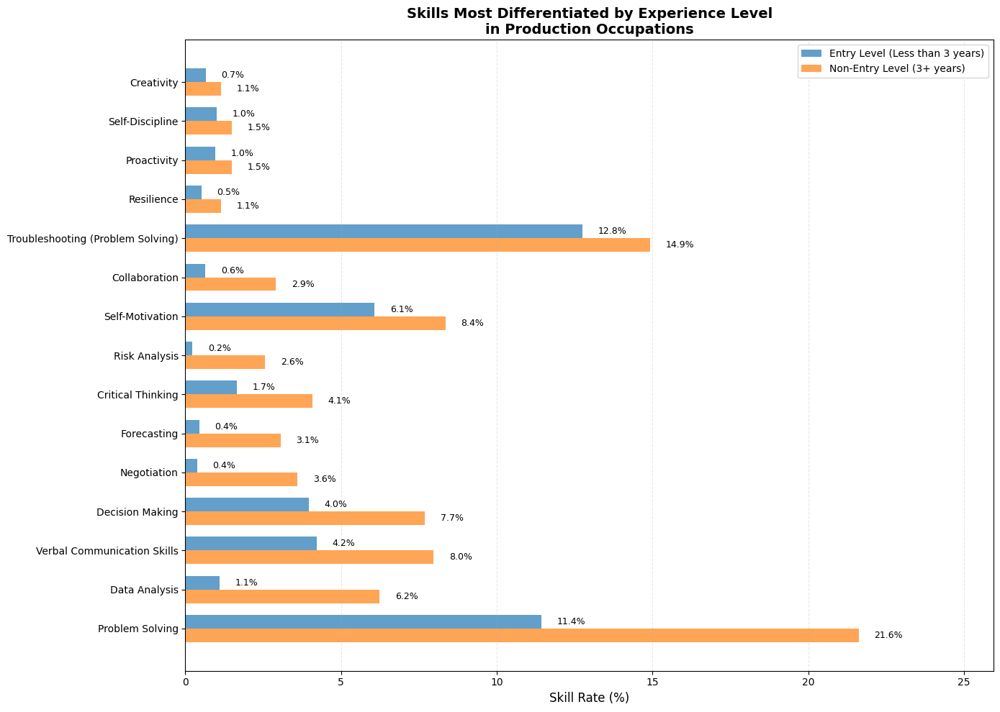

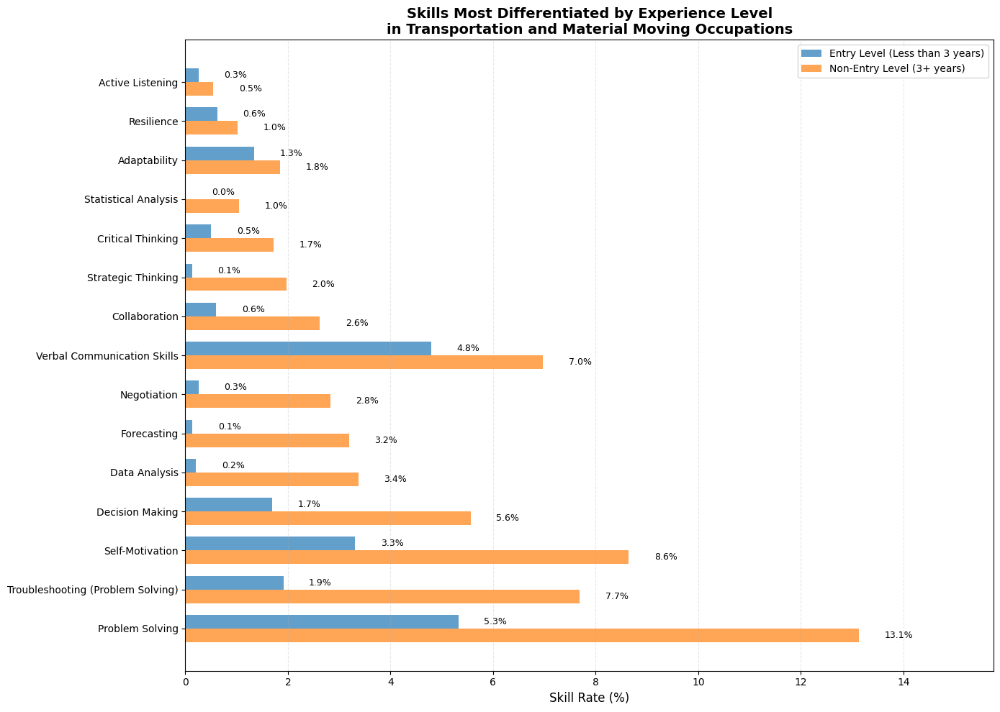

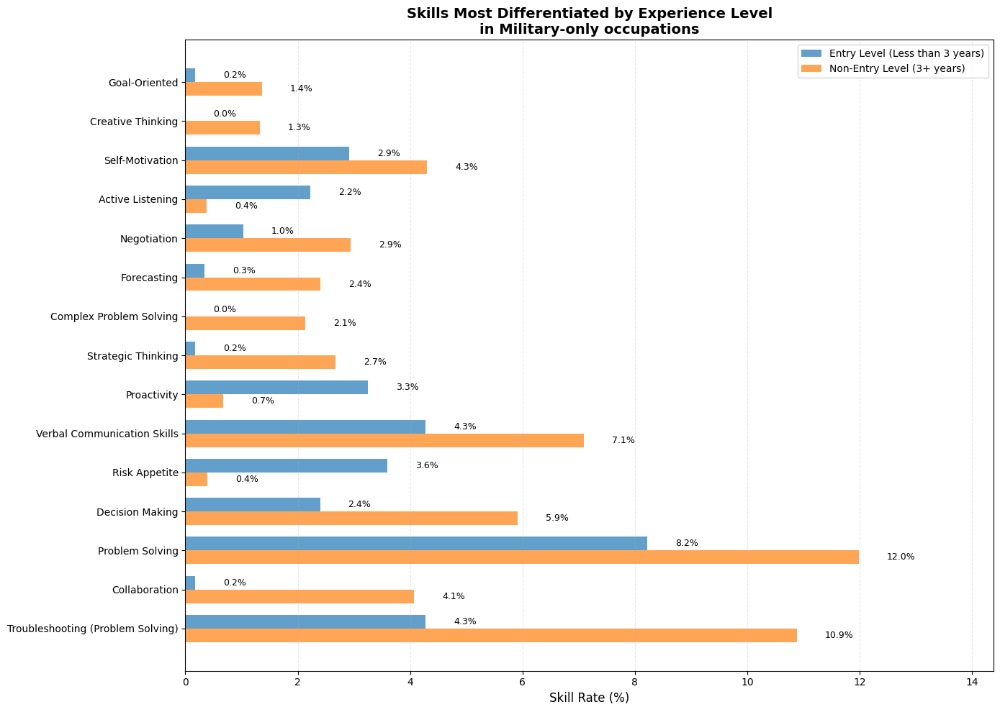

In [65]:
def compare_skills_by_experience(df, soc2_col='SOC_2021_2_NAME', 
                              skill_col='SKILL_NAME', 
                              category_col='SKILL_CATEGORY',
                              exp_col='EXPERIENCE_LEVEL',
                              rate_col='SKILL_RATE',
                              n_skills=15, 
                              output_dir='skill_comparison_charts'):
    """
    Create charts comparing skill rates between entry-level and non-entry-level jobs.
    Shows skill rates as percentages instead of proportions.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Skills dataframe with experience level information
    soc2_col : str
        Column name containing SOC2 group names
    skill_col : str
        Column name containing skill names
    category_col : str
        Column name containing skill categories
    exp_col : str
        Column name containing experience level
    rate_col : str
        Column name containing skill rate values
    n_skills : int
        Number of top skills to display in comparison
    output_dir : str
        Directory to save the charts
    """
    print("Starting analysis of skills by experience level...")
    
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created output directory: {output_dir}")
    
    # Rename the experience levels
    rename_map = {
        'Entry Level (0-3 years)': 'Entry Level (Less than 3 years)',
        'Mid Level (3-8 years)': 'Middle (3-8 years)',
        'Senior Level (8+ years)': 'Senior (8+ years)'
    }
    df = df.copy()
    df[exp_col] = df[exp_col].map(rename_map).fillna(df[exp_col])
    
    # Filter for entry-level and non-entry-level data
    entry_level_mask = df[exp_col].str.contains('Entry Level', case=False)
    entry_level_df = df[entry_level_mask]
    non_entry_level_df = df[~entry_level_mask]
    
    print(f"Entry-level data points: {len(entry_level_df)}")
    print(f"Non-entry-level data points: {len(non_entry_level_df)}")
    
    # Fixed colors for skill categories
    category_colors = {
        'Structured & Systematic Decision-Making Process': '#1f77b4',  # Blue
        'Quantitative & Statistical Reasoning': '#8c564b',            # Brown
        'Adaptive & Reflective Rationality': '#17becf'                # Light blue/cyan
    }
    
    # 1. Compare top skills overall (all SOC groups combined)
    print("Generating overall skills comparison...")
    
    # Get top skills in entry-level jobs
    entry_level_top_skills = entry_level_df.groupby(skill_col).agg({
        rate_col: 'mean',
        category_col: lambda x: x.mode().iloc[0] if not x.empty else None,
    }).reset_index()
    
    # Get top skills in non-entry-level jobs
    non_entry_level_top_skills = non_entry_level_df.groupby(skill_col).agg({
        rate_col: 'mean',
        category_col: lambda x: x.mode().iloc[0] if not x.empty else None,
    }).reset_index()
    
    # Create a combined DataFrame for comparison
    # Get the top skills from each group
    entry_top_skills = set(entry_level_top_skills.sort_values(rate_col, ascending=False).head(n_skills)[skill_col])
    non_entry_top_skills = set(non_entry_level_top_skills.sort_values(rate_col, ascending=False).head(n_skills)[skill_col])
    
    # Union of top skills from both groups
    combined_top_skills = entry_top_skills.union(non_entry_top_skills)
    
    # Create comparison data
    comparison_data = []
    for skill in combined_top_skills:
        entry_rate = entry_level_top_skills[entry_level_top_skills[skill_col] == skill][rate_col].iloc[0] if skill in entry_level_top_skills[skill_col].values else 0
        non_entry_rate = non_entry_level_top_skills[non_entry_level_top_skills[skill_col] == skill][rate_col].iloc[0] if skill in non_entry_level_top_skills[skill_col].values else 0
        category = entry_level_top_skills[entry_level_top_skills[skill_col] == skill][category_col].iloc[0] if skill in entry_level_top_skills[skill_col].values else non_entry_level_top_skills[non_entry_level_top_skills[skill_col] == skill][category_col].iloc[0]
        
        # Calculate difference (for sorting)
        diff = entry_rate - non_entry_rate
        
        comparison_data.append({
            'Skill': skill,
            'Entry Level Rate': entry_rate,
            'Non-Entry Level Rate': non_entry_rate,
            'Difference': diff,
            'Category': category
        })
    
    # Convert to DataFrame and sort by absolute difference
    comparison_df = pd.DataFrame(comparison_data)
    comparison_df = comparison_df.sort_values('Difference', key=abs, ascending=False)
    
    # Limit to top n_skills by difference magnitude
    comparison_df = comparison_df.head(n_skills)
    
    # Create the comparison chart
    plt.figure(figsize=(14, 10))
    
    # Set up the plot
    y_pos = np.arange(len(comparison_df))
    width = 0.35
    
    # Convert rates to percentages for plotting
    entry_percentages = comparison_df['Entry Level Rate'] * 100
    non_entry_percentages = comparison_df['Non-Entry Level Rate'] * 100
    
    # Plot bars for entry-level and non-entry-level with percentage values
    plt.barh(y_pos + width/2, entry_percentages, width, 
             label='Entry Level (Less than 3 years)', color='#1f77b4', alpha=0.7)
    plt.barh(y_pos - width/2, non_entry_percentages, width,
             label='Non-Entry Level (3+ years)', color='#ff7f0e', alpha=0.7)
    
    # Add skill labels
    plt.yticks(y_pos, comparison_df['Skill'], fontsize=10)
    
    # Add percentage value labels
    for i, (idx, row) in enumerate(comparison_df.iterrows()):
        # Entry level value
        plt.text(max(0.5, entry_percentages.iloc[i] + 0.5), 
               i + width/2, 
               f'{entry_percentages.iloc[i]:.1f}%', 
               va='center', fontsize=9)
        
        # Non-entry level value
        plt.text(max(0.5, non_entry_percentages.iloc[i] + 0.5), 
               i - width/2, 
               f'{non_entry_percentages.iloc[i]:.1f}%', 
               va='center', fontsize=9)
    
    # Set up legend, title, and labels
    plt.legend(loc='upper right')
    plt.title('Skills Most Differentiated by Experience Level\nAcross All Occupations', 
              fontsize=14, fontweight='bold')
    plt.xlabel('Skill Rate (%)', fontsize=12)
    
    # Set x-axis limit
    max_percentage = max(entry_percentages.max(), non_entry_percentages.max())
    plt.xlim(0, max_percentage * 1.2)  # Extra space for labels
    
    # Add grid lines
    plt.grid(axis='x', linestyle='--', alpha=0.3)
    
    # Tight layout
    plt.tight_layout()
    
    # Save the chart
    plt.savefig(f"{output_dir}/skills_comparison_all_occupations.png", dpi=300, bbox_inches='tight')
    
    print(f"Overall comparison chart saved to {output_dir}/skills_comparison_all_occupations.png")
    
    # 2. Generate comparison for each SOC2 group
    soc_groups = df[soc2_col].unique()
    print(f"Found {len(soc_groups)} SOC2 groups")
    
    for i, soc in enumerate(soc_groups):
        print(f"Processing comparison for group {i+1}/{len(soc_groups)}: {soc}")
        
        # Filter data for this SOC group
        soc_entry_df = entry_level_df[entry_level_df[soc2_col] == soc]
        soc_non_entry_df = non_entry_level_df[non_entry_level_df[soc2_col] == soc]
        
        # Check if we have enough data
        if len(soc_entry_df) == 0 or len(soc_non_entry_df) == 0:
            print(f"  Insufficient data for {soc}: Entry={len(soc_entry_df)}, Non-Entry={len(soc_non_entry_df)}")
            continue
        
        # Get top skills in this SOC group
        soc_entry_top = soc_entry_df.groupby(skill_col).agg({
            rate_col: 'mean',
            category_col: lambda x: x.mode().iloc[0] if not x.empty else None,
        }).reset_index()
        
        soc_non_entry_top = soc_non_entry_df.groupby(skill_col).agg({
            rate_col: 'mean',
            category_col: lambda x: x.mode().iloc[0] if not x.empty else None,
        }).reset_index()
        
        # Create a combined DataFrame for comparison
        # Get the top skills from each group
        entry_top = set(soc_entry_top.sort_values(rate_col, ascending=False).head(n_skills)[skill_col])
        non_entry_top = set(soc_non_entry_top.sort_values(rate_col, ascending=False).head(n_skills)[skill_col])
        
        # Union of top skills from both groups
        soc_combined_top = entry_top.union(non_entry_top)
        
        # Create comparison data
        soc_comparison = []
        for skill in soc_combined_top:
            entry_rate = soc_entry_top[soc_entry_top[skill_col] == skill][rate_col].iloc[0] if skill in soc_entry_top[skill_col].values else 0
            non_entry_rate = soc_non_entry_top[soc_non_entry_top[skill_col] == skill][rate_col].iloc[0] if skill in soc_non_entry_top[skill_col].values else 0
            category = soc_entry_top[soc_entry_top[skill_col] == skill][category_col].iloc[0] if skill in soc_entry_top[skill_col].values else soc_non_entry_top[soc_non_entry_top[skill_col] == skill][category_col].iloc[0]
            
            # Calculate difference (for sorting)
            diff = entry_rate - non_entry_rate
            
            soc_comparison.append({
                'Skill': skill,
                'Entry Level Rate': entry_rate,
                'Non-Entry Level Rate': non_entry_rate,
                'Difference': diff,
                'Category': category
            })
        
        # Convert to DataFrame and sort by absolute difference
        soc_comparison_df = pd.DataFrame(soc_comparison)
        soc_comparison_df = soc_comparison_df.sort_values('Difference', key=abs, ascending=False)
        
        # Limit to top n_skills by difference magnitude
        soc_comparison_df = soc_comparison_df.head(n_skills)
        
        # Create the comparison chart
        plt.figure(figsize=(14, 10))
        
        # Set up the plot
        y_pos = np.arange(len(soc_comparison_df))
        width = 0.35
        
        # Convert rates to percentages for plotting
        soc_entry_percentages = soc_comparison_df['Entry Level Rate'] * 100
        soc_non_entry_percentages = soc_comparison_df['Non-Entry Level Rate'] * 100
        
        # Plot bars for entry-level and non-entry-level with percentage values
        plt.barh(y_pos + width/2, soc_entry_percentages, width, 
                 label='Entry Level (Less than 3 years)', color='#1f77b4', alpha=0.7)
        plt.barh(y_pos - width/2, soc_non_entry_percentages, width,
                 label='Non-Entry Level (3+ years)', color='#ff7f0e', alpha=0.7)
        
        # Add skill labels
        plt.yticks(y_pos, soc_comparison_df['Skill'], fontsize=10)
        
        # Add percentage value labels
        for j, (idx, row) in enumerate(soc_comparison_df.iterrows()):
            # Entry level value
            plt.text(max(0.5, soc_entry_percentages.iloc[j] + 0.5), 
                   j + width/2, 
                   f'{soc_entry_percentages.iloc[j]:.1f}%', 
                   va='center', fontsize=9)
            
            # Non-entry level value
            plt.text(max(0.5, soc_non_entry_percentages.iloc[j] + 0.5), 
                   j - width/2, 
                   f'{soc_non_entry_percentages.iloc[j]:.1f}%', 
                   va='center', fontsize=9)
        
        # Set up legend, title, and labels
        plt.legend(loc='upper right')
        plt.title(f'Skills Most Differentiated by Experience Level\nin {soc}', 
                  fontsize=14, fontweight='bold')
        plt.xlabel('Skill Rate (%)', fontsize=12)
        
        # Set x-axis limit
        max_percentage = max(soc_entry_percentages.max(), soc_non_entry_percentages.max())
        plt.xlim(0, max_percentage * 1.2)  # Extra space for labels
        
        # Add grid lines
        plt.grid(axis='x', linestyle='--', alpha=0.3)
        
        # Tight layout
        plt.tight_layout()
        
        # Save the chart
        safe_soc_name = soc.replace('/', '_').replace(' ', '_')
        plt.savefig(f"{output_dir}/skills_comparison_{safe_soc_name}.png", dpi=300, bbox_inches='tight')
        
        print(f"  Comparison chart for {soc} saved")
    
    print(f"All comparison charts saved to the '{output_dir}' directory")
    
    return comparison_df  # Return the overall comparison data for further analysis

# Example usage
compare_skills_by_experience(occ_skills_by_exp, 'SOC_2021_2_NAME', 'SKILL_NAME', 'SKILL_CATEGORY', 'EXPERIENCE_LEVEL', 'SKILL_RATE')